### Question 1

In [2]:
import pandas as pd 
import numpy as np 
import seaborn as sns 
import matplotlib.pyplot as plt 
%matplotlib inline
import warnings # Filtering warnings
warnings.filterwarnings('ignore')
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
from sklearn.metrics import RocCurveDisplay
from statsmodels.tools.tools import add_constant
from statsmodels.stats.outliers_influence import variance_inflation_factor
import joblib
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import LabelEncoder
from scipy.stats import zscore
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from catboost import CatBoostClassifier
from sklearn.metrics import accuracy_score, confusion_matrix,classification_report,f1_score
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix,classification_report,f1_score
from sklearn import neighbors
from sklearn.model_selection import RandomizedSearchCV
from math import sqrt
from sklearn.metrics import mean_squared_error
from sklearn.impute import SimpleImputer

In [3]:
df=pd.read_csv(r"C:\Users\ADMIN\Downloads\Census Income.csv")

In [4]:
# Display the number of rows and columns in the DataFrame
print(f'Number of Rows: {df.shape[0]}')
print(f'Number of Columns: {df.shape[1]}')
# Show the first few rows of the DataFrame
df.head()

Number of Rows: 32560
Number of Columns: 15


,Age,Workclass,Fnlwgt,Education,Education_num,Marital_status,Occupation,Relationship,Race,Sex,Capital_gain,Capital_loss,Hours_per_week,Native_country,Income
0,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
1,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
2,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
3,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K
4,37,Private,284582,Masters,14,Married-civ-spouse,Exec-managerial,Wife,White,Female,0,0,40,United-States,<=50K


In [5]:
df.columns

Index(['Age', 'Workclass', 'Fnlwgt', 'Education', 'Education_num',
       'Marital_status', 'Occupation', 'Relationship', 'Race', 'Sex',
       'Capital_gain', 'Capital_loss', 'Hours_per_week', 'Native_country',
       'Income'],
      dtype='object')

In [6]:
df.duplicated().sum() 

24

In [7]:
df.isin([' ?']).sum()

Age                  0
Workclass         1836
Fnlwgt               0
Education            0
Education_num        0
Marital_status       0
Occupation        1843
Relationship         0
Race                 0
Sex                  0
Capital_gain         0
Capital_loss         0
Hours_per_week       0
Native_country     583
Income               0
dtype: int64

In [8]:
# Replace all occurrences of ' ?' with NaN
df = df.replace(' ?', np.nan)

In [9]:
# Check if the DataFrame contains any occurrences of ' ', 'NA', or '-'
contains_specified_values = df.isin([' ', 'NA', '-']).sum().any()
# Print the result
print(f'Contains specified values: {contains_specified_values}')

Contains specified values: False


In [10]:
# Remove duplicate rows, keeping the last occurrence
df.drop_duplicates(keep='last', inplace=True)

In [11]:
df.shape

(32536, 15)

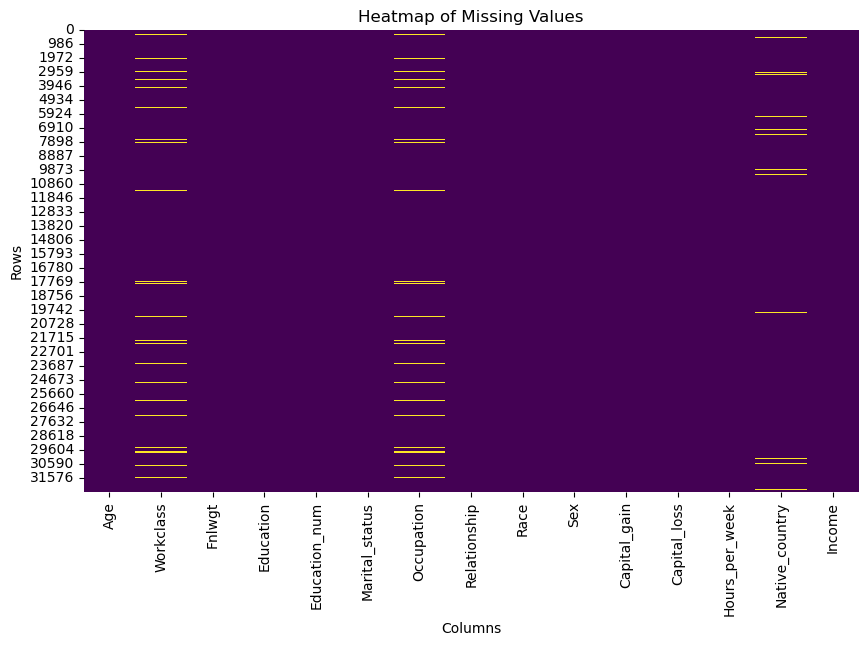

In [12]:
# Create a figure with a specified size
plt.figure(figsize=(10, 6))
# Plot a heatmap to visualize missing values in the DataFrame
sns.heatmap(df.isnull(), cbar=False, cmap='viridis')
# Add title and labels for better understanding
plt.title('Heatmap of Missing Values')
plt.xlabel('Columns')
plt.ylabel('Rows')
plt.show()

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 32536 entries, 0 to 32559
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Age             32536 non-null  int64 
 1   Workclass       30700 non-null  object
 2   Fnlwgt          32536 non-null  int64 
 3   Education       32536 non-null  object
 4   Education_num   32536 non-null  int64 
 5   Marital_status  32536 non-null  object
 6   Occupation      30693 non-null  object
 7   Relationship    32536 non-null  object
 8   Race            32536 non-null  object
 9   Sex             32536 non-null  object
 10  Capital_gain    32536 non-null  int64 
 11  Capital_loss    32536 non-null  int64 
 12  Hours_per_week  32536 non-null  int64 
 13  Native_country  31954 non-null  object
 14  Income          32536 non-null  object
dtypes: int64(6), object(9)
memory usage: 4.0+ MB


In [14]:
# Define lists to separate numerical and categorical variables
numerical_columns = ['Age', 'Fnlwgt', 'Education_num', 'Capital_gain', 'Capital_loss', 'Hours_per_week']
categorical_columns = ['Workclass', 'Education', 'Marital_status', 'Occupation', 'Relationship', 'Race', 'Sex', 'Native_country', 'Income']

In [15]:
# Impute missing values in categorical features with the mode
df['Occupation'].fillna(df['Occupation'].mode()[0], inplace=True)
df['Workclass'].fillna(df['Workclass'].mode()[0], inplace=True)
df['Native_country'].fillna(df['Native_country'].mode()[0], inplace=True)

In [16]:
# Calculate the total number of missing values for each column
missing_values = df.isnull().sum().sort_values(ascending=False)
# Compute the percentage of missing values for each column
percentage_missing_values = (missing_values / len(df)) * 100
# Combine the count and percentage of missing values into a single DataFrame
missing_data_summary = pd.concat([missing_values, percentage_missing_values], axis=1, keys=['Missing Values', '% Missing Data'])
# Display the summary of missing data
print(missing_data_summary)

                Missing Values  % Missing Data
Age                          0             0.0
Workclass                    0             0.0
Fnlwgt                       0             0.0
Education                    0             0.0
Education_num                0             0.0
Marital_status               0             0.0
Occupation                   0             0.0
Relationship                 0             0.0
Race                         0             0.0
Sex                          0             0.0
Capital_gain                 0             0.0
Capital_loss                 0             0.0
Hours_per_week               0             0.0
Native_country               0             0.0
Income                       0             0.0


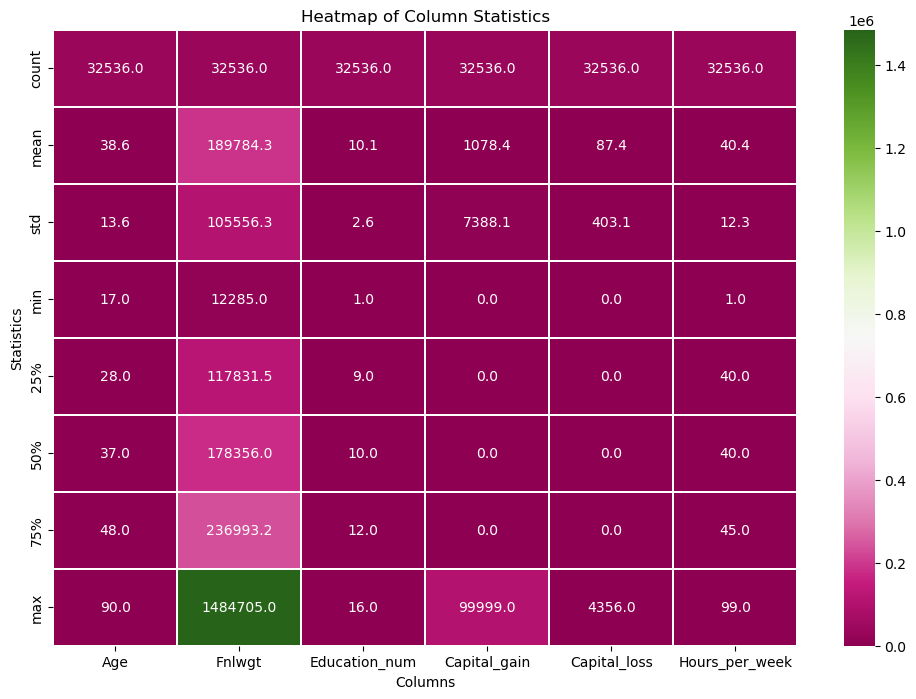

In [17]:
# Create a figure with a specified size
plt.figure(figsize=(12, 8))
# Plot a heatmap to visualize the statistics of the columns
sns.heatmap(df.describe(), 
            annot=True,         
            fmt='0.1f',         
            linewidths=0.1,     
            cmap='PiYG')        

# Add title and labels for better understanding
plt.title('Heatmap of Column Statistics')
plt.xlabel('Columns')
plt.ylabel('Statistics')
plt.show()


In [18]:
df.describe()

,Age,Fnlwgt,Education_num,Capital_gain,Capital_loss,Hours_per_week
count,32536.000000,3.253600e+04,32536.000000,32536.000000,32536.000000,32536.000000
mean,38.585536,1.897843e+05,10.081725,1078.410069,87.370912,40.440343
std,13.638193,1.055563e+05,2.571622,7388.068465,403.107737,12.347079
min,17.000000,1.228500e+04,1.000000,0.000000,0.000000,1.000000
25%,28.000000,1.178315e+05,9.000000,0.000000,0.000000,40.000000
50%,37.000000,1.783560e+05,10.000000,0.000000,0.000000,40.000000
75%,48.000000,2.369932e+05,12.000000,0.000000,0.000000,45.000000
max,90.000000,1.484705e+06,16.000000,99999.000000,4356.000000,99.000000


In [19]:
# Iterate over each categorical column to display value counts
for column in categorical_columns:
    print(f"Column: {column}")
    print(df[column].value_counts())
    print('=' * 100)

Column: Workclass
Workclass
Private             24509
Self-emp-not-inc     2540
Local-gov            2093
State-gov            1297
Self-emp-inc         1116
Federal-gov           960
Without-pay            14
Never-worked            7
Name: count, dtype: int64
Column: Education
Education
HS-grad         10494
Some-college     7282
Bachelors        5352
Masters          1722
Assoc-voc        1382
11th             1175
Assoc-acdm       1067
10th              933
7th-8th           645
Prof-school       576
9th               514
12th              433
Doctorate         413
5th-6th           332
1st-4th           166
Preschool          50
Name: count, dtype: int64
Column: Marital_status
Marital_status
Married-civ-spouse       14970
Never-married            10666
Divorced                  4441
Separated                 1025
Widowed                    993
Married-spouse-absent      418
Married-AF-spouse           23
Name: count, dtype: int64
Column: Occupation
Occupation
Prof-specialty       

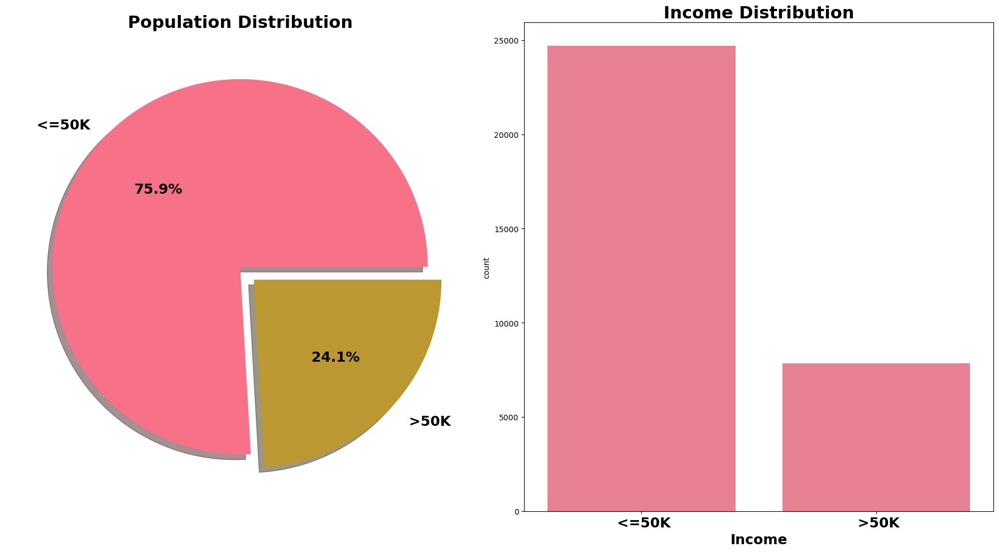

In [20]:
# Set global plot parameters
plt.rcParams["figure.autolayout"] = True
sns.set_palette('husl')
# Create a figure with two subplots
f, ax = plt.subplots(1, 2, figsize=(18, 10))
# Pie chart for income distribution
df['Income'].value_counts().plot.pie(
    explode=[0, 0.1], 
    autopct='%3.1f%%',
    textprops={'fontweight': 'bold', 'fontsize': 18},
    ax=ax[0],
    shadow=True
)
ax[0].set_title('Population Distribution', fontsize=22, fontweight='bold')
ax[0].set_ylabel('')
# Count plot for income distribution
sns.countplot(x='Income', data=df, ax=ax[1])
ax[1].set_title('Income Distribution', fontsize=22, fontweight='bold')
ax[1].set_xlabel("Income", fontsize=18, fontweight='bold')
plt.xticks(fontsize=18, fontweight='bold')
plt.show()


In [21]:
print('Minimum Age:', df['Age'].min(),'years')
print('Maximum Age:', df['Age'].max(),'years')
print('Average Age:', df['Age'].mean(),'years')

Minimum Age: 17 years
Maximum Age: 90 years
Average Age: 38.58553602163757 years


In [22]:
def classify_age_group(age):
    """
    Classify age into predefined age groups.
    
    Parameters:
    age (int or float): The age to classify.
    
    Returns:
    str: The age group corresponding to the input age.
    """
    # Ensure the age is an absolute integer
    age = int(abs(age))
    
    # Classify age into groups
    if 18 < age <= 30:
        return "19-30"
    elif 30 < age <= 40:
        return "31-40"
    elif 40 < age <= 50:
        return "41-50"
    elif 50 < age <= 60:
        return "51-60"
    elif 60 < age <= 70:
        return "61-70"
    else:
        return "Greater Than 70"

In [23]:
# Apply the classify_age_group function to the 'Age' column and create a new 'age_group' column
df['age_group'] = df['Age'].apply(classify_age_group)

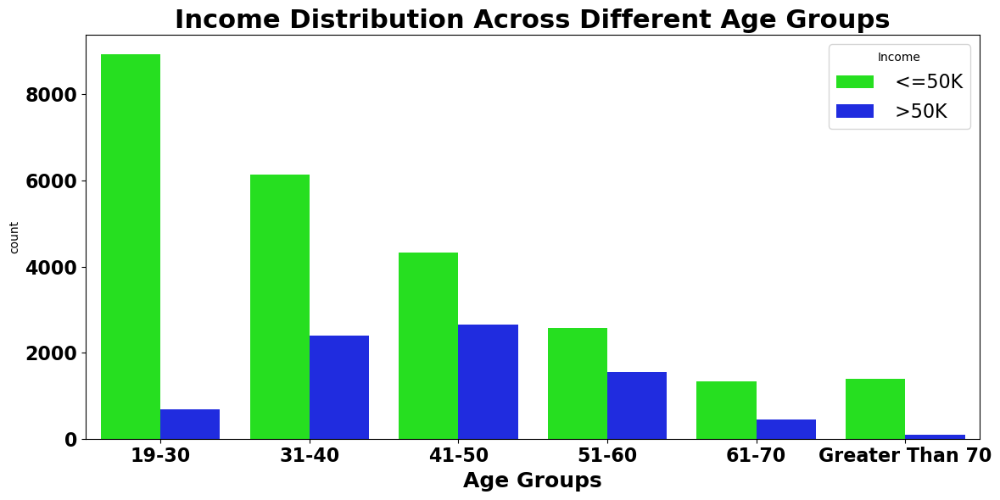

In [24]:
# Create a figure with a specified size
plt.figure(figsize=(12, 6))
# Define the order of age groups for plotting
order_list = ['19-30', '31-40', '41-50', '51-60', '61-70', 'Greater Than 70']
# Create a count plot for age groups with income as hue
p = sns.countplot(
    x='age_group', 
    hue='Income', 
    data=df, 
    palette='hsv', 
    order=order_list
)
# Set the plot title and labels
plt.title('Income Distribution Across Different Age Groups', fontsize=22, fontweight='bold')
p.set_xlabel('Age Groups', fontsize=18, fontweight='bold')
plt.xticks(fontsize=16, fontweight='bold')
plt.yticks(fontsize=16, fontweight='bold')
plt.legend(title='Income', fontsize=16)
plt.show()

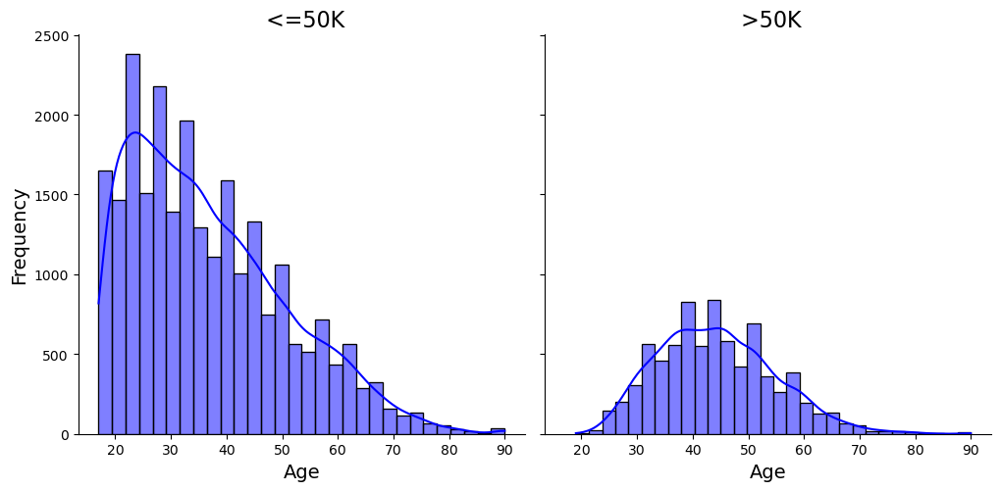

In [25]:
# Create a FacetGrid to plot age distribution for each income category
g = sns.FacetGrid(df, col='Income', col_wrap=3, height=5, sharex=True, sharey=True)
g.map(sns.histplot, 'Age', kde=True, bins=30, color='blue')
# Set titles and labels
g.set_axis_labels('Age', 'Frequency')
g.set_titles(col_template='{col_name}', size=16)
g.set_xlabels(size=14)
g.set_ylabels(size=14)
plt.show()

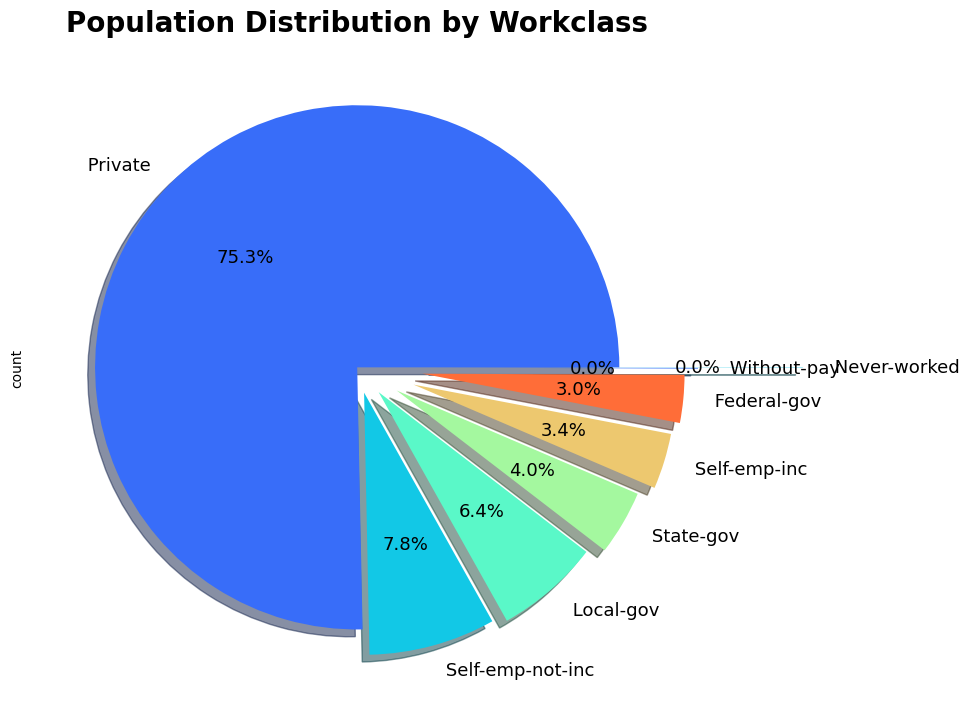

In [26]:
# Set global plot parameters
plt.rcParams["figure.autolayout"] = True
sns.set_palette('rainbow')
# Create a figure with a specified size
plt.figure(figsize=(10, 10))
# Plot a pie chart for workclass distribution
df['Workclass'].value_counts().plot.pie(
    explode=[0, 0.1, 0.125, 0.175, 0.225, 0.25, 0.3, 0.7], 
    autopct='%2.1f%%',
    textprops={'fontsize': 13},
    shadow=True
)
# Set the title of the pie chart
plt.title('Population Distribution by Workclass', fontsize=20, fontweight='bold')
plt.tight_layout()
plt.show()


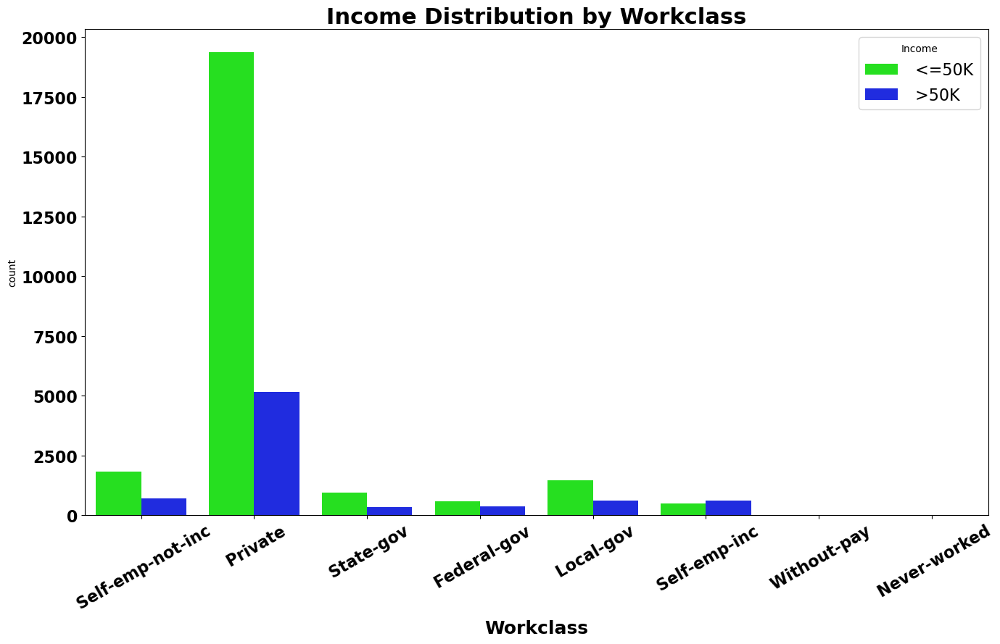

In [27]:
# Create a figure with a specified size
plt.figure(figsize=(14, 9))
# Create a count plot for the 'Workclass' column with income as hue
p = sns.countplot(
    x='Workclass', 
    hue='Income', 
    data=df, 
    palette='hsv'
)
# Set the plot title and labels
plt.title('Income Distribution by Workclass', fontsize=22, fontweight='bold')
p.set_xlabel('Workclass', fontsize=18, fontweight='bold')
plt.xticks(fontsize=16, fontweight='bold', rotation=30)
plt.yticks(fontsize=16, fontweight='bold')
plt.legend(title='Income', fontsize=16)
plt.show()

In [28]:
# Create a cross-tabulation of 'Income' and 'Workclass' with margins (totals)
crosstab = pd.crosstab(df['Income'], df['Workclass'], margins=True)
# Display the cross-tabulation with a background gradient
crosstab.style.background_gradient(cmap='summer_r')

Workclass,Federal-gov,Local-gov,Never-worked,Private,Self-emp-inc,Self-emp-not-inc,State-gov,Without-pay,All
Income,,,,,,,,,
<=50K,589,1476,7,19357,494,1816,944,14,24697
>50K,371,617,0,5152,622,724,353,0,7839
All,960,2093,7,24509,1116,2540,1297,14,32536


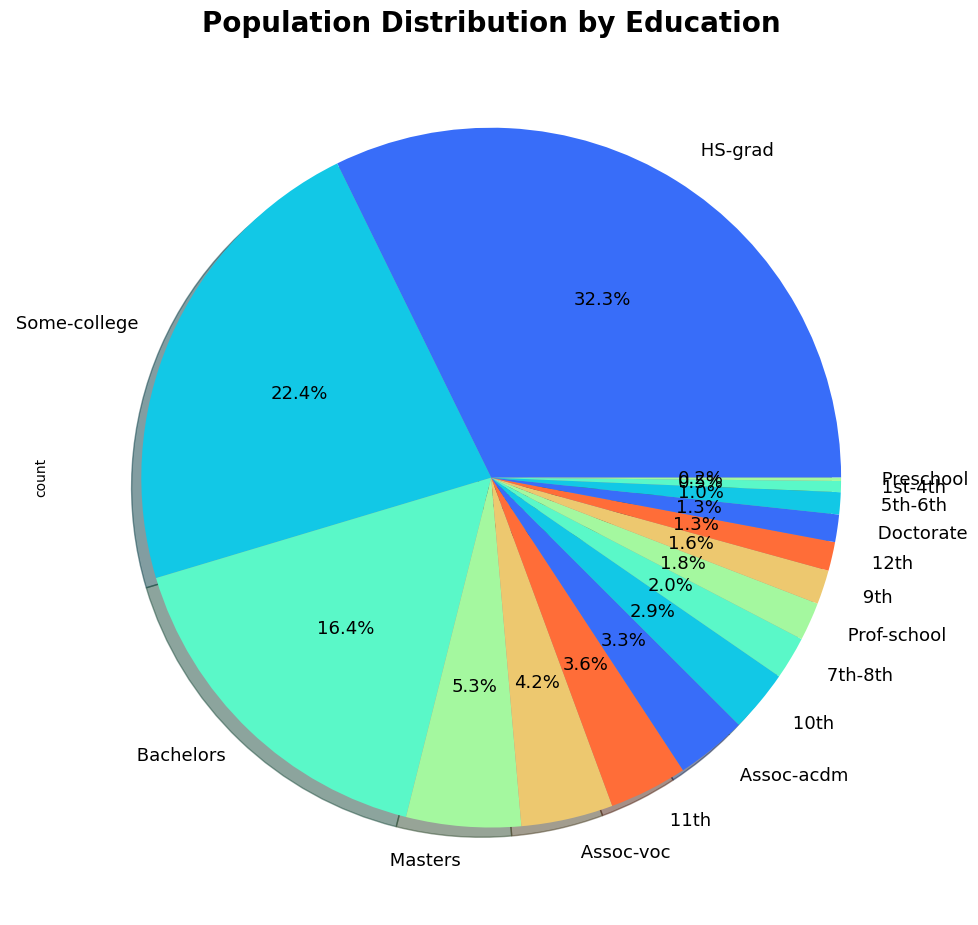

In [29]:
# Set global plot parameters
plt.rcParams["figure.autolayout"] = True
sns.set_palette('rainbow')
# Create a figure with a specified size
plt.figure(figsize=(10, 10))
# Plot a pie chart for education distribution
df['Education'].value_counts().plot.pie(
    autopct='%2.1f%%',
    textprops={'fontsize': 13},
    shadow=True
)
# Set the title of the pie chart
plt.title('Population Distribution by Education', fontsize=20, fontweight='bold')
plt.tight_layout()
plt.show()


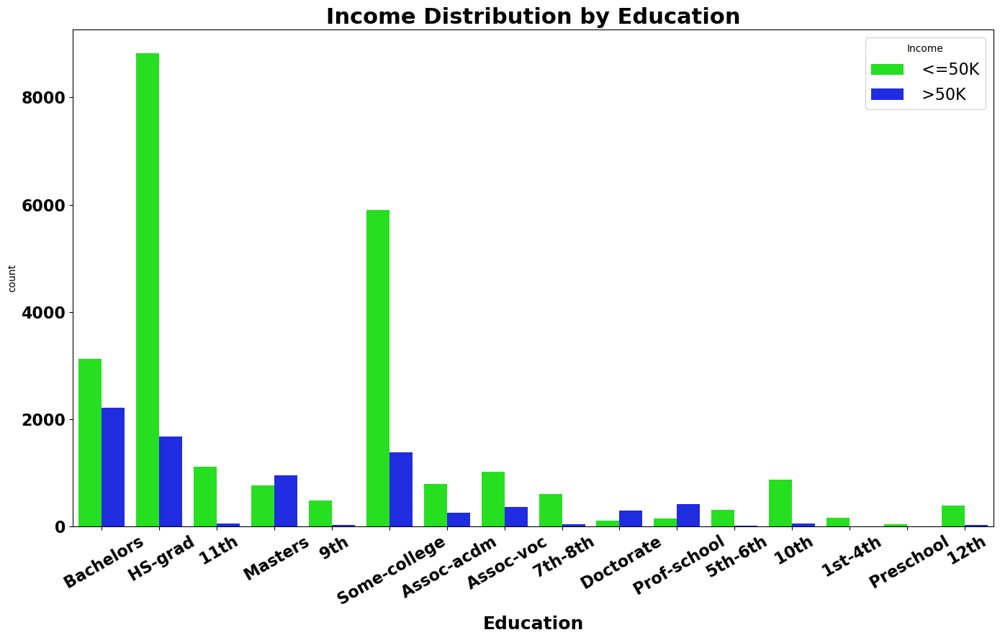

In [30]:
# Create a figure with a specified size
plt.figure(figsize=(14, 9))
# Create a count plot for the 'Education' column with income as hue
p = sns.countplot(
    x='Education', 
    hue='Income', 
    data=df, 
    palette='hsv'
)
# Set the plot title and labels
plt.title('Income Distribution by Education', fontsize=22, fontweight='bold')
p.set_xlabel('Education', fontsize=18, fontweight='bold')
plt.xticks(fontsize=16, fontweight='bold', rotation=30)
plt.yticks(fontsize=16, fontweight='bold')
plt.legend(title='Income', fontsize=16)
plt.show()

In [31]:
# Create a cross-tabulation of 'Education' and 'Workclass' with margins (totals)
crosstab = pd.crosstab(df['Education'], df['Workclass'], margins=True)
# Display the cross-tabulation with a background gradient for better visualization
crosstab.style.background_gradient(cmap='summer_r')

Workclass,Federal-gov,Local-gov,Never-worked,Private,Self-emp-inc,Self-emp-not-inc,State-gov,Without-pay,All
Education,,,,,,,,,
10th,6,31,2,795,19,67,13,0,933
11th,9,36,1,1041,14,60,14,0,1175
12th,5,19,0,373,7,19,10,0,433
1st-4th,0,4,0,146,2,13,1,0,166
5th-6th,1,9,0,295,4,19,4,0,332
7th-8th,2,28,1,495,14,94,10,1,645
9th,3,23,0,438,10,34,6,0,514
Assoc-acdm,55,88,0,776,35,71,41,1,1067
Assoc-voc,38,86,0,1066,38,108,46,0,1382


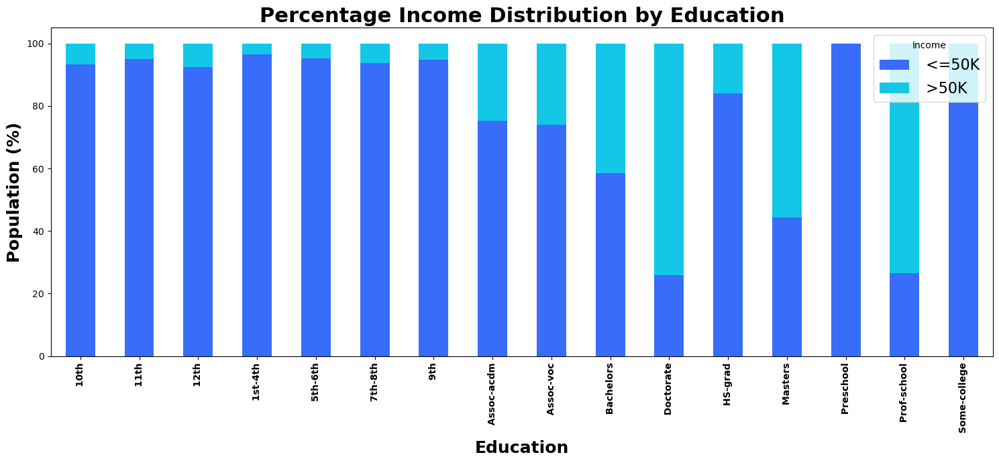

In [32]:
# Set the color palette for the plot
sns.set_palette('rainbow')
# Create a cross-tabulation of 'Education' and 'Income'
table = pd.crosstab(df['Education'], df['Income'])
# Calculate the percentage distribution and plot as a stacked bar chart
(table.div(table.sum(axis=1), axis=0) * 100).plot(
    kind='bar',
    stacked=True,
    figsize=(15, 7)
)
# Set the title and labels for the plot
plt.title('Percentage Income Distribution by Education', fontsize=22, fontweight='bold')
plt.xlabel('Education', fontsize=18, fontweight='bold')
plt.ylabel('Population (%)', fontsize=18, fontweight='bold')
plt.xticks(fontweight='bold')
plt.legend(title='Income', fontsize=16)
plt.show()


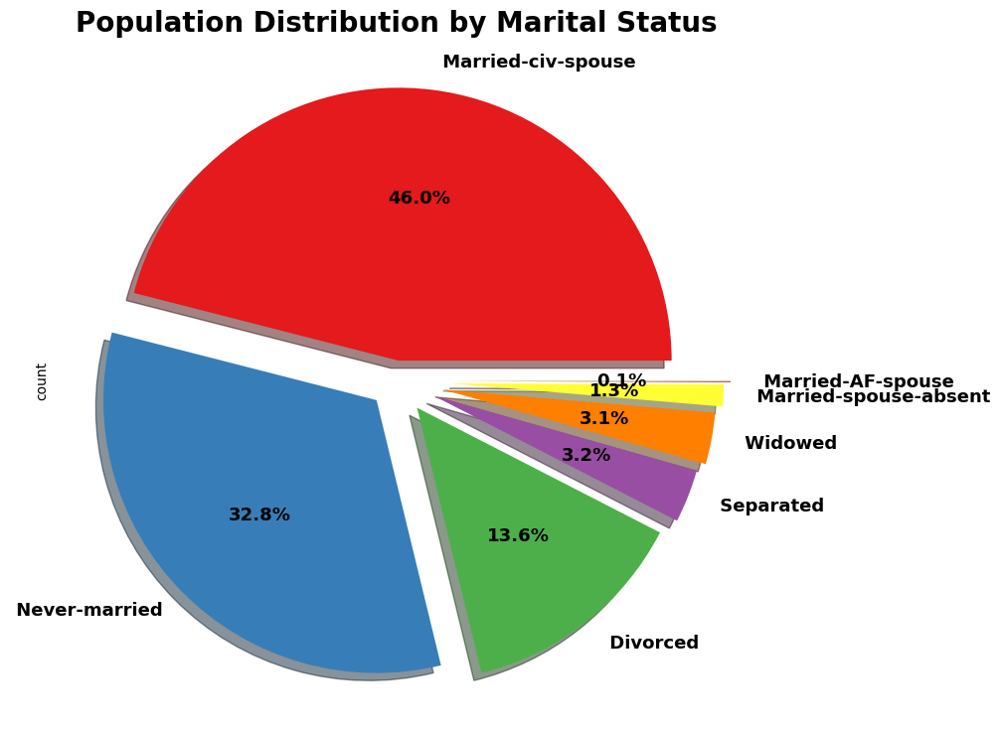

In [33]:
# Set global plot parameters
plt.rcParams["figure.autolayout"] = True
sns.set_palette('Set1')
# Create a figure with a specified size
plt.figure(figsize=(10, 10))
# Plot a pie chart for marital status distribution
df['Marital_status'].value_counts().plot.pie(
    autopct='%2.1f%%',
    explode=[0.075, 0.1, 0.125, 0.15, 0.175, 0.2, 0.225],
    textprops={'fontsize': 13, 'fontweight': 'bold'},
    shadow=True
)
# Set the title of the pie chart
plt.title('Population Distribution by Marital Status', fontsize=20, fontweight='bold')
# Adjust layout to ensure everything fits without overlap
plt.tight_layout()
plt.show()

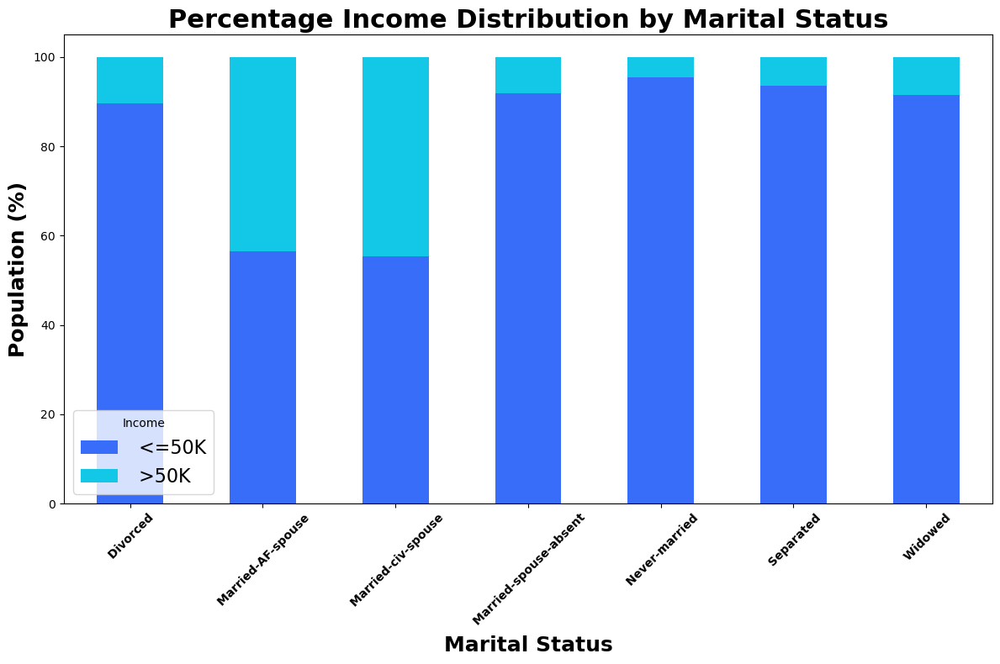

In [34]:
# Set the color palette for the plot
sns.set_palette('rainbow')
# Create a cross-tabulation of 'Marital_status' and 'Income'
table = pd.crosstab(df['Marital_status'], df['Income'])
# Calculate the percentage distribution and plot as a stacked bar chart
(table.div(table.sum(axis=1), axis=0) * 100).plot(
    kind='bar',
    stacked=True,
    figsize=(12, 8)
)
# Set the title and labels for the plot
plt.title('Percentage Income Distribution by Marital Status', fontsize=22, fontweight='bold')
plt.xlabel('Marital Status', fontsize=18, fontweight='bold')
plt.ylabel('Population (%)', fontsize=18, fontweight='bold')
plt.xticks(fontweight='bold', rotation=45)
plt.legend(title='Income', fontsize=16)
plt.show()


In [35]:
# Create a cross-tabulation of 'Marital_status' and 'Income' with margins (totals)
crosstab = pd.crosstab(df['Marital_status'], df['Income'], margins=True)
# Display the cross-tabulation with a background gradient for better visualization
crosstab.style.background_gradient(cmap='summer_r')

Income,<=50K,>50K,All
Marital_status,,,
Divorced,3978,463,4441
Married-AF-spouse,13,10,23
Married-civ-spouse,8280,6690,14970
Married-spouse-absent,384,34,418
Never-married,10175,491,10666
Separated,959,66,1025
Widowed,908,85,993
All,24697,7839,32536


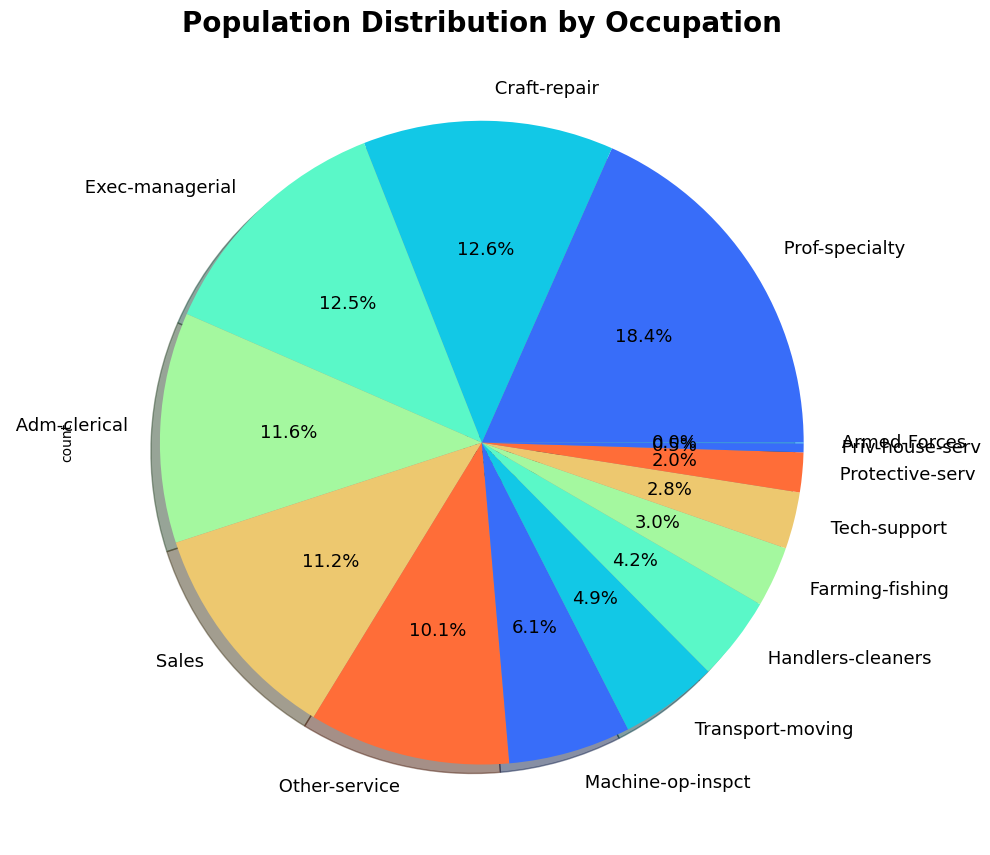

In [36]:
# Set global plot parameters
plt.rcParams["figure.autolayout"] = True
sns.set_palette('rainbow')
# Create a figure with a specified size
plt.figure(figsize=(10, 10))
# Plot a pie chart for occupation distribution
df['Occupation'].value_counts().plot.pie(
    autopct='%2.1f%%',
    textprops={'fontsize': 13},
    shadow=True
)
# Set the title of the pie chart
plt.title('Population Distribution by Occupation', fontsize=20, fontweight='bold')
plt.tight_layout()
plt.show()


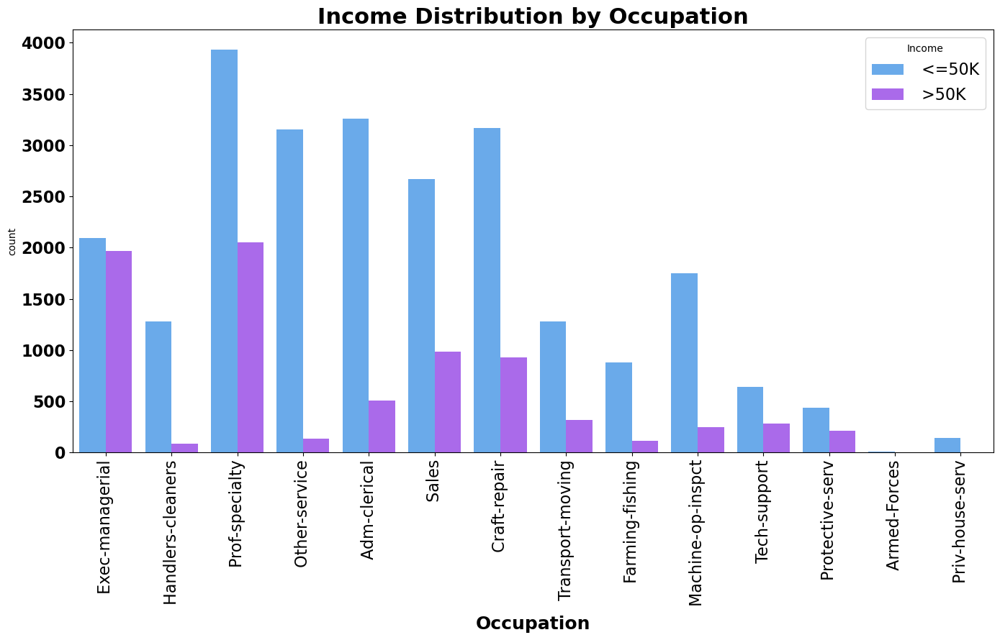

In [37]:
# Create a figure with a specified size
plt.figure(figsize=(14, 9))
# Create a count plot for 'Occupation' with 'Income' as hue
p = sns.countplot(
    x='Occupation',
    hue='Income',
    data=df,
    palette='cool'
)
# Set the title and labels for the plot
plt.title('Income Distribution by Occupation', fontsize=22, fontweight='bold')
p.set_xlabel('Occupation', fontsize=18, fontweight='bold')
plt.xticks(fontsize=16, rotation=90)
plt.yticks(fontsize=16, fontweight='bold')
plt.legend(title='Income', fontsize=16)
plt.show()


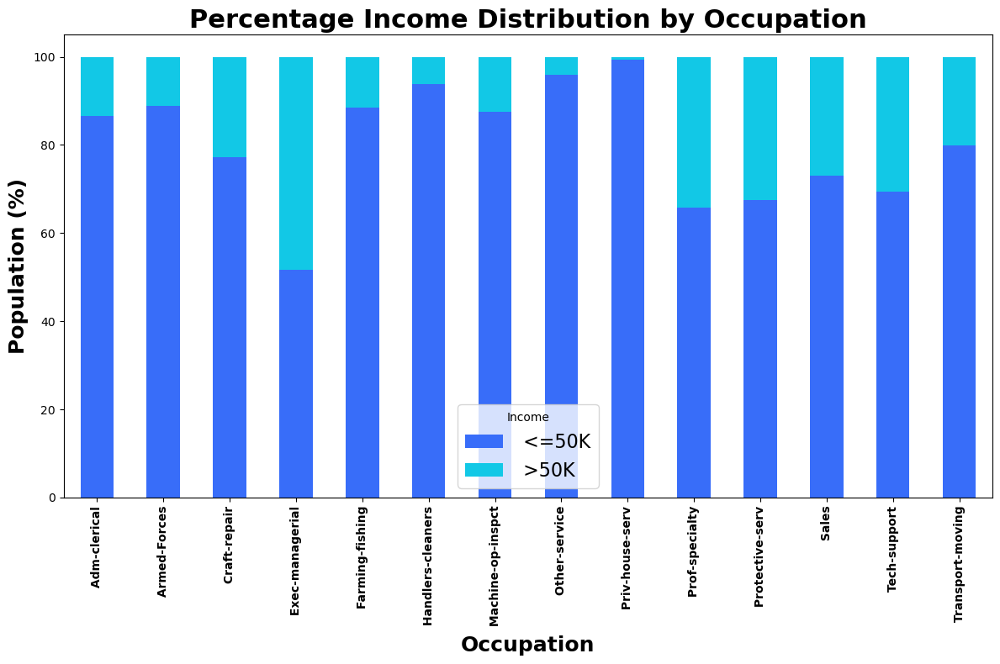

In [38]:
# Set the color palette for the plot
sns.set_palette('rainbow')
# Create a cross-tabulation of 'Occupation' and 'Income'
table = pd.crosstab(df['Occupation'], df['Income'])
# Calculate the percentage distribution and plot as a stacked bar chart
(table.div(table.sum(axis=1), axis=0) * 100).plot(
    kind='bar',
    stacked=True,
    figsize=(12, 8)
)
# Set the title and labels for the plot
plt.title('Percentage Income Distribution by Occupation', fontsize=22, fontweight='bold')
plt.xlabel('Occupation', fontsize=18, fontweight='bold')
plt.ylabel('Population (%)', fontsize=18, fontweight='bold')
plt.xticks(fontweight='bold', rotation=90)
plt.legend(title='Income', fontsize=16)
plt.show()


In [39]:
# Create a cross-tabulation of 'Occupation' and 'Income' with margins (totals)
crosstab = pd.crosstab(df['Occupation'], df['Income'], margins=True)
# Display the cross-tabulation with a background gradient for better visualization
crosstab.style.background_gradient(cmap='winter_r')

Income,<=50K,>50K,All
Occupation,,,
Adm-clerical,3260,507,3767
Armed-Forces,8,1,9
Craft-repair,3165,929,4094
Exec-managerial,2097,1968,4065
Farming-fishing,877,115,992
Handlers-cleaners,1283,86,1369
Machine-op-inspct,1751,249,2000
Other-service,3154,137,3291
Priv-house-serv,146,1,147


In [40]:
# Create a cross-tabulation of 'Occupation' and 'Workclass' with margins (totals)
crosstab = pd.crosstab(df['Occupation'], df['Workclass'], margins=True)
# Display the cross-tabulation with a background gradient for better visualization
crosstab.style.background_gradient(cmap='winter_r')

Workclass,Federal-gov,Local-gov,Never-worked,Private,Self-emp-inc,Self-emp-not-inc,State-gov,Without-pay,All
Occupation,,,,,,,,,
Adm-clerical,317,283,0,2831,31,50,252,3,3767
Armed-Forces,9,0,0,0,0,0,0,0,9
Craft-repair,64,146,0,3191,106,530,56,1,4094
Exec-managerial,180,214,0,2690,400,392,189,0,4065
Farming-fishing,8,29,0,453,51,430,15,6,992
Handlers-cleaners,23,47,0,1272,2,15,9,1,1369
Machine-op-inspct,14,12,0,1911,13,36,13,1,2000
Other-service,35,193,0,2736,27,175,124,1,3291
Priv-house-serv,0,0,0,147,0,0,0,0,147


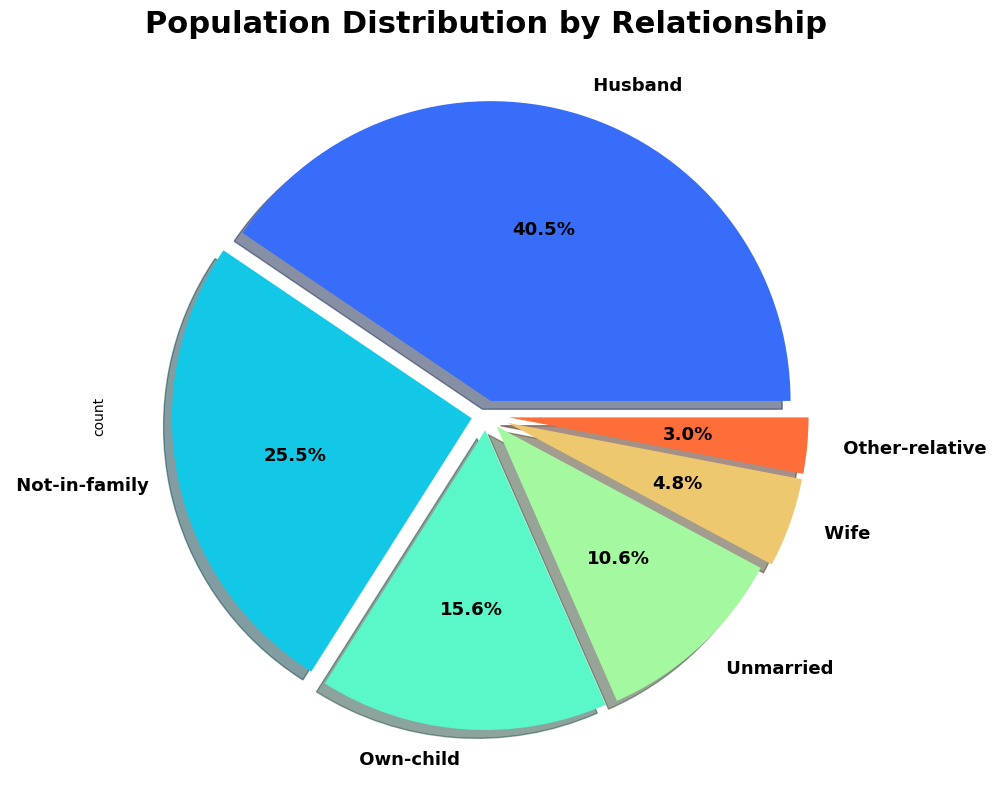

In [41]:
# Set global plot parameters
plt.rcParams["figure.autolayout"] = True
sns.set_palette('rainbow')
# Create a figure with a specified size
plt.figure(figsize=(10, 10))
# Plot a pie chart for relationship distribution
df['Relationship'].value_counts().plot.pie(
    autopct='%2.1f%%',
    explode=[0.05, 0.05, 0.05, 0.05, 0.075, 0.075],  # Adjust explode values for separation
    textprops={'fontweight': 'bold', 'fontsize': 13},  # Set text properties
    shadow=True
)
# Set the title of the pie chart
plt.title('Population Distribution by Relationship', fontsize=22, fontweight='bold')
plt.tight_layout()
plt.show()

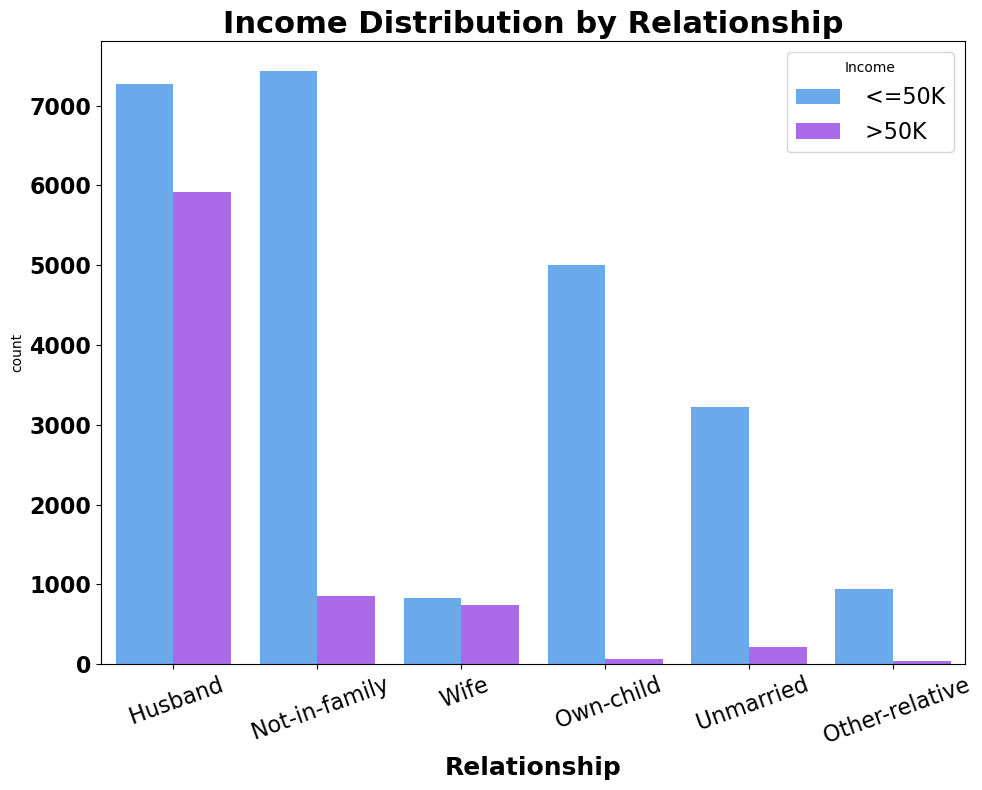

In [42]:
# Create a figure with a specified size
plt.figure(figsize=(10, 8))
# Create a count plot for 'Relationship' with 'Income' as hue
p = sns.countplot(
    x='Relationship',
    hue='Income',
    data=df,
    palette='cool'
)
# Set the title and labels for the plot
plt.title('Income Distribution by Relationship', fontsize=22, fontweight='bold')
p.set_xlabel('Relationship', fontsize=18, fontweight='bold')
plt.xticks(fontsize=16, rotation=20)
plt.yticks(fontsize=16, fontweight='bold')
plt.legend(title='Income', fontsize=16)
plt.show()


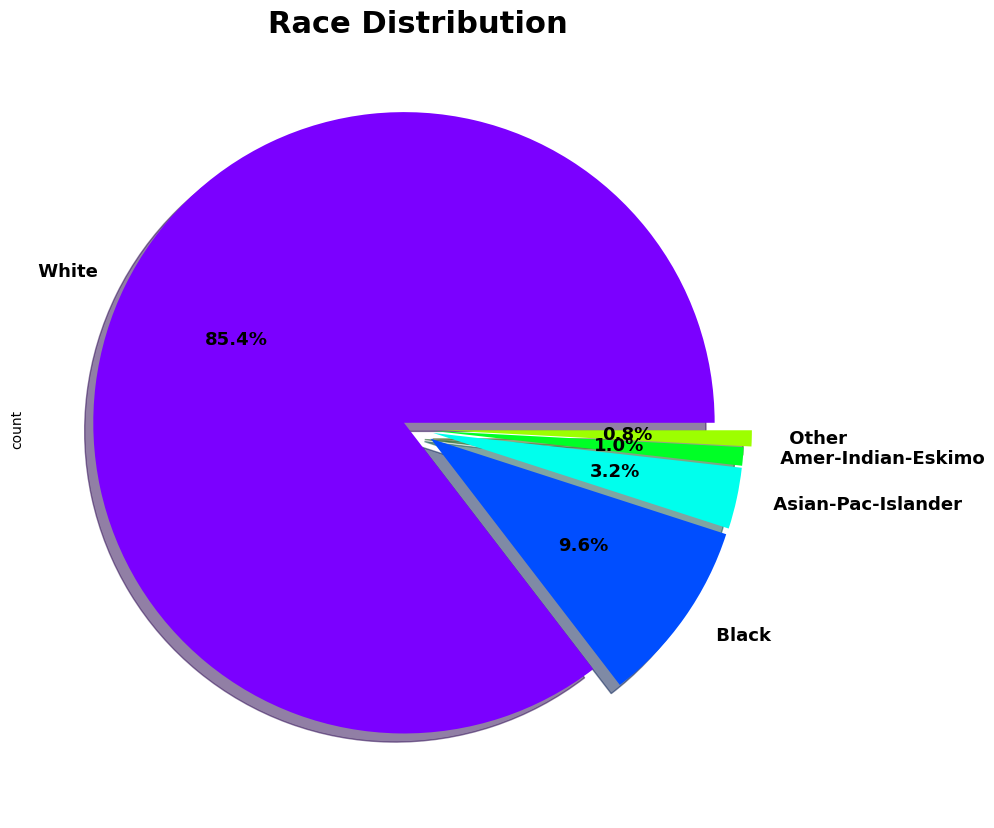

In [43]:
# Set global plot parameters
plt.rcParams["figure.autolayout"] = True
sns.set_palette('gist_rainbow_r')
# Create a figure with a specified size
plt.figure(figsize=(10, 10))
# Plot a pie chart for race distribution
df['Race'].value_counts().plot.pie(
    autopct='%2.1f%%',
    explode=[0.05, 0.05, 0.05, 0.05, 0.075],  # Adjust explode values for separation
    textprops={'fontweight': 'bold', 'fontsize': 13},  # Set text properties
    shadow=True
)
# Set the title of the pie chart
plt.title('Race Distribution', fontsize=22, fontweight='bold')
plt.tight_layout()
plt.show()


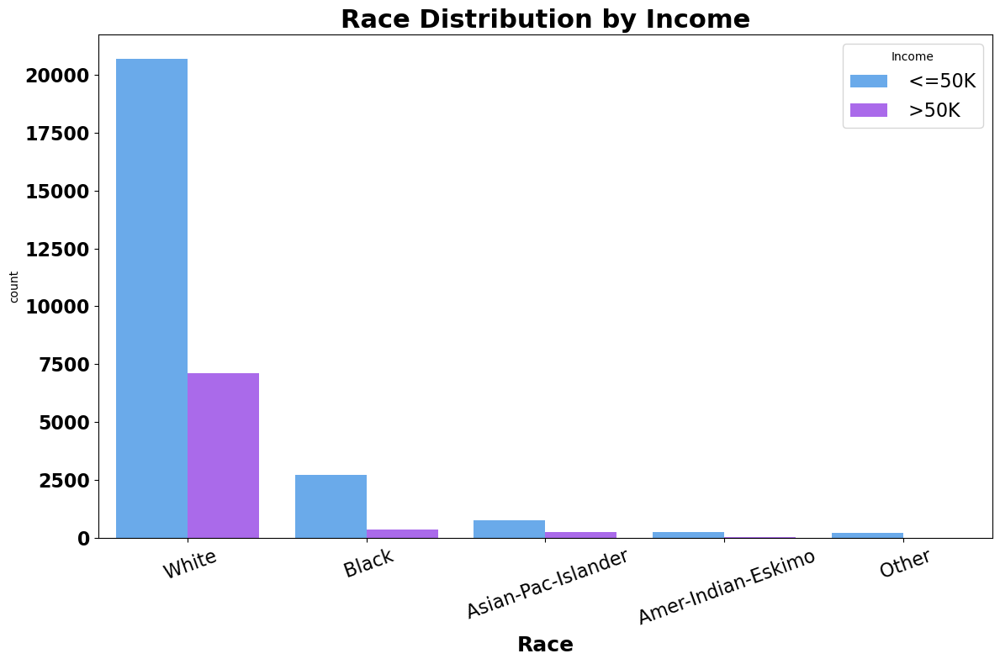

In [44]:
# Create a figure with a specified size
plt.figure(figsize=(12, 8))
# Create a count plot for 'Race' with 'Income' as hue
p = sns.countplot(
    x='Race',
    hue='Income',
    data=df,
    palette='cool'
)
# Set the title and labels for the plot
plt.title('Race Distribution by Income', fontsize=22, fontweight='bold')
p.set_xlabel('Race', fontsize=18, fontweight='bold')
plt.xticks(fontsize=16, rotation=20)
plt.yticks(fontsize=16, fontweight='bold')
plt.legend(title='Income', fontsize=16)
plt.show()


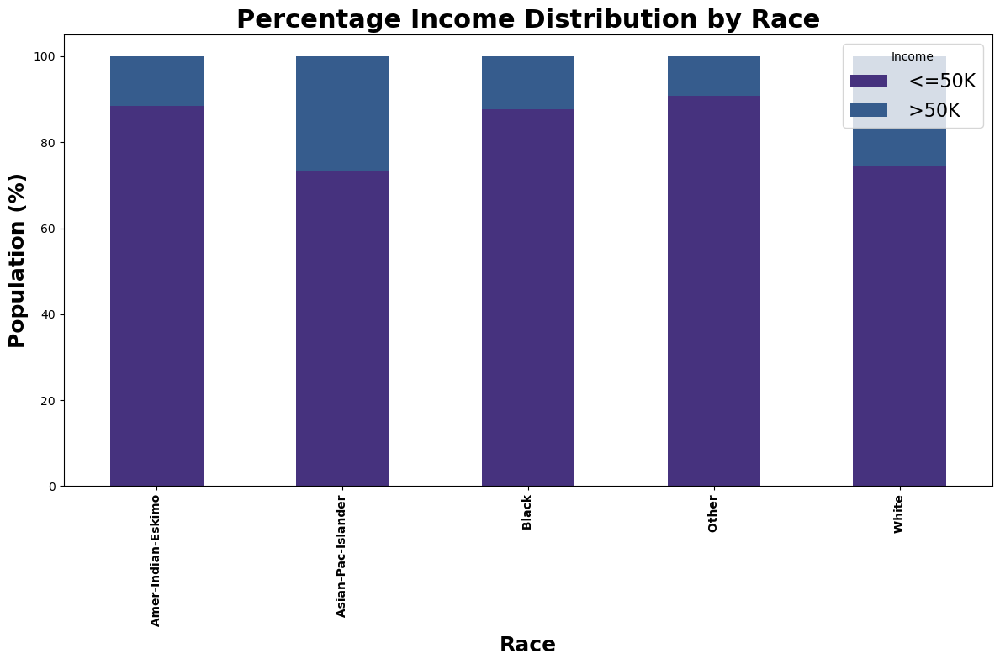

In [45]:
# Set the color palette for the plot
sns.set_palette('viridis')
# Create a cross-tabulation of 'Race' and 'Income'
table = pd.crosstab(df['Race'], df['Income'])
# Calculate the percentage distribution and plot as a stacked bar chart
(table.div(table.sum(axis=1), axis=0) * 100).plot(
    kind='bar',
    stacked=True,
    figsize=(12, 8)
)
# Set the title and labels for the plot
plt.title('Percentage Income Distribution by Race', fontsize=22, fontweight='bold')
plt.xlabel('Race', fontsize=18, fontweight='bold')
plt.ylabel('Population (%)', fontsize=18, fontweight='bold')
plt.xticks(fontweight='bold')
plt.legend(title='Income', fontsize=16)
plt.show()

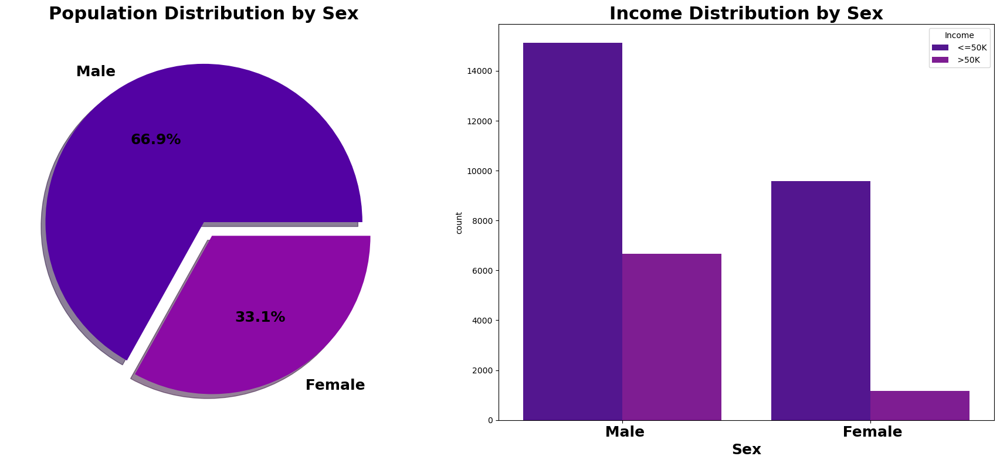

In [46]:
# Set global plot parameters
plt.rcParams["figure.autolayout"] = True
sns.set_palette('plasma')
# Create a figure with two subplots
f, ax = plt.subplots(1, 2, figsize=(18, 8))
# Plot a pie chart for sex distribution
df['Sex'].value_counts().plot.pie(
    explode=[0, 0.1],  # Adjust explode values for separation
    autopct='%3.1f%%',  # Format for percentage labels
    textprops={'fontweight': 'bold', 'fontsize': 18},  # Set text properties
    ax=ax[0],
    shadow=True
)
ax[0].set_title('Population Distribution by Sex', fontsize=22, fontweight='bold')
ax[0].set_ylabel('')
# Plot a count plot for sex distribution with income hue
sns.countplot(
    x='Sex',
    hue='Income',
    data=df,
    ax=ax[1]
)
ax[1].set_title('Income Distribution by Sex', fontsize=22, fontweight='bold')
ax[1].set_xlabel("Sex", fontsize=18, fontweight='bold')
plt.xticks(fontsize=18, fontweight='bold')
plt.show()


In [47]:
# Create a cross-tabulation table of 'Occupation' with 'Sex' and 'Income'
crosstab = pd.crosstab(
    df['Occupation'],
    [df['Sex'], df['Income']],
    margins=True  # Include margins (totals)
)
# Apply a color gradient to the table for better visualization
crosstab.style.background_gradient(cmap='winter_r')


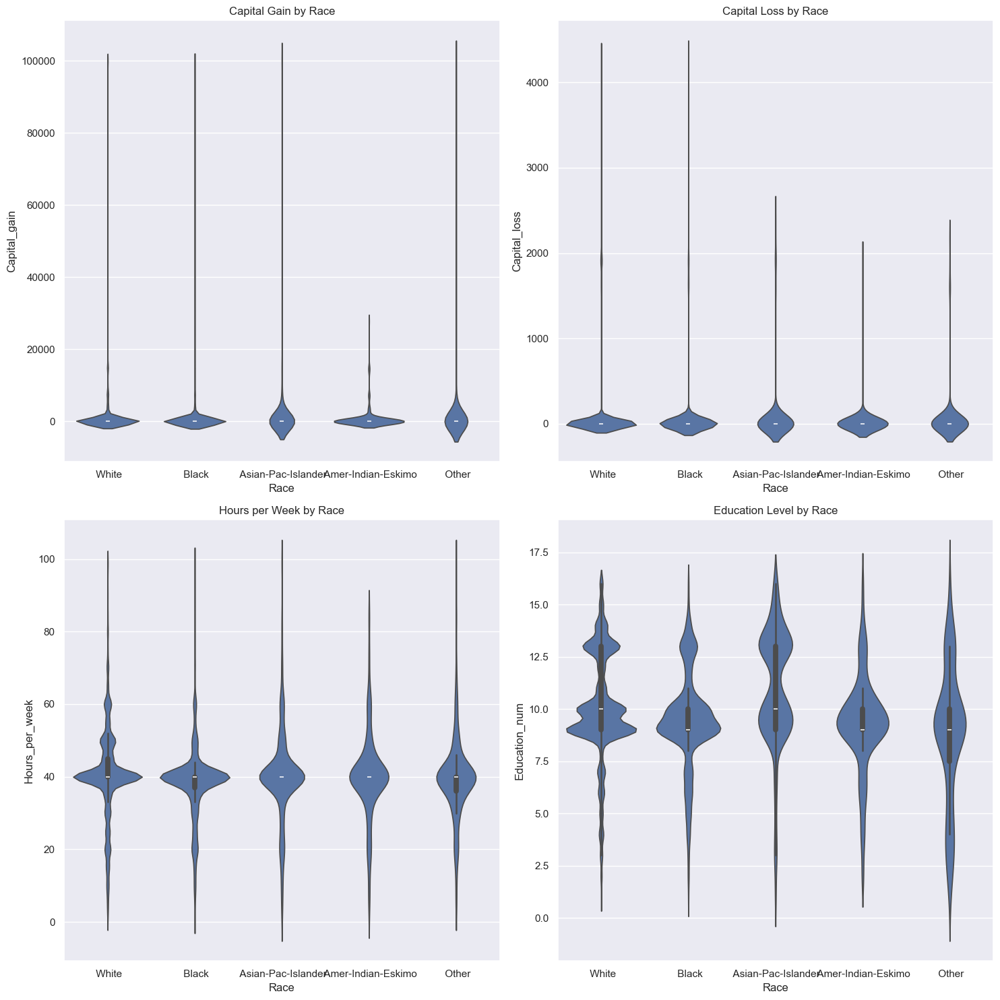

In [48]:
# Setting global parameters
plt.rcParams['figure.figsize'] = [15, 15]
sns.set(style='darkgrid')
# Create a 2x2 grid of violin plots
plt.subplot(2, 2, 1)
sns.violinplot(x='Race', y='Capital_gain', data=df)
plt.title('Capital Gain by Race')
plt.subplot(2, 2, 2)
sns.violinplot(x='Race', y='Capital_loss', data=df)
plt.title('Capital Loss by Race')
plt.subplot(2, 2, 3)
sns.violinplot(x='Race', y='Hours_per_week', data=df)
plt.title('Hours per Week by Race')
plt.subplot(2, 2, 4)
sns.violinplot(x='Race', y='Education_num', data=df)
plt.title('Education Level by Race')
plt.tight_layout()
plt.show()

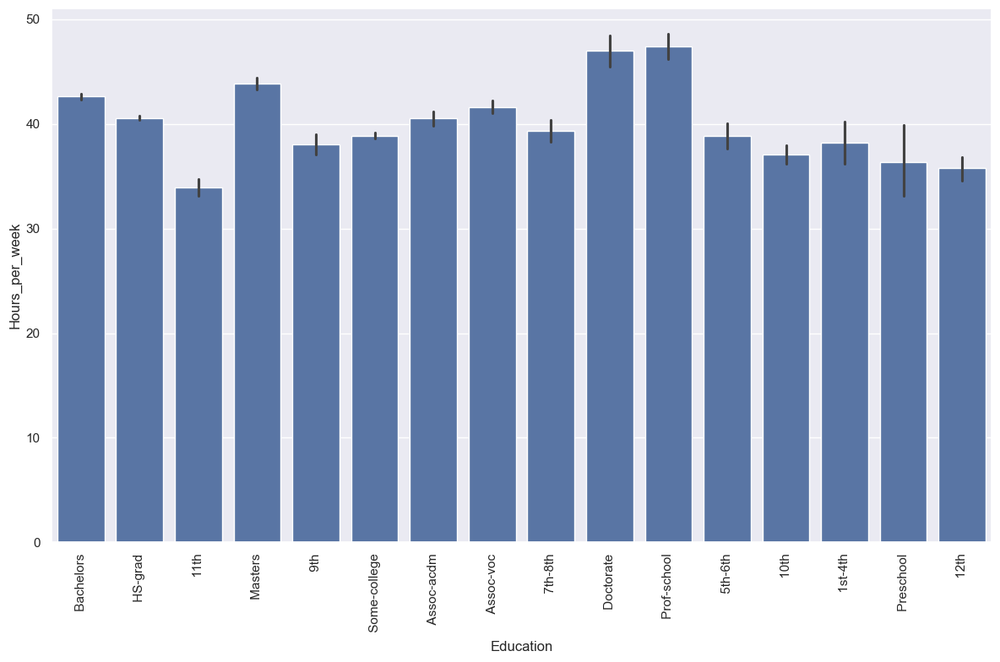

In [49]:
# Set the figure size for the plot
sns.set(rc={'figure.figsize': (12, 8)})
# Create a bar plot for hours per week by education level
sns_grad = sns.barplot(x='Education', y='Hours_per_week', data=df)
# Rotate x-axis labels for better readability
plt.setp(sns_grad.get_xticklabels(), rotation=90)
plt.show()

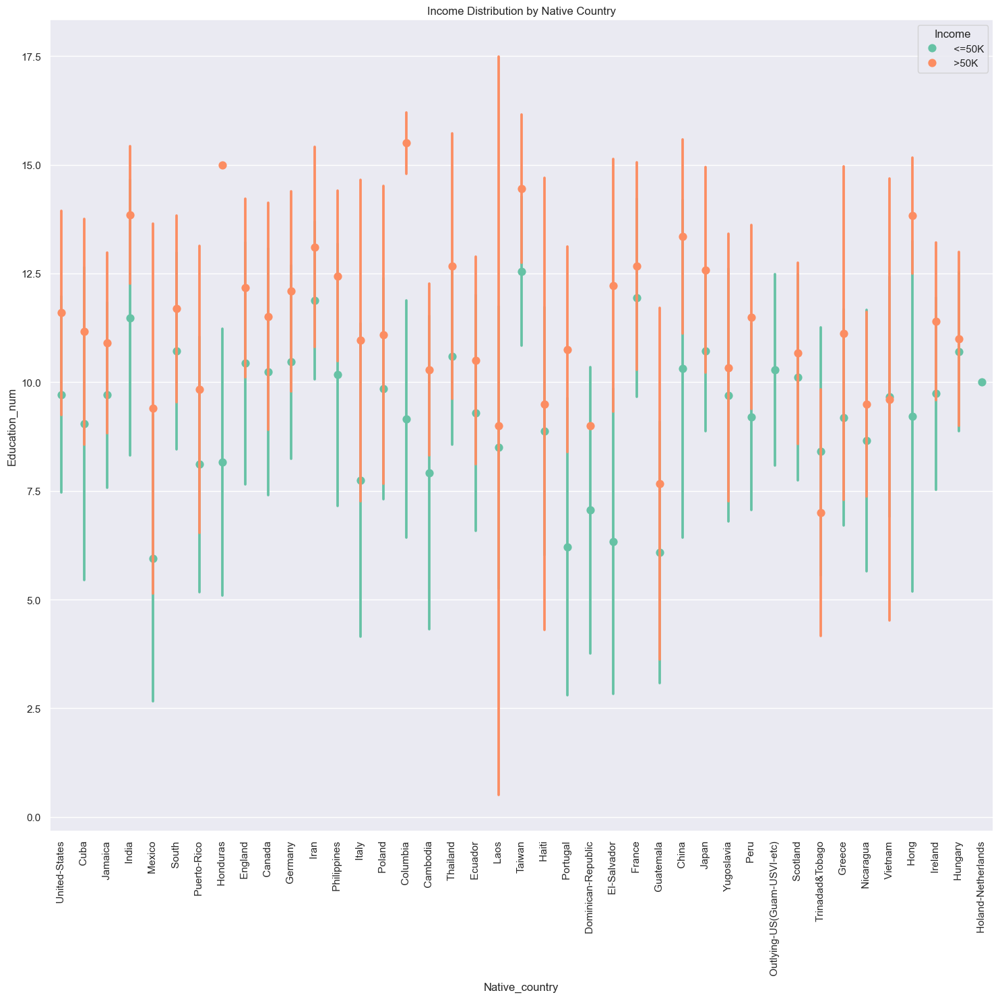

In [50]:
# Set the figure size for the plot
plt.figure(figsize=(15, 15))
# Set the title of the plot
plt.title("Income Distribution by Native Country")
# Create a point plot to show the distribution of Education_num by Native_country, colored by Income
sns.pointplot(
    x='Native_country',
    y='Education_num',
    data=df,
    hue='Income',
    join=False,  # Don't connect the points with lines
    palette="Set2",  # Color palette for the hues
    ci="sd"  # Show standard deviation
)
# Rotate x-axis labels for better readability
plt.xticks(rotation=90)
plt.show()


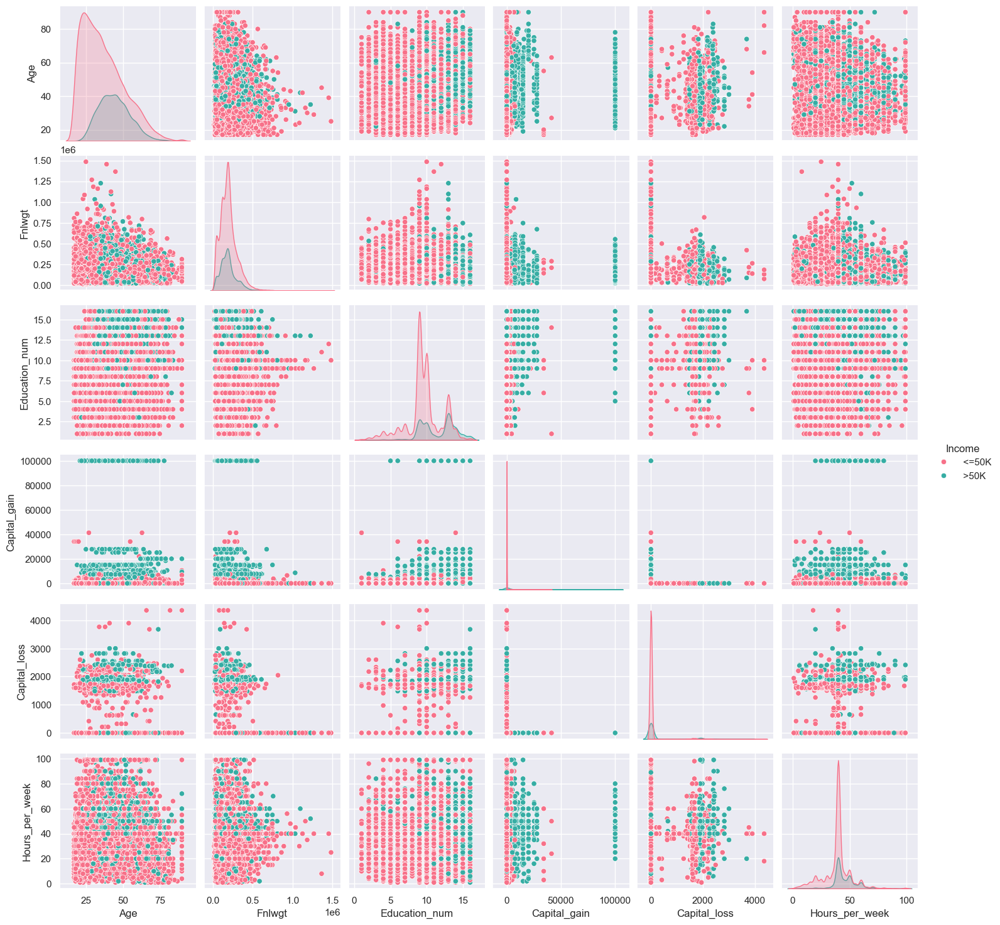

In [51]:
# Create a pairplot to visualize pairwise relationships in the dataset
sns.pairplot(df, hue="Income", palette="husl")
# Show the plot
plt.show()

In [52]:
df.head()

,Age,Workclass,Fnlwgt,Education,Education_num,Marital_status,Occupation,Relationship,Race,Sex,Capital_gain,Capital_loss,Hours_per_week,Native_country,Income,age_group
0,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K,41-50
1,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K,31-40
2,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K,51-60
3,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K,19-30
4,37,Private,284582,Masters,14,Married-civ-spouse,Exec-managerial,Wife,White,Female,0,0,40,United-States,<=50K,31-40


In [53]:
# Initialize LabelEncoder
le = LabelEncoder()
# List of categorical columns
Category = ['Workclass', 'Education', 'Marital_status', 'Occupation', 'Relationship', 'Race', 'Sex', 'Native_country', 'Income']
# Apply LabelEncoder to each categorical column
for column in Category:
    df[column] = le.fit_transform(df[column])
df.head()


,Age,Workclass,Fnlwgt,Education,Education_num,Marital_status,Occupation,Relationship,Race,Sex,Capital_gain,Capital_loss,Hours_per_week,Native_country,Income,age_group
0,50,5,83311,9,13,2,3,0,4,1,0,0,13,38,0,41-50
1,38,3,215646,11,9,0,5,1,4,1,0,0,40,38,0,31-40
2,53,3,234721,1,7,2,5,0,2,1,0,0,40,38,0,51-60
3,28,3,338409,9,13,2,9,5,2,0,0,0,40,4,0,19-30
4,37,3,284582,12,14,2,3,5,4,0,0,0,40,38,0,31-40


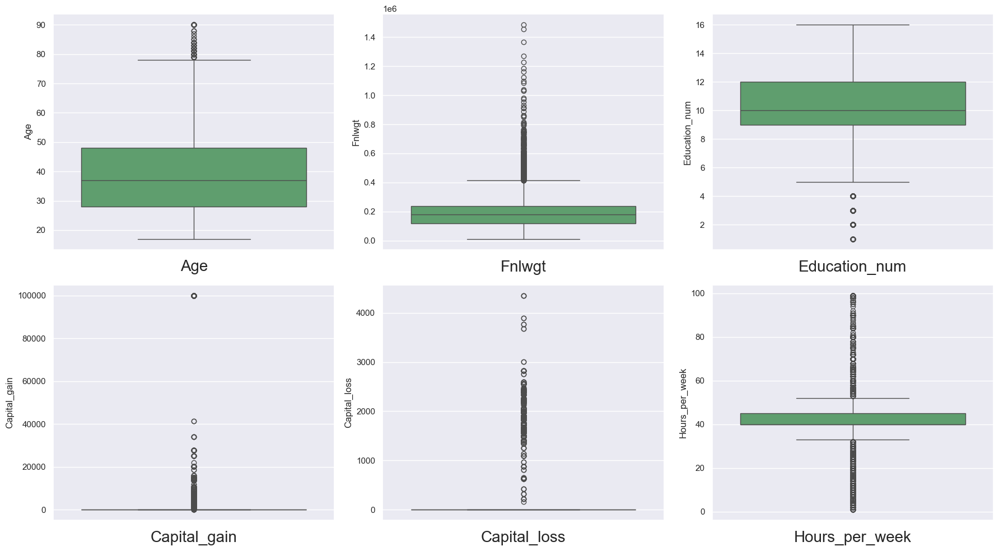

In [54]:
# List of numerical columns
Numerical = ['Age', 'Fnlwgt', 'Education_num', 'Capital_gain', 'Capital_loss', 'Hours_per_week']
# Set the figure size and background color
plt.figure(figsize=(18, 10), facecolor='white')
# Initialize the plot number
plotnumber = 1
# Loop through each numerical column to create individual boxplots
for column in Numerical:
    if plotnumber <= 6:  
        ax = plt.subplot(2, 3, plotnumber)  
        sns.boxplot(df[column], color='g')  
        plt.xlabel(column, fontsize=20)  
    plotnumber += 1  
plt.show()


In [55]:
# Drop the 'Fnlwgt' and 'Education' columns
df.drop(["Fnlwgt", "Education"], axis=1, inplace=True)
df.head()

,Age,Workclass,Education_num,Marital_status,Occupation,Relationship,Race,Sex,Capital_gain,Capital_loss,Hours_per_week,Native_country,Income,age_group
0,50,5,13,2,3,0,4,1,0,0,13,38,0,41-50
1,38,3,9,0,5,1,4,1,0,0,40,38,0,31-40
2,53,3,7,2,5,0,2,1,0,0,40,38,0,51-60
3,28,3,13,2,9,5,2,0,0,0,40,4,0,19-30
4,37,3,14,2,3,5,4,0,0,0,40,38,0,31-40


In [56]:
# Select only the numeric columns
numeric_df = df.select_dtypes(include=[np.number])
# Calculate the z-scores of the numeric columns
z = np.abs(zscore(numeric_df))
# Set the threshold for identifying outliers
threshold = 3
# Filter the DataFrame to remove outliers
df1 = df[(z < threshold).all(axis=1)]
# Print the shapes of the DataFrame before and after removing outliers
print("Shape of the DataFrame before removing outliers: ", df.shape)
print("Shape of the DataFrame after removing outliers: ", df1.shape)
print("Percentage of data loss post outlier removal: ", (df.shape[0] - df1.shape[0]) / df.shape[0] * 100)
df = df1.copy()


Shape of the DataFrame before removing outliers:  (32536, 14)
Shape of the DataFrame after removing outliers:  (28061, 14)
Percentage of data loss post outlier removal:  13.753995574133269


In [57]:
print("\033[1m" + 'Percentage Data Loss :' + "\033[0m", ((32536 - 28061) / 32536) * 100, '%')

Percentage Data Loss : 13.753995574133269 %


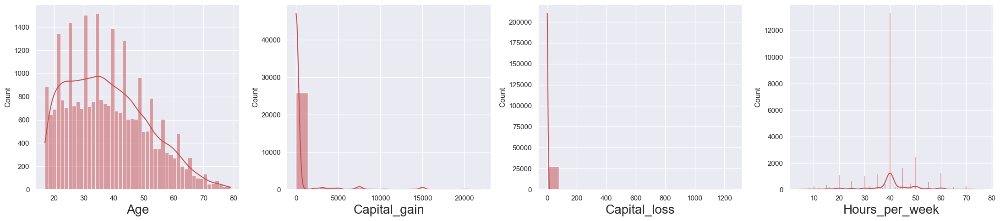

In [58]:
plt.figure(figsize=(22,5), facecolor='white')
plotnum = 1
# Loop through each specified column to create individual distribution plots
for col in ['Age', 'Capital_gain', 'Capital_loss', 'Hours_per_week']:
    if plotnum <= 4:
        plt.subplot(1, 4, plotnum)
        sns.histplot(df[col], kde=True, color='r')  
        plt.xlabel(col, fontsize=20)
    plotnum += 1

plt.tight_layout()  
plt.show()


In [59]:
# Ensure all columns are numeric
df = df.apply(pd.to_numeric, errors='coerce')
# Drop columns that are still not numeric
df = df.select_dtypes(include=[np.number])
df.skew()

Age                0.487918
Workclass          0.080746
Education_num     -0.147601
Marital_status    -0.046623
Occupation         0.015247
Relationship       0.752334
Race              -2.549199
Sex               -0.689977
Capital_gain       4.924729
Capital_loss      29.669292
Hours_per_week    -0.359365
Native_country    -5.348195
Income             1.322011
age_group               NaN
dtype: float64

In [60]:
df.corr()

,Age,Workclass,Education_num,Marital_status,Occupation,Relationship,Race,Sex,Capital_gain,Capital_loss,Hours_per_week,Native_country,Income,age_group
Age,1.000000,0.029674,0.045622,-0.286328,-0.001610,-0.270591,0.021292,0.089469,0.131998,0.023459,0.090783,0.037494,0.241844,NaN
Workclass,0.029674,1.000000,-0.002200,-0.015623,0.008779,-0.057823,0.067532,0.069617,0.011083,-0.010613,0.028104,0.001938,-0.007699,NaN
Education_num,0.045622,-0.002200,1.000000,-0.058587,0.073142,-0.092447,0.080766,0.003688,0.157858,0.007348,0.156303,0.149688,0.320271,NaN
Marital_status,-0.286328,-0.015623,-0.058587,1.000000,0.036477,0.183248,-0.084558,-0.125361,-0.069601,-0.016396,-0.196053,-0.032575,-0.194146,NaN
Occupation,-0.001610,0.008779,0.073142,0.036477,1.000000,-0.038735,0.000613,0.051055,0.009446,-0.004779,-0.022194,0.018069,0.030664,NaN
Relationship,-0.270591,-0.057823,-0.092447,0.183248,-0.038735,1.000000,-0.146432,-0.577195,-0.089095,0.030105,-0.261919,-0.011274,-0.248263,NaN
Race,0.021292,0.067532,0.080766,-0.084558,0.000613,-0.146432,1.000000,0.122731,0.031333,0.000186,0.055486,0.018660,0.094756,NaN
Sex,0.089469,0.069617,0.003688,-0.125361,0.051055,-0.577195,0.122731,1.000000,0.069539,-0.027323,0.236168,-0.011189,0.211792,NaN
Capital_gain,0.131998,0.011083,0.157858,-0.069601,0.009446,-0.089095,0.031333,0.069539,1.000000,-0.009077,0.098705,0.019185,0.343487,NaN
Capital_loss,0.023459,-0.010613,0.007348,-0.016396,-0.004779,0.030105,0.000186,-0.027323,-0.009077,1.000000,-0.003440,0.002925,-0.016465,NaN


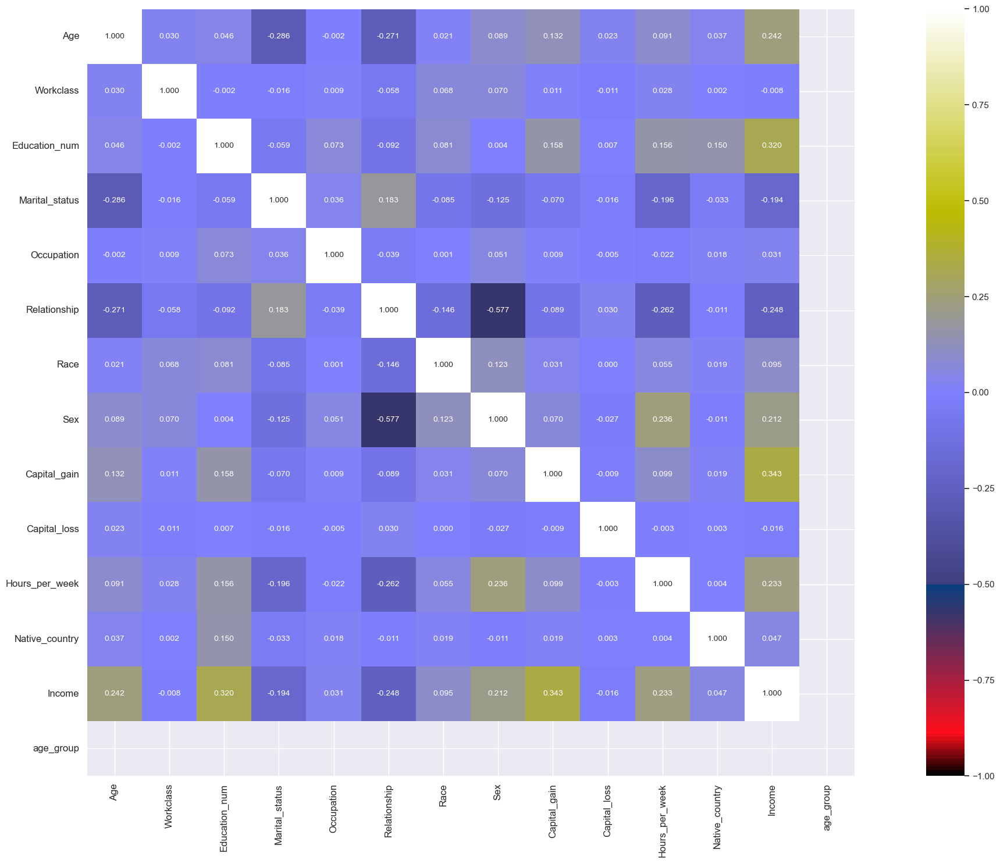

In [61]:
# Set up the figure size
plt.figure(figsize=(25,15))
# Create the heatmap
sns.heatmap(df.corr(), 
            vmin=-1, vmax=1, 
            annot=True, square=True, 
            fmt='0.3f', annot_kws={'size':10}, 
            cmap="gist_stern")
# Customize the tick labels
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.show()

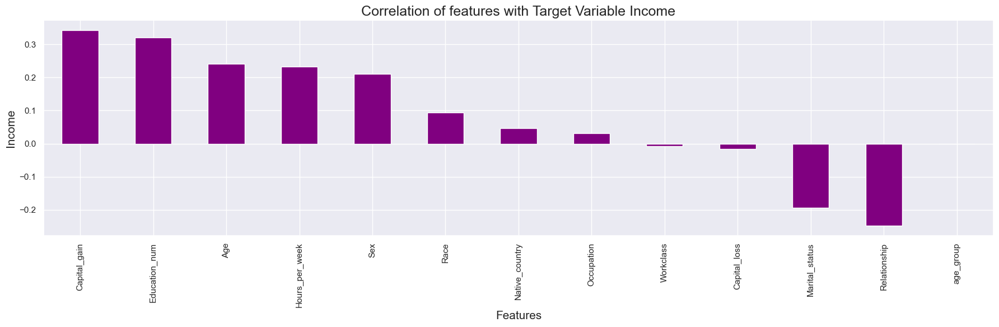

In [62]:
# Set up the figure size
plt.figure(figsize = (18,6))
# Compute the correlation matrix and extract the correlation with 'Income'
correlation_with_income = df.corr()['Income'].drop(['Income']).sort_values(ascending=False)
# Create the bar plot
correlation_with_income.plot(kind='bar', color='purple')
# Set labels and title
plt.xlabel('Features', fontsize=15)
plt.ylabel('Income', fontsize=15)
plt.title('Correlation of features with Target Variable Income', fontsize=18)
plt.show()


In [63]:
# Identify numeric columns before any operation
numeric_cols = df.select_dtypes(include=[np.number]).columns
print(f"Numeric columns before cleaning: {numeric_cols}")

# Check if numeric_cols is empty
if numeric_cols.empty:
    raise ValueError("No numeric columns identified in the DataFrame")

# Replace infinite values with NaN in numeric columns
df[numeric_cols] = df[numeric_cols].replace([np.inf, -np.inf], np.nan)
print(f"Shape after replacing infinities: {df.shape}")
print(f"Columns after replacing infinities: {df.columns}")

# Drop rows with NaNs in numeric columns
df_clean = df.dropna(subset=numeric_cols, how='all')
print(f"Shape after dropping NaNs: {df_clean.shape}")

# Ensure there are no empty columns after cleaning
df_clean = df_clean.dropna(axis=1, how='all')
print(f"Shape after dropping empty columns: {df_clean.shape}")
print(f"Columns after dropping empty columns: {df_clean.columns}")

# Identify numeric columns again in the cleaned dataframe
clean_numeric_cols = df_clean.select_dtypes(include=[np.number]).columns
print(f"Numeric columns after cleaning: {clean_numeric_cols}")

# Check if clean_numeric_cols is empty
if clean_numeric_cols.empty:
    raise ValueError("No numeric columns left after cleaning")

# Add constant term for VIF calculation
df_with_const = sm.add_constant(df_clean[clean_numeric_cols])
print(f"Shape after adding constant: {df_with_const.shape}")

# Ensure there are no zero-size arrays
if df_with_const.shape[0] == 0 or df_with_const.shape[1] == 0:
    raise ValueError("Dataframe contains zero-size arrays after cleaning, cannot compute VIF")

vif = pd.DataFrame()
vif['VIF'] = [variance_inflation_factor(df_with_const.values, i) for i in range(df_with_const.shape[1])]
vif['Features'] = df_with_const.columns
print(vif)

Numeric columns before cleaning: Index(['Age', 'Workclass', 'Education_num', 'Marital_status', 'Occupation',
       'Relationship', 'Race', 'Sex', 'Capital_gain', 'Capital_loss',
       'Hours_per_week', 'Native_country', 'Income', 'age_group'],
      dtype='object')
Shape after replacing infinities: (28061, 14)
Columns after replacing infinities: Index(['Age', 'Workclass', 'Education_num', 'Marital_status', 'Occupation',
       'Relationship', 'Race', 'Sex', 'Capital_gain', 'Capital_loss',
       'Hours_per_week', 'Native_country', 'Income', 'age_group'],
      dtype='object')
Shape after dropping NaNs: (28061, 14)
Shape after dropping empty columns: (28061, 13)
Columns after dropping empty columns: Index(['Age', 'Workclass', 'Education_num', 'Marital_status', 'Occupation',
       'Relationship', 'Race', 'Sex', 'Capital_gain', 'Capital_loss',
       'Hours_per_week', 'Native_country', 'Income'],
      dtype='object')
Numeric columns after cleaning: Index(['Age', 'Workclass', 'Educatio

In [64]:
df.Income.value_counts()

Income
0    21767
1     6294
Name: count, dtype: int64

In [65]:
# Check the number of NaNs in each numeric column
print(df[numeric_cols].isnull().sum())

Age                   0
Workclass             0
Education_num         0
Marital_status        0
Occupation            0
Relationship          0
Race                  0
Sex                   0
Capital_gain          0
Capital_loss          0
Hours_per_week        0
Native_country        0
Income                0
age_group         28061
dtype: int64


In [66]:
df.shape

(28061, 14)

In [67]:
cols_with_all_nans = [col for col in numeric_cols if df[col].isna().all()]
print("Columns with all NaNs:", cols_with_all_nans)

# Remove columns with all NaNs from numeric_cols
numeric_cols = [col for col in numeric_cols if col not in cols_with_all_nans]

# Check the number of NaNs in each numeric column
print("NaNs in each numeric column before imputation:")
print(df[numeric_cols].isnull().sum())

# Impute missing values
imputer = SimpleImputer(strategy='mean')  # Use 'median' or other strategies if needed
X_imputed = imputer.fit_transform(df[numeric_cols])

# Verify shapes and column names
print("Shape of X_imputed:", X_imputed.shape)
print("Number of columns in numeric_cols:", len(numeric_cols))

Columns with all NaNs: ['age_group']
NaNs in each numeric column before imputation:
Age               0
Workclass         0
Education_num     0
Marital_status    0
Occupation        0
Relationship      0
Race              0
Sex               0
Capital_gain      0
Capital_loss      0
Hours_per_week    0
Native_country    0
Income            0
dtype: int64
Shape of X_imputed: (28061, 13)
Number of columns in numeric_cols: 13


In [68]:
# Extract features (X) and target (Y)
X = df_clean[numeric_cols]
Y = df_clean['Income']

In [69]:
# Check for any remaining NaNs
print("Checking for missing values in X:")
print(X.isnull().sum())

Checking for missing values in X:
Age               0
Workclass         0
Education_num     0
Marital_status    0
Occupation        0
Relationship      0
Race              0
Sex               0
Capital_gain      0
Capital_loss      0
Hours_per_week    0
Native_country    0
Income            0
dtype: int64


In [70]:
# Impute missing values using SimpleImputer
imputer = SimpleImputer(strategy='mean') 
X_imputed = imputer.fit_transform(X)
print("Missing values after imputation:")
print(pd.DataFrame(X_imputed, columns=numeric_cols).isnull().sum())

# Apply SMOTE to balance the dataset
oversample = SMOTE()
X_resampled, Y_resampled = oversample.fit_resample(X_imputed, Y)

Missing values after imputation:
Age               0
Workclass         0
Education_num     0
Marital_status    0
Occupation        0
Relationship      0
Race              0
Sex               0
Capital_gain      0
Capital_loss      0
Hours_per_week    0
Native_country    0
Income            0
dtype: int64


In [71]:
# Scaling the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_imputed)

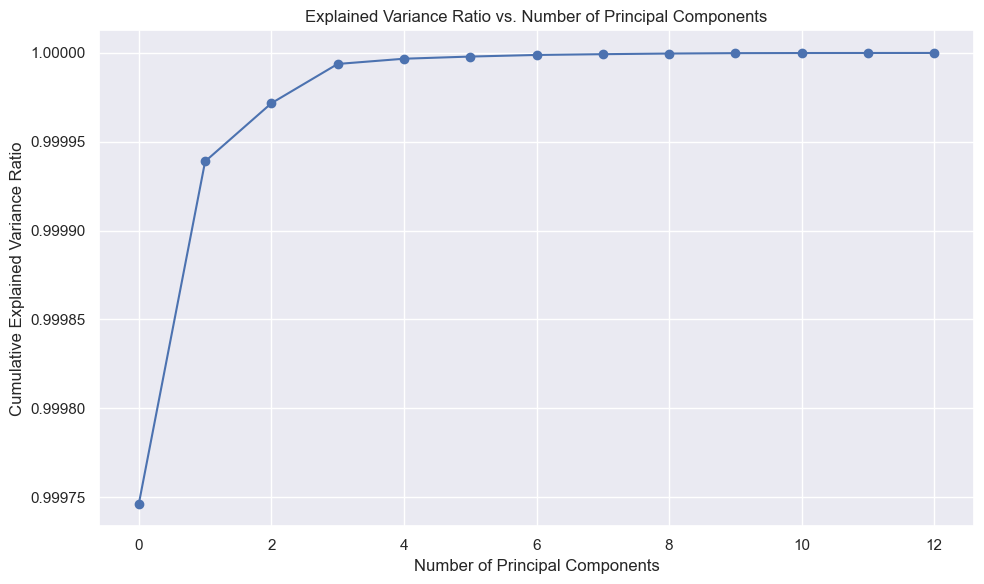

In [72]:
# Apply PCA
pca = PCA()
X_pca = pca.fit_transform(X)

# Plot the cumulative explained variance ratio
plt.figure(figsize=(10, 6))
plt.plot(np.cumsum(pca.explained_variance_ratio_), marker='o')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance Ratio')
plt.title('Explained Variance Ratio vs. Number of Principal Components')
plt.grid(True)
plt.show()

In [73]:
# Apply PCA with 9 components
pca_new = PCA(n_components=9)
x_new = pca_new.fit_transform(X_resampled)

In [74]:
# Assuming x_new is the result of PCA transformation with 9 components
principle_x = pd.DataFrame(x_new, columns=[f'PC{i+1}' for i in range(9)])
# Display the new DataFrame
print(principle_x.head())

           PC1       PC2        PC3        PC4       PC5        PC6  \
0 -1110.788710 -0.681728   4.338224 -29.606796 -2.833595   3.536397   
1 -1110.786287 -0.882288  -1.770594  -0.879294 -1.303422  -0.675684   
2 -1110.778271 -0.731250  12.806383  -4.139324 -1.506732  -2.584065   
3 -1110.786454 -0.884259  -2.887802  -0.649655 -2.884039   3.332638   
4 -1110.789582 -0.704966   3.637348 -26.870257  0.074357 -12.686391   

         PC7       PC8       PC9  
0  -1.922283 -2.122569 -0.115338  
1   1.062590 -0.899321 -2.394326  
2   2.209362 -0.968594  0.068865  
3  -1.749341  3.722360 -1.067326  
4 -10.154425 -0.969888  0.070272  


In [75]:
print('Shape of principle_x:', principle_x.shape)
print('Shape of Y:', Y.shape)

Shape of principle_x: (43534, 9)
Shape of Y: (28061,)


In [76]:
# Check the indices of principle_x and Y to find discrepancies
print('Indices of principle_x:', principle_x.index)
print('Indices of Y:', Y.index)

# Check if they have any common or missing indices
common_indices = principle_x.index.intersection(Y.index)
missing_in_principle_x = Y.index.difference(principle_x.index)
missing_in_Y = principle_x.index.difference(Y.index)

print('Common indices:', common_indices)
print('Indices missing in principle_x:', missing_in_principle_x)
print('Indices missing in Y:', missing_in_Y)

# If indices don't match, you may need to re-align them
principle_x_aligned = principle_x.loc[common_indices]
Y_aligned = Y.loc[common_indices]

# Ensure lengths match after alignment
print('Number of samples in aligned principle_x:', principle_x_aligned.shape[0])
print('Number of samples in aligned Y:', Y_aligned.shape[0])

# Proceed if lengths match
if principle_x_aligned.shape[0] == Y_aligned.shape[0]:
    X_train, X_test, Y_train, Y_test = train_test_split(principle_x_aligned, Y_aligned, random_state=99, test_size=0.3)
    print('Training feature matrix size:', X_train.shape)
    print('Training target vector size:', Y_train.shape)
    print('Test feature matrix size:', X_test.shape)
    print('Test target vector size:', Y_test.shape)
else:
    raise ValueError("Mismatch between number of samples in aligned principle_x and Y.")


Indices of principle_x: RangeIndex(start=0, stop=43534, step=1)
Indices of Y: Index([    0,     1,     2,     4,     5,     6,     7,     8,    11,    12,
       ...
       32548, 32549, 32551, 32553, 32554, 32555, 32556, 32557, 32558, 32559],
      dtype='int64', length=28061)
Common indices: Index([    0,     1,     2,     4,     5,     6,     7,     8,    11,    12,
       ...
       32548, 32549, 32551, 32553, 32554, 32555, 32556, 32557, 32558, 32559],
      dtype='int64', length=28061)
Indices missing in principle_x: Index([], dtype='int64')
Indices missing in Y: Index([    3,     9,    10,    13,    14,    22,    26,    27,    31,    51,
       ...
       43524, 43525, 43526, 43527, 43528, 43529, 43530, 43531, 43532, 43533],
      dtype='int64', length=15473)
Number of samples in aligned principle_x: 28061
Number of samples in aligned Y: 28061
Training feature matrix size: (19642, 9)
Training target vector size: (19642,)
Test feature matrix size: (8419, 9)
Test target vector size

In [77]:
maxAccu=0
maxRS=0
for i in range(1,250):
    X_train,X_test,Y_train,Y_test = train_test_split(principle_x_aligned, Y_aligned, random_state=i, test_size=0.3)
    log_reg=LogisticRegression()
    log_reg.fit(X_train,Y_train)
    y_pred=log_reg.predict(X_test)
    acc=accuracy_score(Y_test,y_pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print('Best accuracy is', maxAccu ,'on Random_state', maxRS)

Best accuracy is 0.7865542225917568 on Random_state 202


In [78]:
X_train, X_test, Y_train, Y_test = train_test_split(principle_x_aligned, Y_aligned, random_state=28, test_size=.3)
log_reg=LogisticRegression()
log_reg.fit(X_train,Y_train)
y_pred=log_reg.predict(X_test)
print('\033[1m'+'Logistics Regression Evaluation'+'\033[0m')
print('\n')
print('\033[1m'+'Accuracy Score of Logistics Regression :'+'\033[0m', accuracy_score(Y_test, y_pred))
print('\n')
print('\033[1m'+'Confusion matrix of Logistics Regression :'+'\033[0m \n',confusion_matrix(Y_test, y_pred))
print('\n')
print('\033[1m'+'classification Report of Logistics Regression'+'\033[0m \n',classification_report(Y_test, y_pred))

Logistics Regression Evaluation


Accuracy Score of Logistics Regression : 0.7766955695450766


Confusion matrix of Logistics Regression : 
 [[6539    0]
 [1880    0]]


classification Report of Logistics Regression 
               precision    recall  f1-score   support

           0       0.78      1.00      0.87      6539
           1       0.00      0.00      0.00      1880

    accuracy                           0.78      8419
   macro avg       0.39      0.50      0.44      8419
weighted avg       0.60      0.78      0.68      8419



In [79]:
rmse_val = [] #to store rmse values for different k
for K in range(12):
    K = K+1
    model = neighbors.KNeighborsClassifier(n_neighbors = K)

    model.fit(X_train,Y_train)  #fit the model
    y_pred=model.predict(X_test) #make prediction on test set
    error = sqrt(mean_squared_error(Y_test,y_pred)) #calculate rmse
    rmse_val.append(error) #store rmse values
    print('RMSE value for k= ' , K , 'is:', error)

RMSE value for k=  1 is: 0.5913418941494172
RMSE value for k=  2 is: 0.5016897448336645
RMSE value for k=  3 is: 0.5449287851858261
RMSE value for k=  4 is: 0.49597500981150716
RMSE value for k=  5 is: 0.5173093655529534
RMSE value for k=  6 is: 0.48556793598191345
RMSE value for k=  7 is: 0.499197598222893
RMSE value for k=  8 is: 0.4808977232881117
RMSE value for k=  9 is: 0.4875209571819963
RMSE value for k=  10 is: 0.47780032069311995
RMSE value for k=  11 is: 0.48213111265234243
RMSE value for k=  12 is: 0.4753078659217155


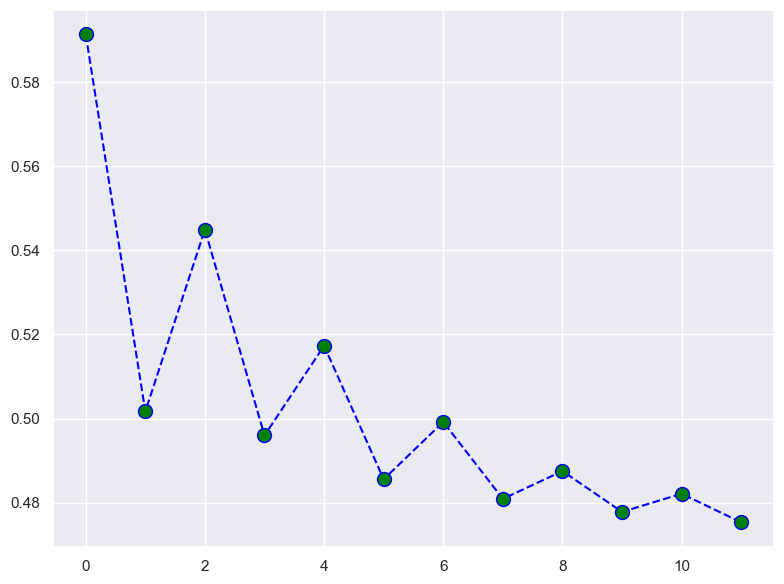

In [80]:
#plotting the rmse values against k values -
plt.figure(figsize = (8,6))
plt.plot(range(12), rmse_val, color='blue', linestyle='dashed', marker='o', markerfacecolor='green', markersize=10)

In [81]:
model = [
    LogisticRegression(),
    GaussianNB(),
    DecisionTreeClassifier(),
    KNeighborsClassifier(n_neighbors=3),
    RandomForestClassifier(),
    XGBClassifier(),
    ExtraTreesClassifier(),
    CatBoostClassifier() 
]
        
for m in model:
    m.fit(X_train,Y_train)
    y_pred=m.predict(X_test)
    print('\033[1m'+'Classification ML Algorithm Evaluation Matrix',m,'is' +'\033[0m')
    print('\n')
    print('\033[1m'+'Accuracy Score :'+'\033[0m\n', accuracy_score(Y_test, y_pred))
    print('\n')
    print('\033[1m'+'Confusion matrix :'+'\033[0m \n',confusion_matrix(Y_test, y_pred))
    print('\n')
    print('\033[1m'+'Classification Report :'+'\033[0m \n',classification_report(Y_test, y_pred))
    print('\n')
    print('============================================================================================================')

Classification ML Algorithm Evaluation Matrix LogisticRegression() is


Accuracy Score :
 0.7766955695450766


Confusion matrix : 
 [[6539    0]
 [1880    0]]


Classification Report : 
               precision    recall  f1-score   support

           0       0.78      1.00      0.87      6539
           1       0.00      0.00      0.00      1880

    accuracy                           0.78      8419
   macro avg       0.39      0.50      0.44      8419
weighted avg       0.60      0.78      0.68      8419



Classification ML Algorithm Evaluation Matrix GaussianNB() is


Accuracy Score :
 0.760066516213327


Confusion matrix : 
 [[6358  181]
 [1839   41]]


Classification Report : 
               precision    recall  f1-score   support

           0       0.78      0.97      0.86      6539
           1       0.18      0.02      0.04      1880

    accuracy                           0.76      8419
   macro avg       0.48      0.50      0.45      8419
weighted avg       0.64      0.76 

In [82]:
model = [
    LogisticRegression(),
    GaussianNB(),
    DecisionTreeClassifier(),
    KNeighborsClassifier(n_neighbors=3),
    RandomForestClassifier(),
    XGBClassifier(),
    ExtraTreesClassifier(),
    CatBoostClassifier()  
]

for m in model:
    score = cross_val_score(m, principle_x_aligned, Y_aligned, cv =5)
    print('\n')
    print('\033[1m'+'Cross Validation Score', m, ':'+'\033[0m\n')
    print("Score :" ,score)
    print("Mean Score :",score.mean())
    print("Std deviation :",score.std())
    print('\n')
    print('============================================================================================================')



Cross Validation Score LogisticRegression() :

Score : [0.77569927 0.77583749 0.7756593  0.7756593  0.77209551]
Mean Score : 0.7749901746518335
Std deviation : 0.001448813847858454




Cross Validation Score GaussianNB() :

Score : [0.76875111 0.77583749 0.7756593  0.77601568 0.76443336]
Mean Score : 0.7721393887700112
Std deviation : 0.004731906994042858




Cross Validation Score DecisionTreeClassifier() :

Score : [0.65366114 0.65146115 0.65359943 0.64985745 0.65181753]
Mean Score : 0.6520793420832582
Std deviation : 0.0014283048927691067




Cross Validation Score KNeighborsClassifier(n_neighbors=3) :

Score : [0.69285587 0.70349252 0.69725588 0.69725588 0.6986814 ]
Mean Score : 0.6979083087715503
Std deviation : 0.003410557040577808




Cross Validation Score RandomForestClassifier() :

Score : [0.73899875 0.74429793 0.74572345 0.74679259 0.74198147]
Mean Score : 0.7435588382482929
Std deviation : 0.002791824187159185




Cross Validation Score XGBClassifier(base_score=None, boo

In [83]:
parameter = {
    'C': [0.1, 1, 10], 
    'penalty': ['l1', 'l2', 'elasticnet', 'none'],  
    'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],
}


In [84]:
grid_search = GridSearchCV(LogisticRegression(),parameter,verbose=10)
grid_search.fit(X_train,Y_train)

# Get the best parameters and best score
best_parameters = grid_search.best_params_
best_score = grid_search.best_score_

print("Best Parameters:", best_parameters)
print("Best Score:", best_score)

Fitting 5 folds for each of 60 candidates, totalling 300 fits
[CV 1/5; 1/60] START C=0.1, penalty=l1, solver=newton-cg........................
[CV 1/5; 1/60] END C=0.1, penalty=l1, solver=newton-cg;, score=nan total time=   0.0s
[CV 2/5; 1/60] START C=0.1, penalty=l1, solver=newton-cg........................
[CV 2/5; 1/60] END C=0.1, penalty=l1, solver=newton-cg;, score=nan total time=   0.0s
[CV 3/5; 1/60] START C=0.1, penalty=l1, solver=newton-cg........................
[CV 3/5; 1/60] END C=0.1, penalty=l1, solver=newton-cg;, score=nan total time=   0.0s
[CV 4/5; 1/60] START C=0.1, penalty=l1, solver=newton-cg........................
[CV 4/5; 1/60] END C=0.1, penalty=l1, solver=newton-cg;, score=nan total time=   0.0s
[CV 5/5; 1/60] START C=0.1, penalty=l1, solver=newton-cg........................
[CV 5/5; 1/60] END C=0.1, penalty=l1, solver=newton-cg;, score=nan total time=   0.0s
[CV 1/5; 2/60] START C=0.1, penalty=l1, solver=lbfgs............................
[CV 1/5; 2/60] END C=0

In [85]:
# Initialize the final Logistic Regression model with the best parameters
final_log_reg = LogisticRegression(C=10, penalty='l2', solver='lbfgs')
final_log_reg.fit(X_train, Y_train)
y_pred = final_log_reg.predict(X_test)
print('\033[1m'+'Accuracy Score :'+'\033[0m\n', accuracy_score(Y_test, y_pred))

Accuracy Score :
 0.7766955695450766


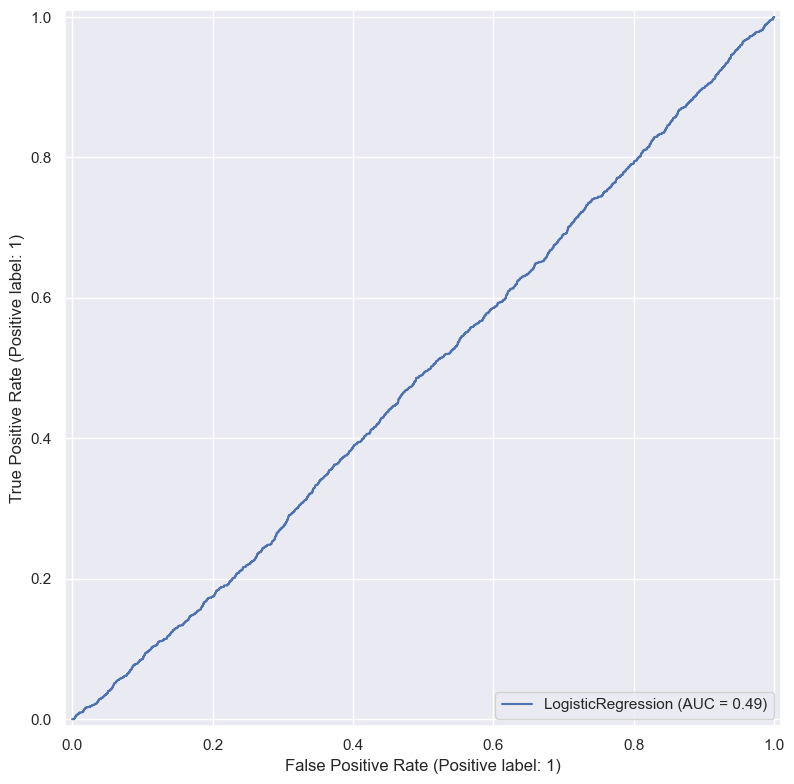

<Figure size 1000x1000 with 0 Axes>

AUC Score :
 0.5


In [86]:
# Plot ROC curve using RocCurveDisplay
RocCurveDisplay.from_estimator(final_log_reg, X_test, Y_test)
plt.legend(prop={'size': 11}, loc='lower right')
plt.figure(figsize=(10, 10))
plt.show()
auc_score = roc_auc_score(Y_test, final_log_reg.predict(X_test))
print('\033[1m'+'AUC Score :'+'\033[0m\n', auc_score)

In [87]:
joblib.dump(final_log_reg,'Census_Income_Final_Model.pkl')

['Census_Income_Final_Model.pkl']

### Question 2

In [89]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import preprocessing
import scipy.stats as stats
from sklearn.model_selection import train_test_split
from collections import Counter
from imblearn.over_sampling import SMOTE
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report, roc_curve, auc, roc_auc_score
from sklearn.metrics import RocCurveDisplay
from sklearn import metrics
from sklearn.ensemble import RandomForestClassifier
from catboost import CatBoostClassifier
from xgboost import XGBClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.impute import SimpleImputer
from collections import Counter
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
import joblib

In [90]:
# Load the DataFrame
df = pd.read_csv(r"C:\Users\ADMIN\Downloads\Rainfall.csv")
pd.set_option("display.max_columns", None)
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,ENE,13.0,11.0,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,N,13.0,9.0,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,WNW,9.0,9.0,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,N,13.0,7.0,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


In [91]:
numerical_feature = [feature for feature in df.columns if df[feature].dtypes != 'O']
discrete_feature=[feature for feature in numerical_feature if len(df[feature].unique())<25]
continuous_feature = [feature for feature in numerical_feature if feature not in discrete_feature]
categorical_feature = [feature for feature in df.columns if feature not in numerical_feature]
print("Numerical Features Count {}".format(len(numerical_feature)))
print("Discrete feature Count {}".format(len(discrete_feature)))
print("Continuous feature Count {}".format(len(continuous_feature)))
print("Categorical feature Count {}".format(len(categorical_feature)))

Numerical Features Count 16
Discrete feature Count 2
Continuous feature Count 14
Categorical feature Count 7


In [92]:
# Handle Missing Values
df.isnull().sum()*100/len(df)

Date              0.000000
Location          0.000000
MinTemp           0.890208
MaxTemp           0.712166
Rainfall          2.848665
Evaporation      41.685460
Sunshine         47.406528
WindGustDir      11.762611
WindGustSpeed    11.762611
WindDir9am        9.839763
WindDir3pm        3.655786
WindSpeed9am      0.902077
WindSpeed3pm      1.270030
Humidity9am       0.700297
Humidity3pm       1.210682
Pressure9am      15.537092
Pressure3pm      15.572700
Cloud9am         28.735905
Cloud3pm         29.139466
Temp9am           0.664688
Temp3pm           1.139466
RainToday         2.848665
RainTomorrow      2.836795
dtype: float64

In [93]:
print(numerical_feature)

['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']


In [94]:
def randomsampleimputation(df, variable):
    df[variable]=df[variable]
    random_sample=df[variable].dropna().sample(df[variable].isnull().sum(),random_state=0)
    random_sample.index=df[df[variable].isnull()].index
    df.loc[df[variable].isnull(),variable]=random_sample

In [95]:
randomsampleimputation(df, "Cloud9am")
randomsampleimputation(df, "Cloud3pm")
randomsampleimputation(df, "Evaporation")
randomsampleimputation(df, "Sunshine")

In [96]:
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,3.0,13.8,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,8.0,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,2.2,7.6,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,1.0,4.0,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,4.6,7.7,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,2.0,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,1.8,8.0,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,8.0,7.0,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,3.8,11.9,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2017-06-21,Uluru,2.8,23.4,0.0,6.4,1.2,E,31.0,SE,ENE,13.0,11.0,51.0,24.0,1024.6,1020.3,8.0,4.0,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,12.6,7.1,NNW,22.0,SE,N,13.0,9.0,56.0,21.0,1023.5,1019.1,1.0,1.0,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,4.2,13.0,N,37.0,SE,WNW,9.0,9.0,53.0,24.0,1021.0,1016.8,6.0,5.0,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,4.0,13.1,SE,28.0,SSE,N,13.0,7.0,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


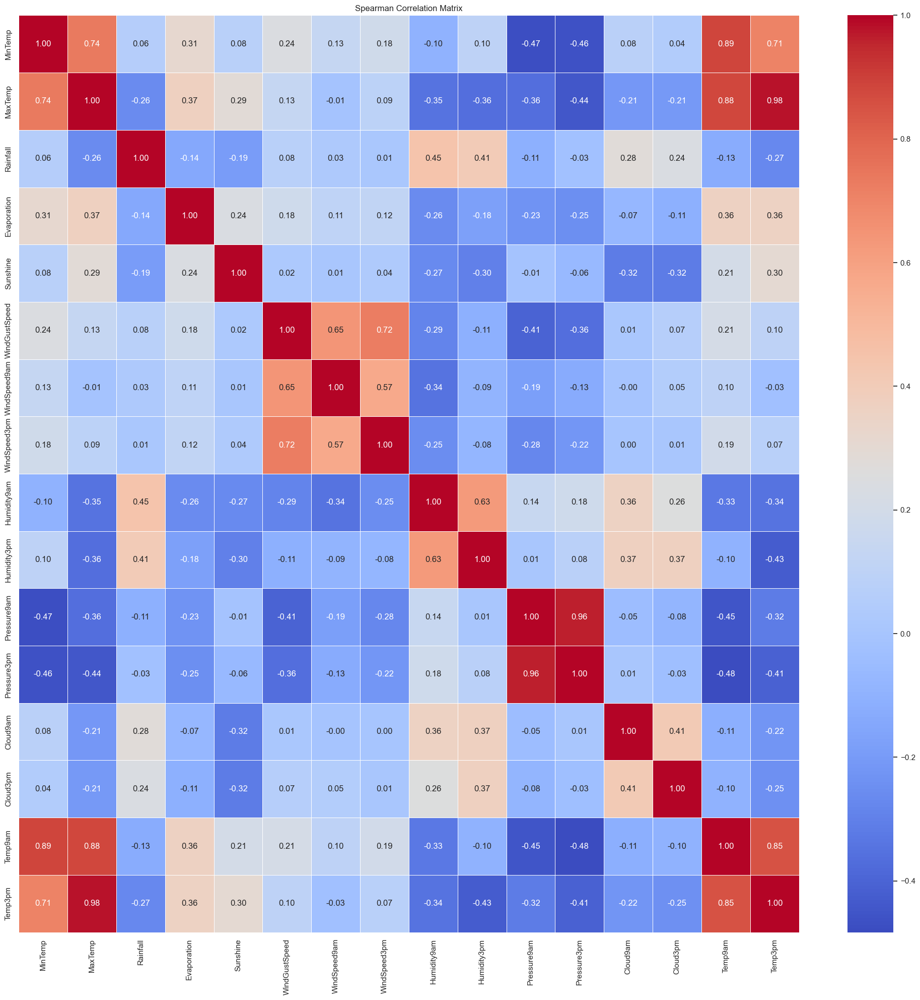

In [97]:
numeric_df = df.select_dtypes(include=[float, int])

corrmat = numeric_df.corr(method="spearman")

# Set the figure size
plt.figure(figsize=(20, 20))

# Plot the heatmap
g = sns.heatmap(corrmat, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)

# Add title
plt.title('Spearman Correlation Matrix')

# Show the plot
plt.show()

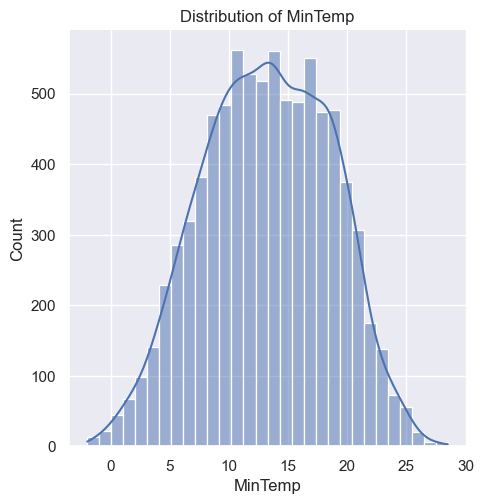

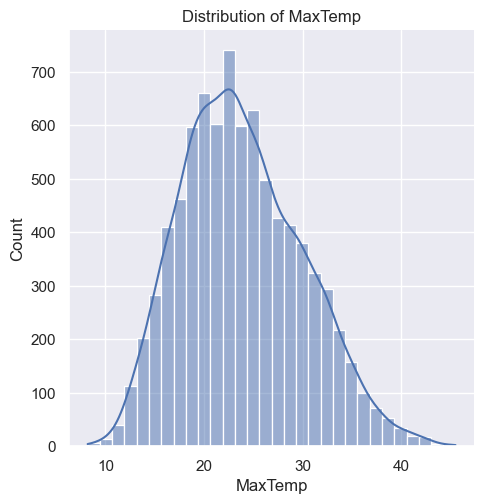

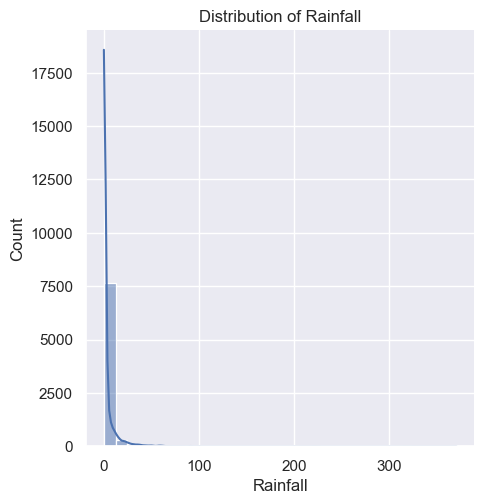

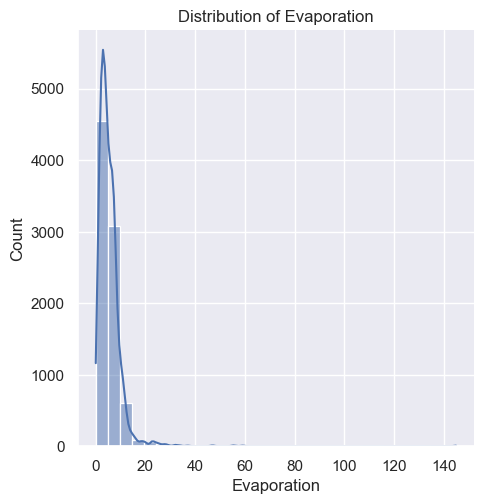

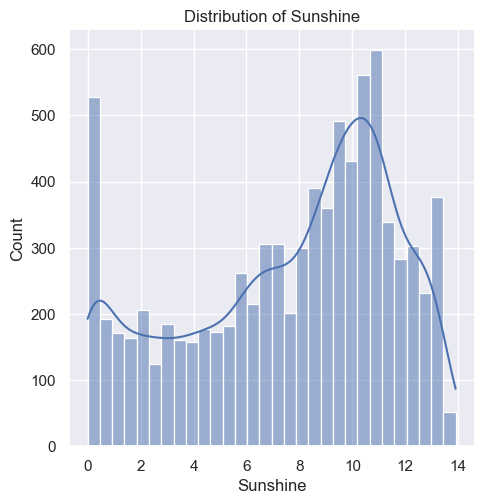

...

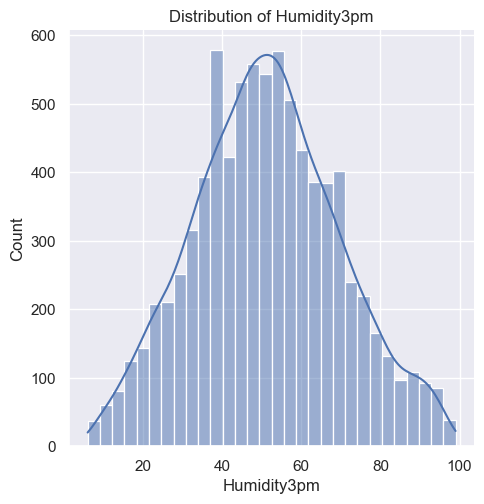

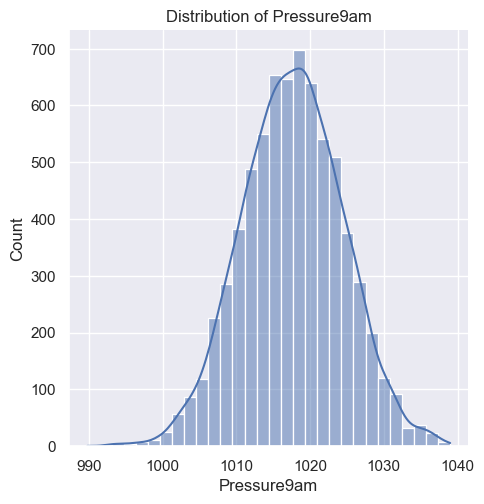

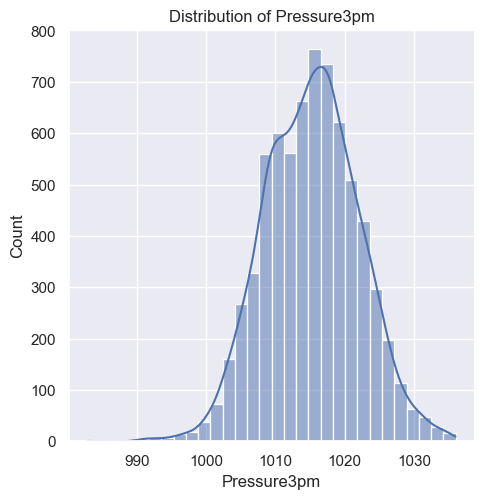

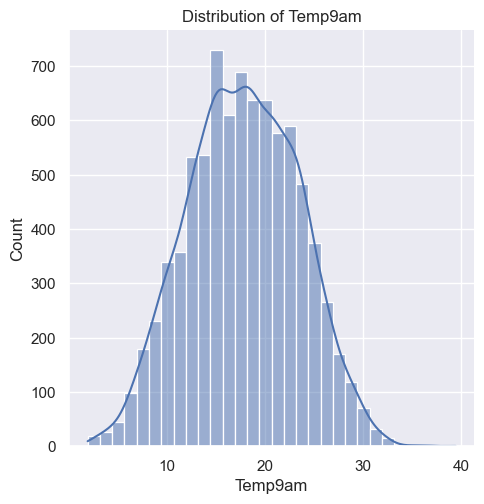

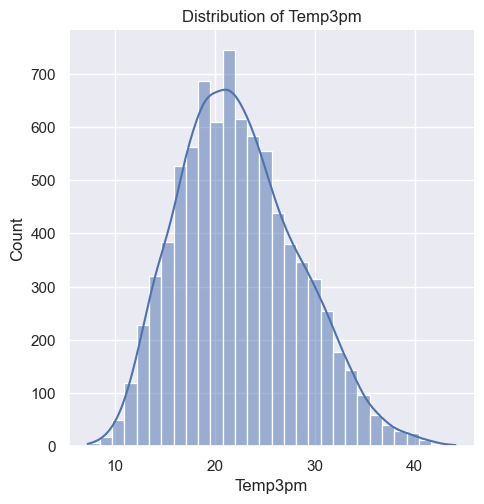

In [98]:
for feature in continuous_feature:
    # Create a displot for each feature
    sns.displot(df[feature], kde=True, bins=30)
    plt.xlabel(feature)
    plt.ylabel("Count")
    plt.title(f"Distribution of {feature}")
    plt.show()

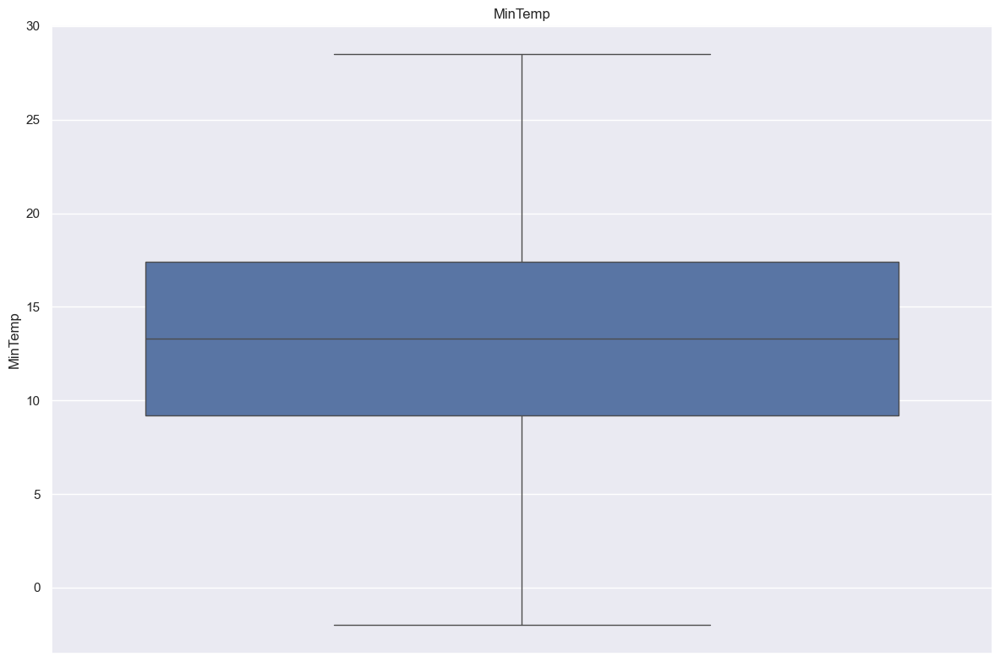

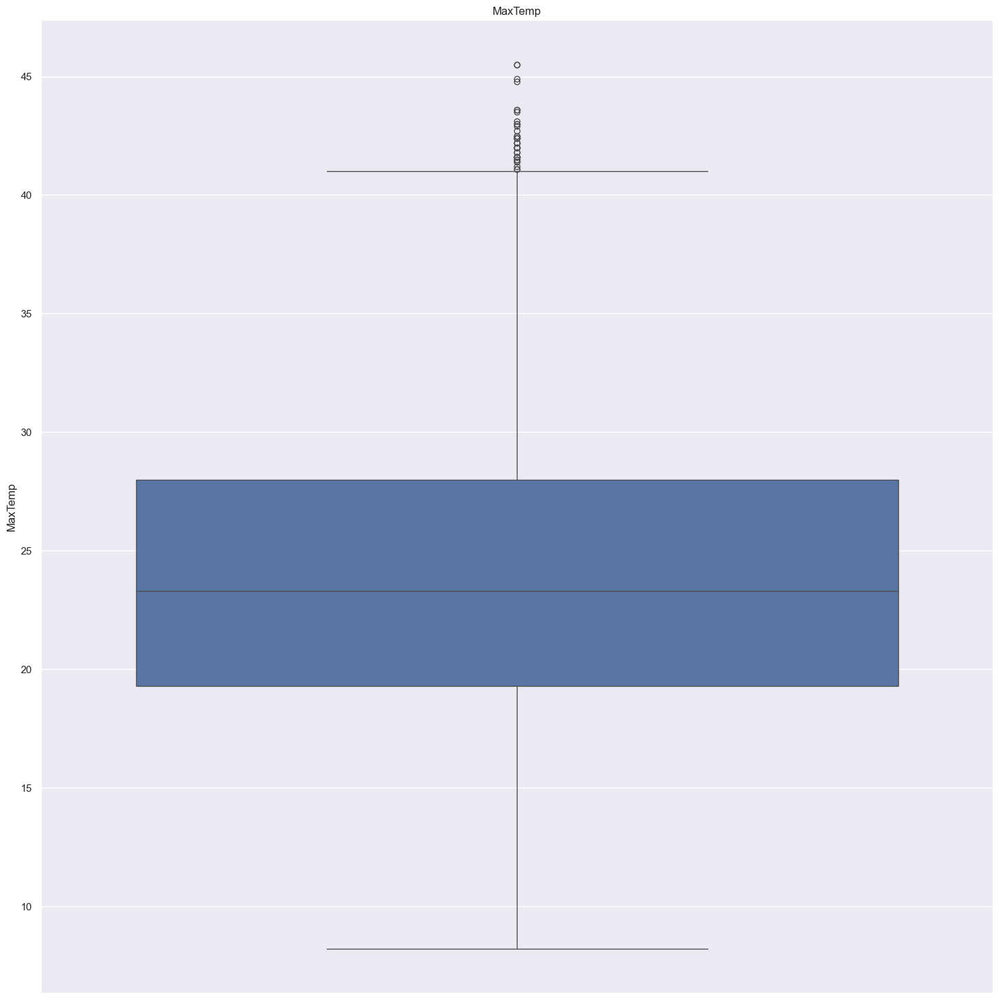

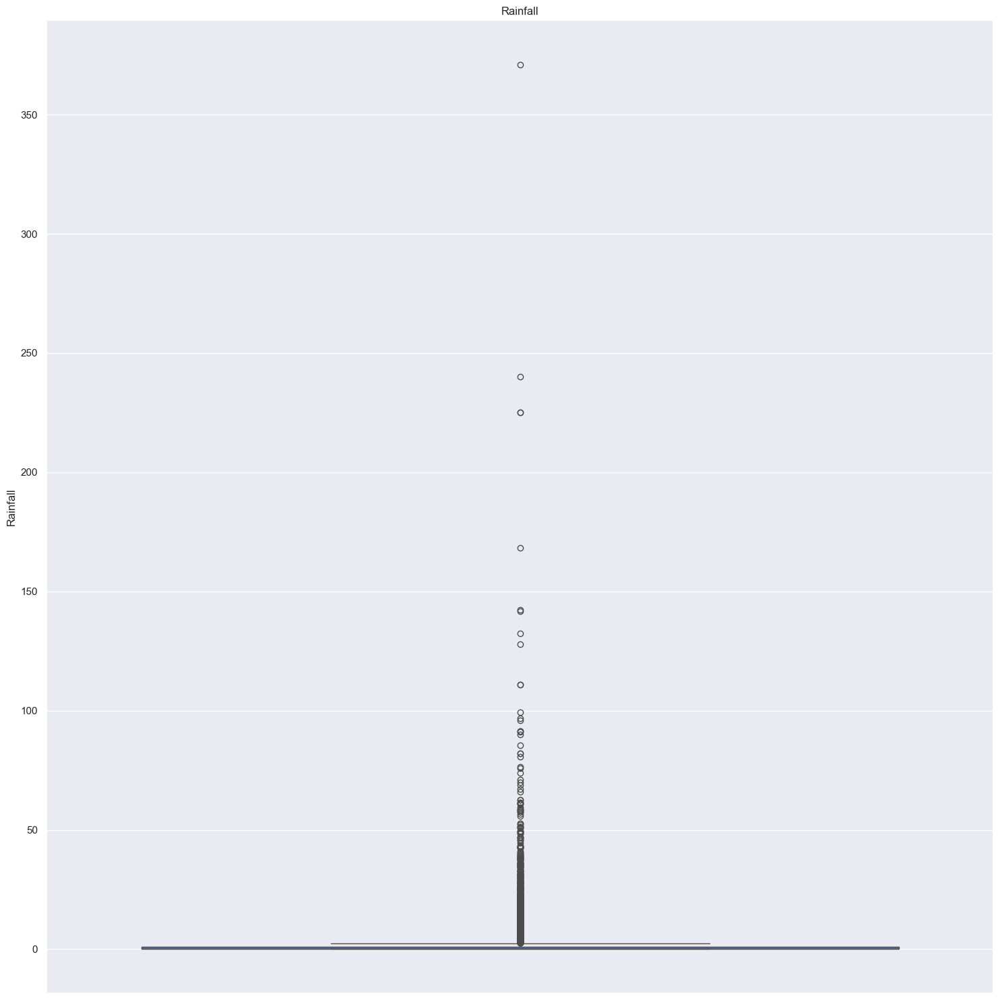

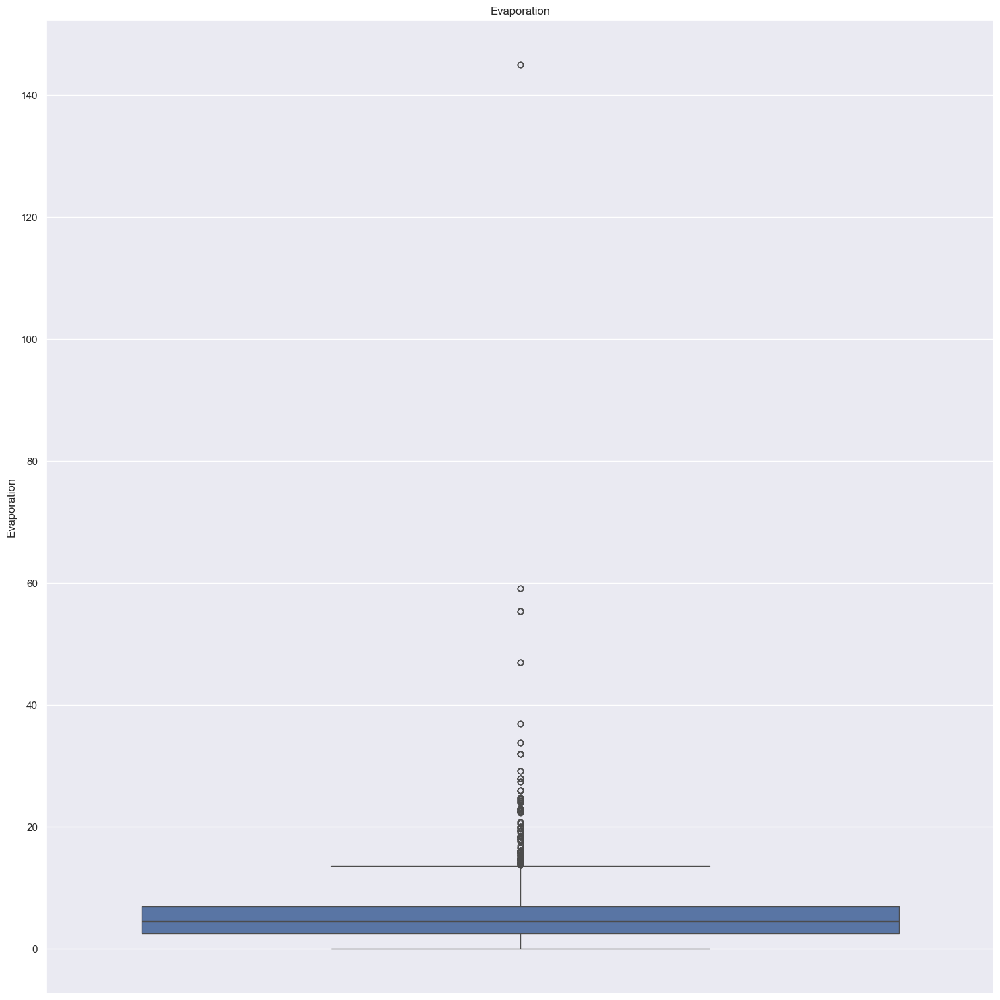

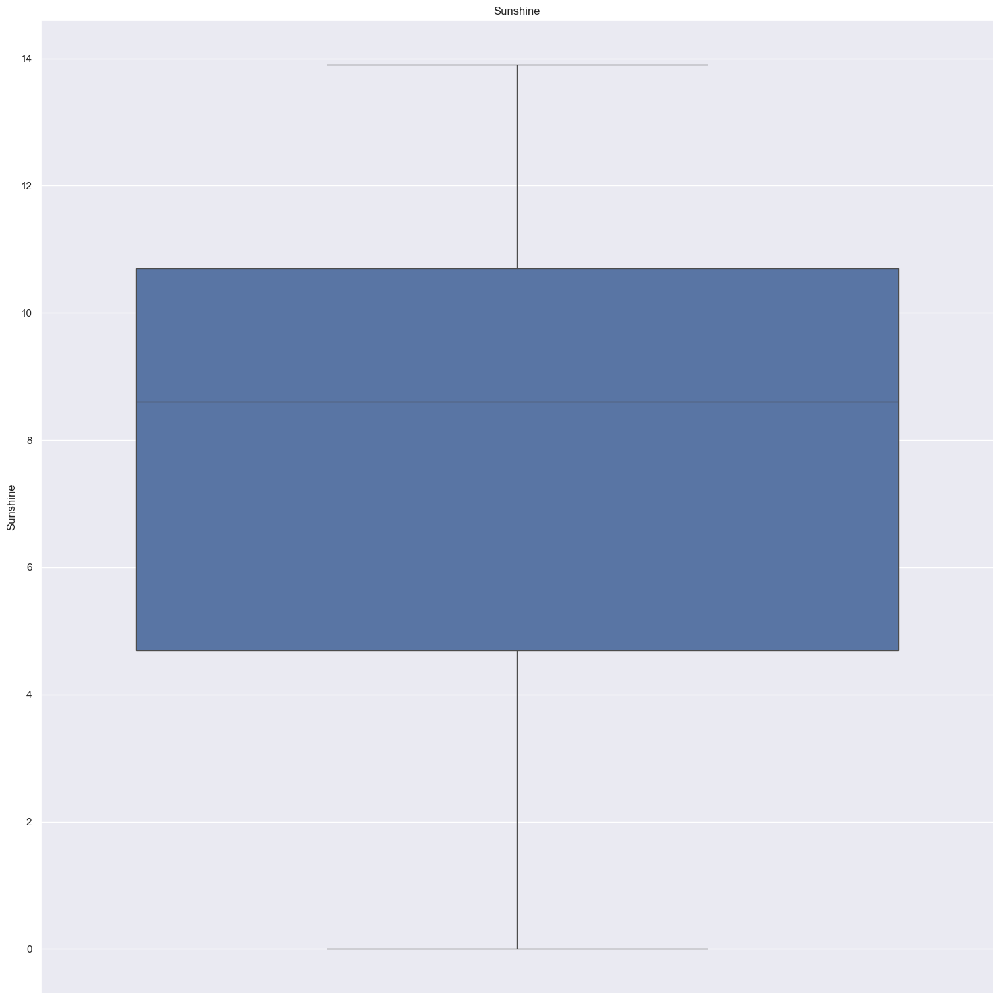

...

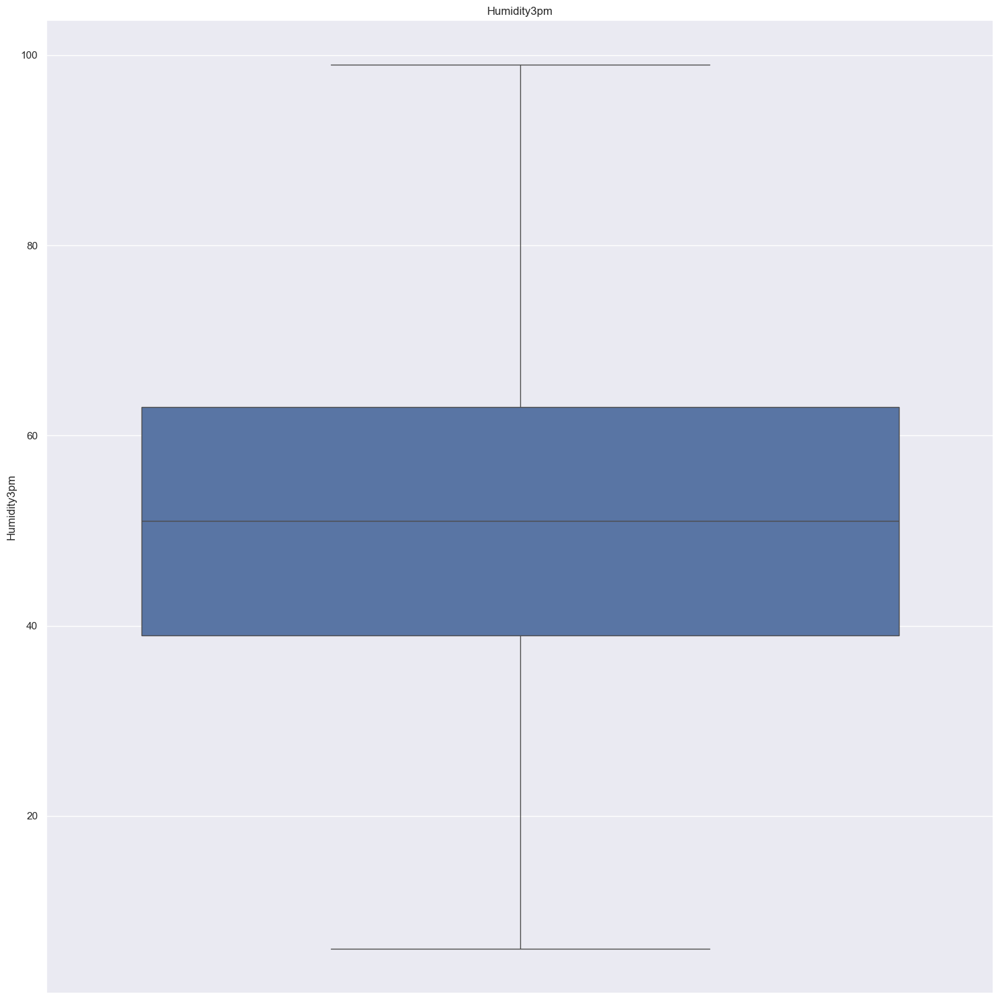

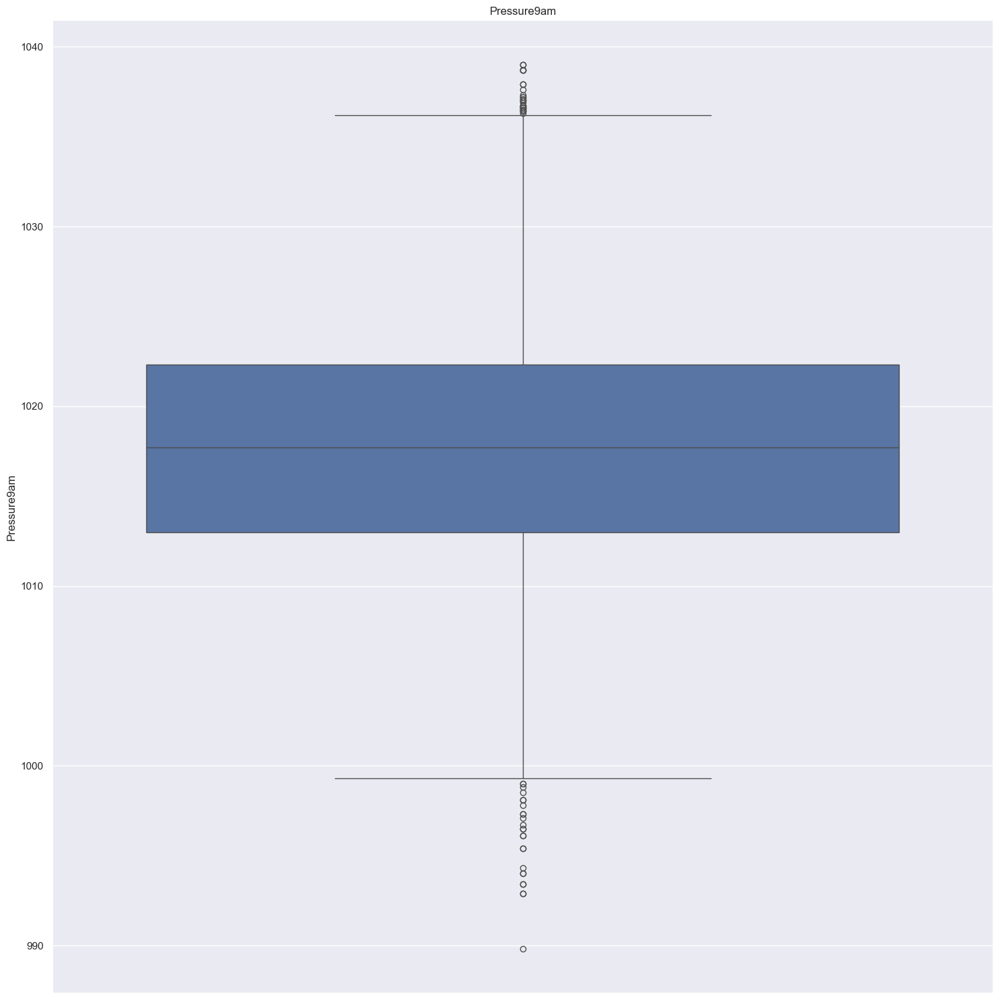

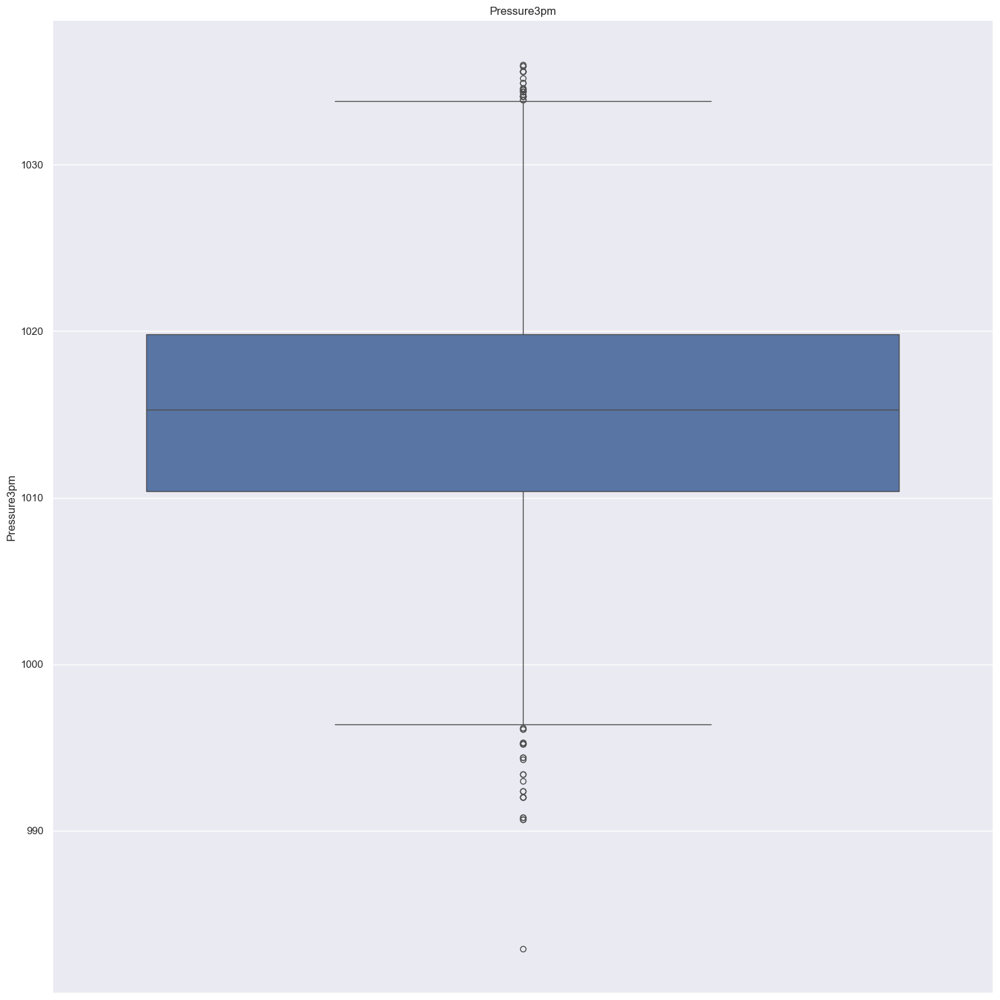

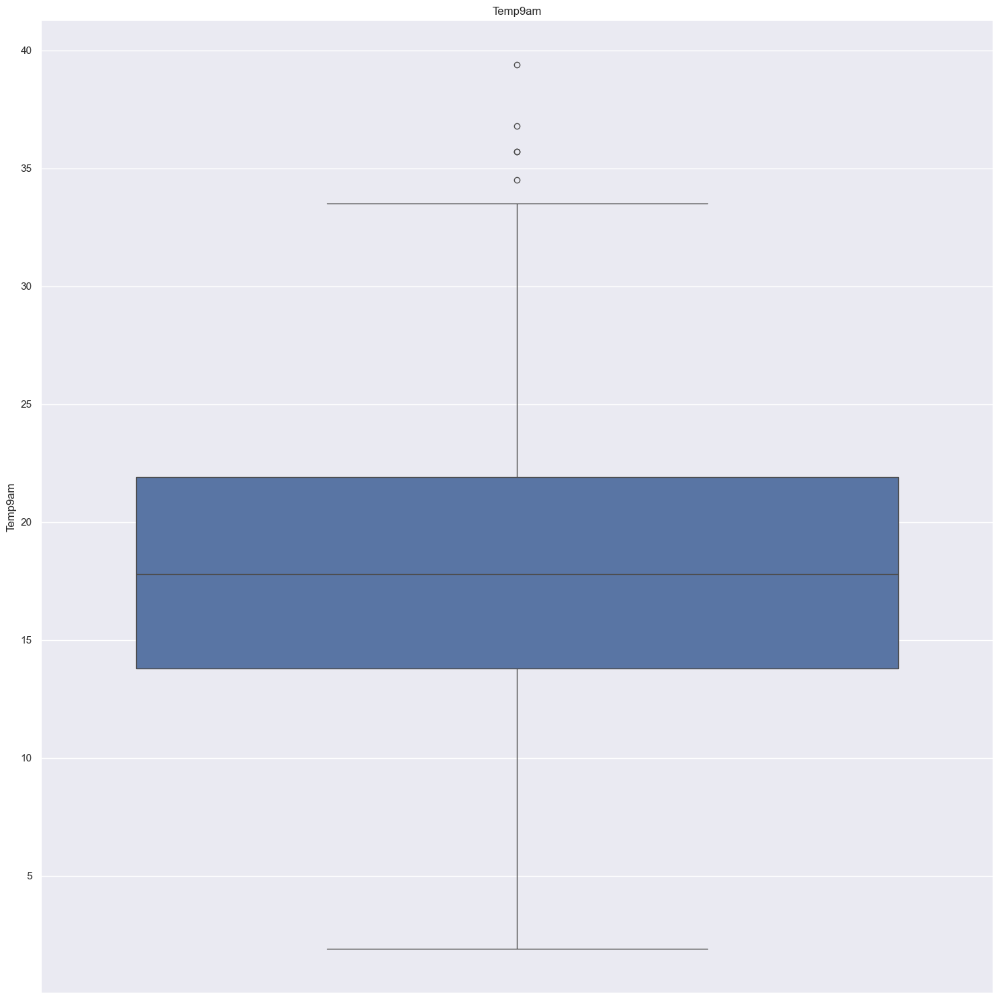

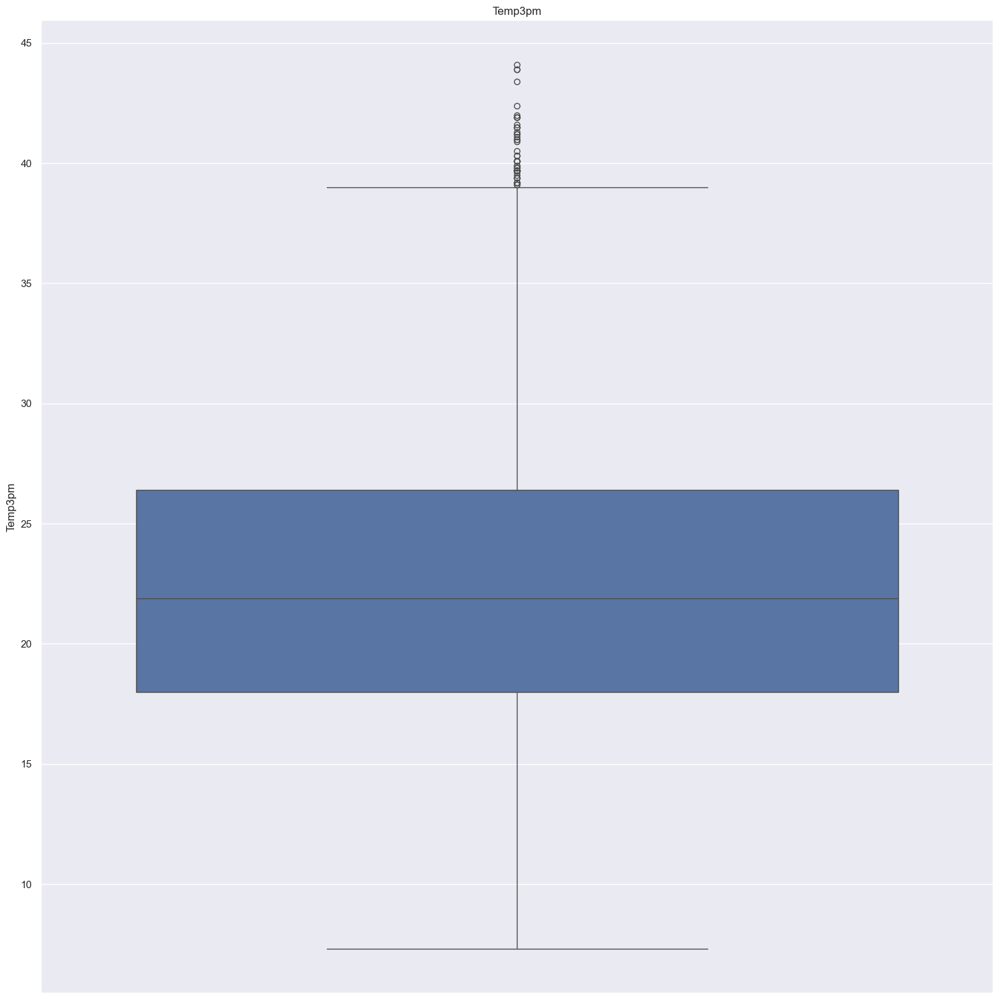

<Figure size 1500x1500 with 0 Axes>

In [99]:
#A for loop is used to plot a boxplot for all the continuous features to see the outliers
for feature in continuous_feature:
    data=df.copy()
    sns.boxplot(data[feature])
    plt.title(feature)
    plt.figure(figsize=(15,15))

In [100]:
for feature in continuous_feature:
    if(df[feature].isnull().sum()*100/len(df))>0:
        df[feature] = df[feature].fillna(df[feature].median())

In [101]:
df.isnull().sum()*100/len(df)

Date              0.000000
Location          0.000000
MinTemp           0.000000
MaxTemp           0.000000
Rainfall          0.000000
Evaporation       0.000000
Sunshine          0.000000
WindGustDir      11.762611
WindGustSpeed     0.000000
WindDir9am        9.839763
WindDir3pm        3.655786
WindSpeed9am      0.000000
WindSpeed3pm      0.000000
Humidity9am       0.000000
Humidity3pm       0.000000
Pressure9am       0.000000
Pressure3pm       0.000000
Cloud9am          0.000000
Cloud3pm          0.000000
Temp9am           0.000000
Temp3pm           0.000000
RainToday         2.848665
RainTomorrow      2.836795
dtype: float64

In [102]:
discrete_feature

['Cloud9am', 'Cloud3pm']

In [103]:
def mode_nan(df, variable):
    mode = df[variable].value_counts().index[0]
    df[variable].fillna(mode, inplace=True) 

In [104]:
df["RainToday"] = pd.get_dummies(df["RainToday"], drop_first = True)
df["RainTomorrow"] = pd.get_dummies(df["RainTomorrow"], drop_first = True)
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,3.0,13.8,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,8.0,16.9,21.8,False,False
1,2008-12-02,Albury,7.4,25.1,0.0,2.2,7.6,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,1.0,4.0,17.2,24.3,False,False
2,2008-12-03,Albury,12.9,25.7,0.0,4.6,7.7,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,2.0,2.0,21.0,23.2,False,False
3,2008-12-04,Albury,9.2,28.0,0.0,1.8,8.0,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,8.0,7.0,18.1,26.5,False,False
4,2008-12-05,Albury,17.5,32.3,1.0,3.8,11.9,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2017-06-21,Uluru,2.8,23.4,0.0,6.4,1.2,E,31.0,SE,ENE,13.0,11.0,51.0,24.0,1024.6,1020.3,8.0,4.0,10.1,22.4,False,False
8421,2017-06-22,Uluru,3.6,25.3,0.0,12.6,7.1,NNW,22.0,SE,N,13.0,9.0,56.0,21.0,1023.5,1019.1,1.0,1.0,10.9,24.5,False,False
8422,2017-06-23,Uluru,5.4,26.9,0.0,4.2,13.0,N,37.0,SE,WNW,9.0,9.0,53.0,24.0,1021.0,1016.8,6.0,5.0,12.5,26.1,False,False
8423,2017-06-24,Uluru,7.8,27.0,0.0,4.0,13.1,SE,28.0,SSE,N,13.0,7.0,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,False,False


In [105]:
for feature in categorical_feature:
    print(feature, (df.groupby([feature])["RainTomorrow"].mean().sort_values(ascending = False)).index)

Date Index(['2015-01-26', '2017-02-28', '2014-04-26', '2014-04-27', '2017-02-25',
       '2017-02-26', '2015-11-04', '2015-11-03', '2017-02-27', '2017-03-01',
       ...
       '2013-01-11', '2013-01-10', '2013-01-09', '2013-01-08', '2013-01-07',
       '2013-01-05', '2013-01-04', '2013-01-03', '2013-01-02', '2017-06-25'],
      dtype='object', name='Date', length=3004)
Location Index(['CoffsHarbour', 'Wollongong', 'Melbourne', 'Williamtown', 'Newcastle',
       'Penrith', 'Brisbane', 'Adelaide', 'Albury', 'PerthAirport', 'Darwin',
       'Uluru'],
      dtype='object', name='Location')
WindGustDir Index(['NNW', 'SSW', 'N', 'WSW', 'NW', 'SW', 'NNE', 'S', 'WNW', 'NE', 'SSE',
       'SE', 'ESE', 'W', 'ENE', 'E'],
      dtype='object', name='WindGustDir')
WindDir9am Index(['N', 'WNW', 'SW', 'W', 'NNE', 'NNW', 'SSW', 'ESE', 'WSW', 'S', 'NW',
       'NE', 'SSE', 'SE', 'ENE', 'E'],
      dtype='object', name='WindDir9am')
WindDir3pm Index(['NNW', 'SSW', 'N', 'NW', 'S', 'WSW', 'SW', 'NNE', 'S

In [106]:
windgustdir = {'NNW':0, 'NW':1, 'WNW':2, 'N':3, 'W':4, 'WSW':5, 'NNE':6, 'S':7, 'SSW':8, 'SW':9, 'SSE':10,
       'NE':11, 'SE':12, 'ESE':13, 'ENE':14, 'E':15}
winddir9am = {'NNW':0, 'N':1, 'NW':2, 'NNE':3, 'WNW':4, 'W':5, 'WSW':6, 'SW':7, 'SSW':8, 'NE':9, 'S':10,
       'SSE':11, 'ENE':12, 'SE':13, 'ESE':14, 'E':15}
winddir3pm = {'NW':0, 'NNW':1, 'N':2, 'WNW':3, 'W':4, 'NNE':5, 'WSW':6, 'SSW':7, 'S':8, 'SW':9, 'SE':10,
       'NE':11, 'SSE':12, 'ENE':13, 'E':14, 'ESE':15}
df["WindGustDir"] = df["WindGustDir"].map(windgustdir)
df["WindDir9am"] = df["WindDir9am"].map(winddir9am)
df["WindDir3pm"] = df["WindDir3pm"].map(winddir3pm)

In [107]:
df["WindGustDir"] = df["WindGustDir"].fillna(df["WindGustDir"].value_counts().index[0])
df["WindDir9am"] = df["WindDir9am"].fillna(df["WindDir9am"].value_counts().index[0])
df["WindDir3pm"] = df["WindDir3pm"].fillna(df["WindDir3pm"].value_counts().index[0])

In [108]:
df.isnull().sum()*100/len(df)

Date             0.0
Location         0.0
MinTemp          0.0
MaxTemp          0.0
Rainfall         0.0
Evaporation      0.0
Sunshine         0.0
WindGustDir      0.0
WindGustSpeed    0.0
WindDir9am       0.0
WindDir3pm       0.0
WindSpeed9am     0.0
WindSpeed3pm     0.0
Humidity9am      0.0
Humidity3pm      0.0
Pressure9am      0.0
Pressure3pm      0.0
Cloud9am         0.0
Cloud3pm         0.0
Temp9am          0.0
Temp3pm          0.0
RainToday        0.0
RainTomorrow     0.0
dtype: float64

In [109]:
df1 = df.groupby(["Location"])["RainTomorrow"].value_counts().sort_values().unstack()

In [110]:
df1

RainTomorrow,False,True
Location,,
Adelaide,160.0,45.0
Albury,708.0,199.0
Brisbane,444.0,135.0
CoffsHarbour,425.0,186.0
Darwin,218.0,32.0
Melbourne,1216.0,406.0
Newcastle,624.0,198.0
Penrith,366.0,116.0
PerthAirport,962.0,242.0


In [111]:
df1.iloc[:, 1].sort_values(ascending=False)

Location
Melbourne       406.0
Williamtown     306.0
PerthAirport    242.0
Albury          199.0
Newcastle       198.0
CoffsHarbour    186.0
Brisbane        135.0
Wollongong      126.0
Penrith         116.0
Adelaide         45.0
Darwin           32.0
Uluru             NaN
Name: True, dtype: float64

In [112]:
sorted_column = df1.iloc[:, 1].sort_values(ascending=False)
print(sorted_column.index)

Index(['Melbourne', 'Williamtown', 'PerthAirport', 'Albury', 'Newcastle',
       'CoffsHarbour', 'Brisbane', 'Wollongong', 'Penrith', 'Adelaide',
       'Darwin', 'Uluru'],
      dtype='object', name='Location')


In [113]:
sorted_column = df1.iloc[:, 1].sort_values(ascending=False)
print("Length of Sorted Column Index:", len(sorted_column.index))

Length of Sorted Column Index: 12


In [114]:
location = {'Portland':1, 'Cairns':2, 'Walpole':3, 'Dartmoor':4, 'MountGambier':5,
       'NorfolkIsland':6, 'Albany':7, 'Witchcliffe':8, 'CoffsHarbour':9, 'Sydney':10,
       'Darwin':11, 'MountGinini':12, 'NorahHead':13, 'Ballarat':14, 'GoldCoast':15,
       'SydneyAirport':16, 'Hobart':17, 'Watsonia':18, 'Newcastle':19, 'Wollongong':20,
       'Brisbane':21, 'Williamtown':22, 'Launceston':23, 'Adelaide':24, 'MelbourneAirport':25,
       'Perth':26, 'Sale':27, 'Melbourne':28, 'Canberra':29, 'Albury':30, 'Penrith':31,
       'Nuriootpa':32, 'BadgerysCreek':33, 'Tuggeranong':34, 'PerthAirport':35, 'Bendigo':36,
       'Richmond':37, 'WaggaWagga':38, 'Townsville':39, 'PearceRAAF':40, 'SalmonGums':41,
       'Moree':42, 'Cobar':43, 'Mildura':44, 'Katherine':45, 'AliceSprings':46, 'Nhil':47,
       'Woomera':48, 'Uluru':49}
df["Location"] = df["Location"].map(location)

In [115]:
df["Date"] = pd.to_datetime(df["Date"], format = "%Y-%m-%dT", errors = "coerce")

In [116]:
df["Date_month"] = df["Date"].dt.month
df["Date_day"] = df["Date"].dt.day

In [117]:
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Date_month,Date_day
0,NaT,30,13.4,22.9,0.6,3.0,13.8,4.0,44.0,5.0,3.0,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,8.0,16.9,21.8,False,False,NaN,NaN
1,NaT,30,7.4,25.1,0.0,2.2,7.6,2.0,44.0,0.0,6.0,4.0,22.0,44.0,25.0,1010.6,1007.8,1.0,4.0,17.2,24.3,False,False,NaN,NaN
2,NaT,30,12.9,25.7,0.0,4.6,7.7,5.0,46.0,5.0,6.0,19.0,26.0,38.0,30.0,1007.6,1008.7,2.0,2.0,21.0,23.2,False,False,NaN,NaN
3,NaT,30,9.2,28.0,0.0,1.8,8.0,11.0,24.0,13.0,14.0,11.0,9.0,45.0,16.0,1017.6,1012.8,8.0,7.0,18.1,26.5,False,False,NaN,NaN
4,NaT,30,17.5,32.3,1.0,3.8,11.9,4.0,41.0,12.0,0.0,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,False,False,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,NaT,49,2.8,23.4,0.0,6.4,1.2,15.0,31.0,13.0,13.0,13.0,11.0,51.0,24.0,1024.6,1020.3,8.0,4.0,10.1,22.4,False,False,NaN,NaN
8421,NaT,49,3.6,25.3,0.0,12.6,7.1,0.0,22.0,13.0,2.0,13.0,9.0,56.0,21.0,1023.5,1019.1,1.0,1.0,10.9,24.5,False,False,NaN,NaN
8422,NaT,49,5.4,26.9,0.0,4.2,13.0,3.0,37.0,13.0,3.0,9.0,9.0,53.0,24.0,1021.0,1016.8,6.0,5.0,12.5,26.1,False,False,NaN,NaN
8423,NaT,49,7.8,27.0,0.0,4.0,13.1,12.0,28.0,11.0,2.0,13.0,7.0,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,False,False,NaN,NaN


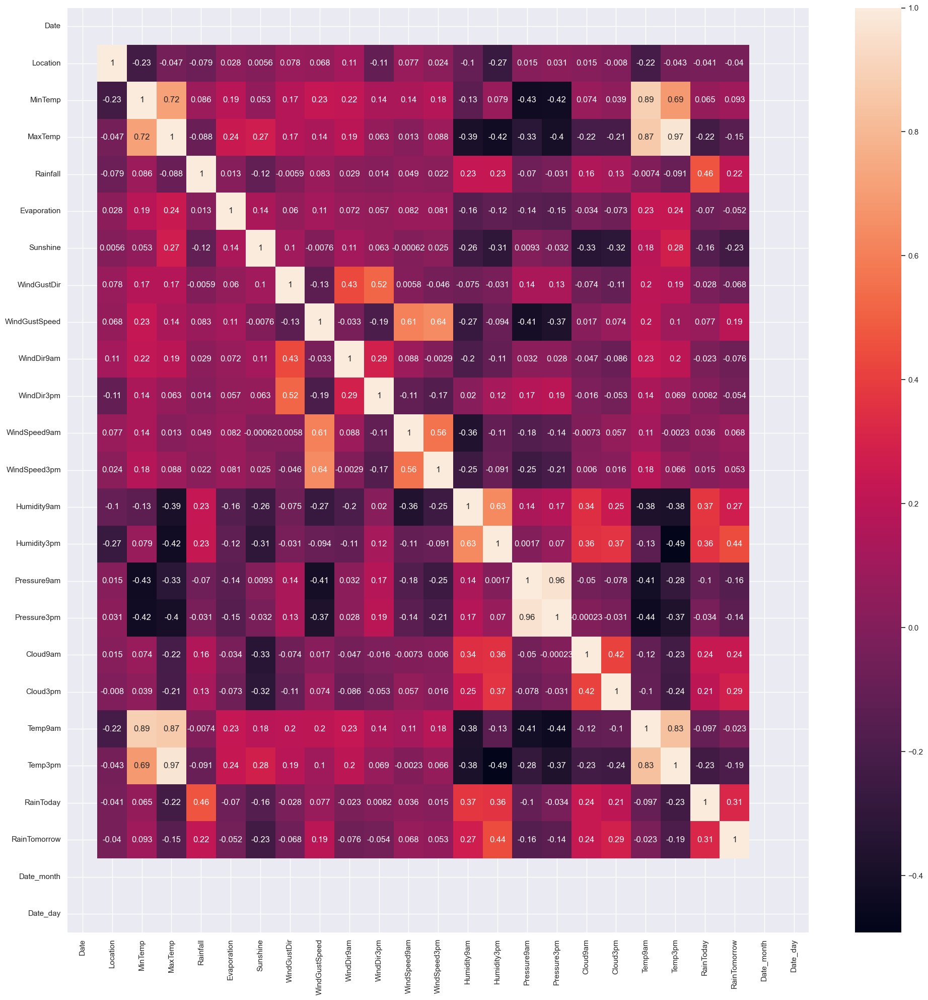

In [118]:
corrmat = df.corr()
plt.figure(figsize=(20,20))
#plot heat map
g=sns.heatmap(corrmat,annot=True)

<Axes: ylabel='count'>

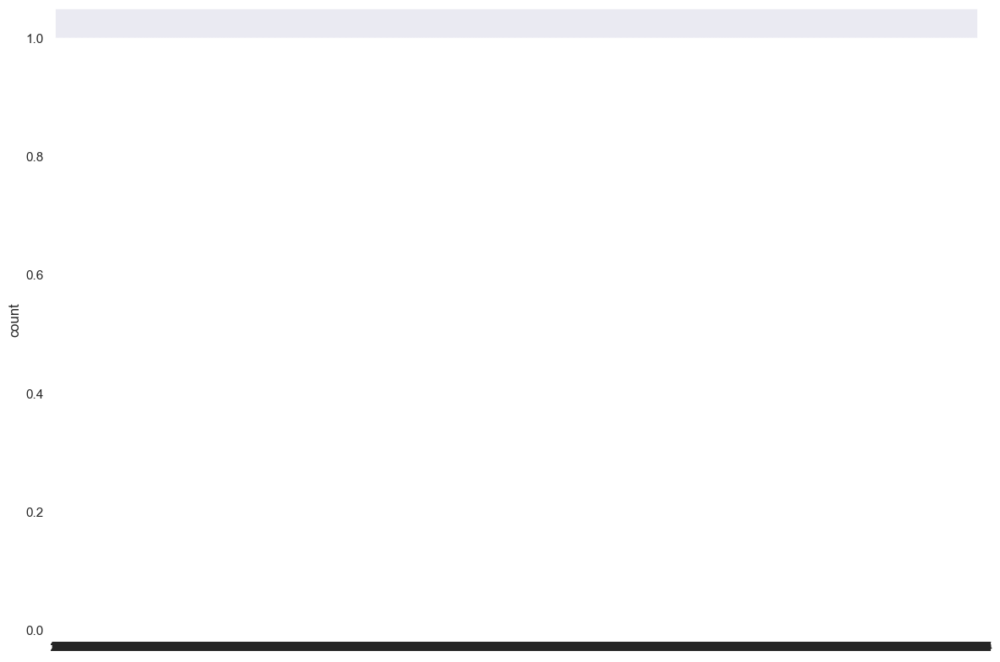

In [119]:
sns.countplot(df["RainTomorrow"])

In [120]:
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Date_month,Date_day
0,NaT,30,13.4,22.9,0.6,3.0,13.8,4.0,44.0,5.0,3.0,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,8.0,16.9,21.8,False,False,NaN,NaN
1,NaT,30,7.4,25.1,0.0,2.2,7.6,2.0,44.0,0.0,6.0,4.0,22.0,44.0,25.0,1010.6,1007.8,1.0,4.0,17.2,24.3,False,False,NaN,NaN
2,NaT,30,12.9,25.7,0.0,4.6,7.7,5.0,46.0,5.0,6.0,19.0,26.0,38.0,30.0,1007.6,1008.7,2.0,2.0,21.0,23.2,False,False,NaN,NaN
3,NaT,30,9.2,28.0,0.0,1.8,8.0,11.0,24.0,13.0,14.0,11.0,9.0,45.0,16.0,1017.6,1012.8,8.0,7.0,18.1,26.5,False,False,NaN,NaN
4,NaT,30,17.5,32.3,1.0,3.8,11.9,4.0,41.0,12.0,0.0,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,False,False,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,NaT,49,2.8,23.4,0.0,6.4,1.2,15.0,31.0,13.0,13.0,13.0,11.0,51.0,24.0,1024.6,1020.3,8.0,4.0,10.1,22.4,False,False,NaN,NaN
8421,NaT,49,3.6,25.3,0.0,12.6,7.1,0.0,22.0,13.0,2.0,13.0,9.0,56.0,21.0,1023.5,1019.1,1.0,1.0,10.9,24.5,False,False,NaN,NaN
8422,NaT,49,5.4,26.9,0.0,4.2,13.0,3.0,37.0,13.0,3.0,9.0,9.0,53.0,24.0,1021.0,1016.8,6.0,5.0,12.5,26.1,False,False,NaN,NaN
8423,NaT,49,7.8,27.0,0.0,4.0,13.1,12.0,28.0,11.0,2.0,13.0,7.0,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,False,False,NaN,NaN


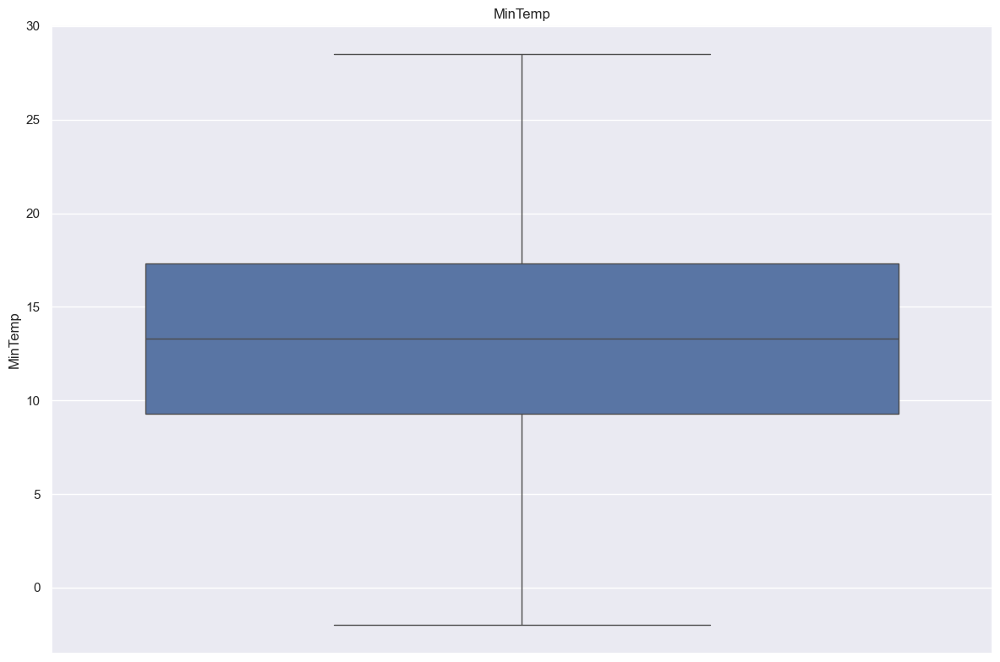

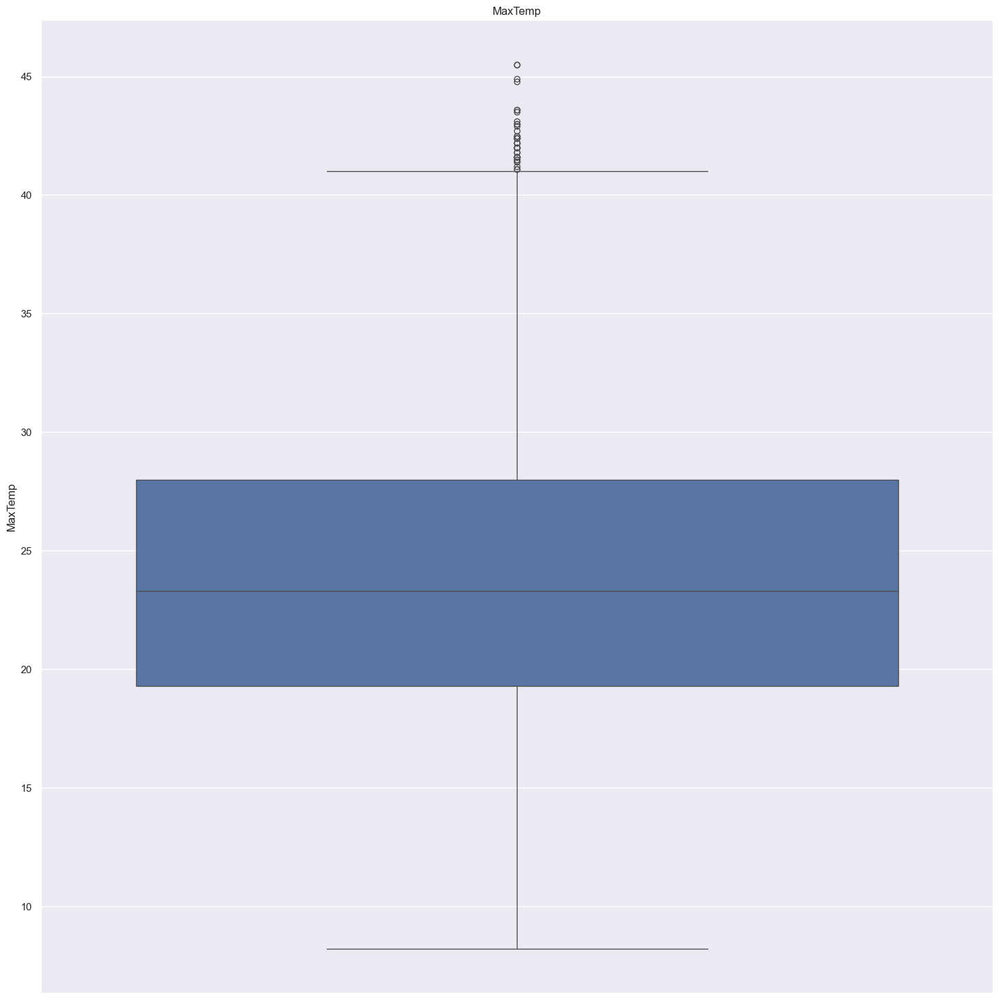

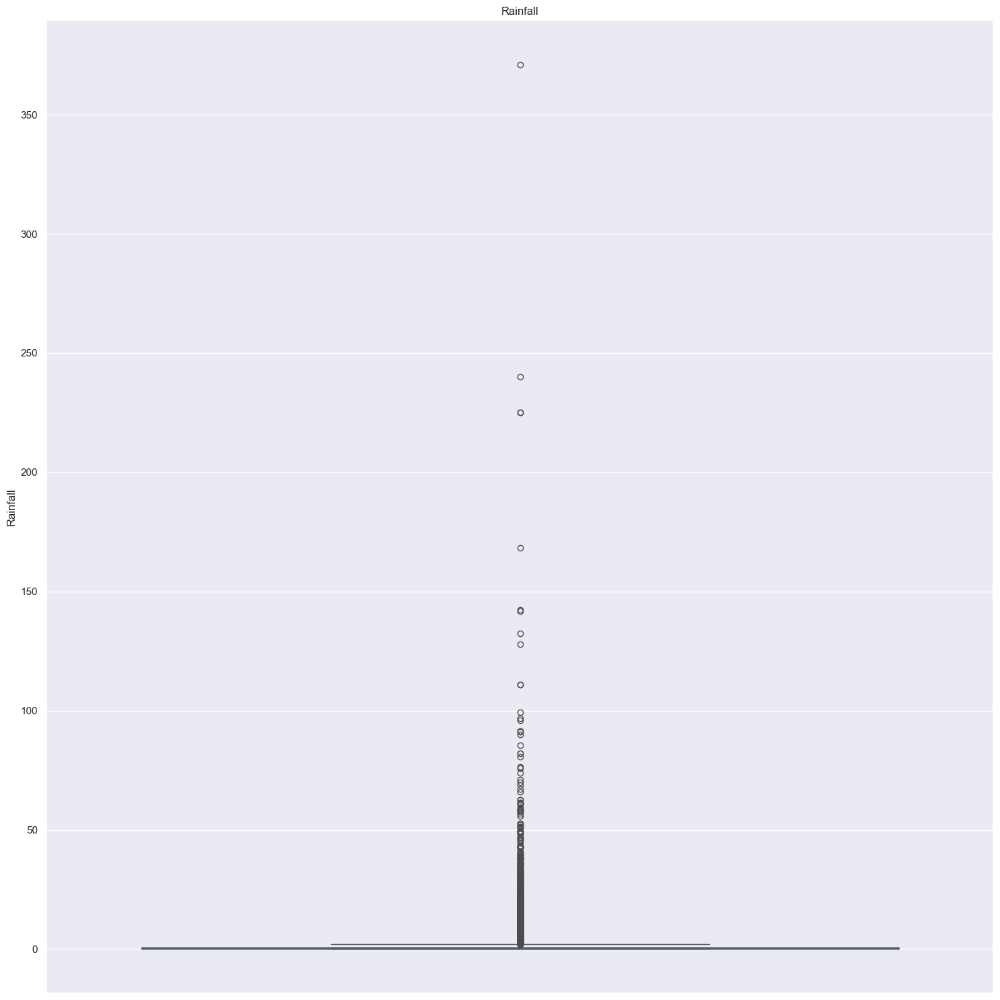

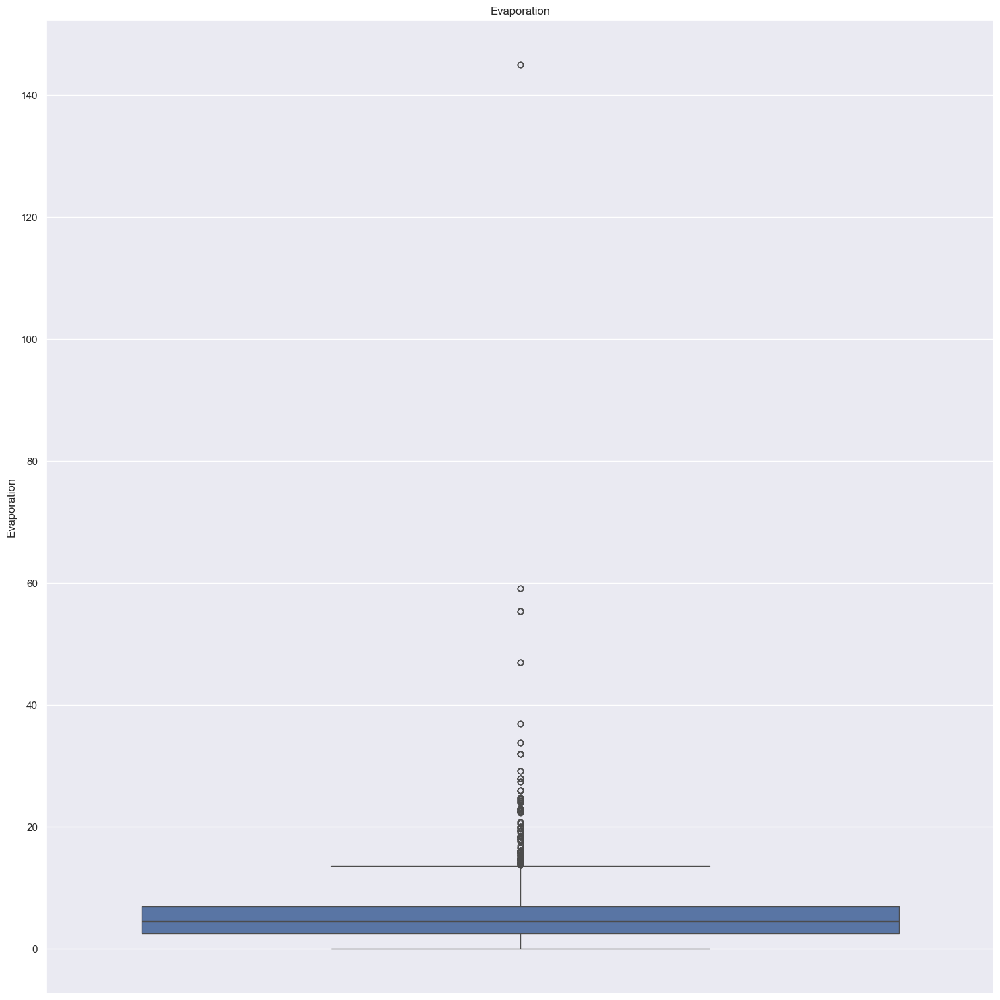

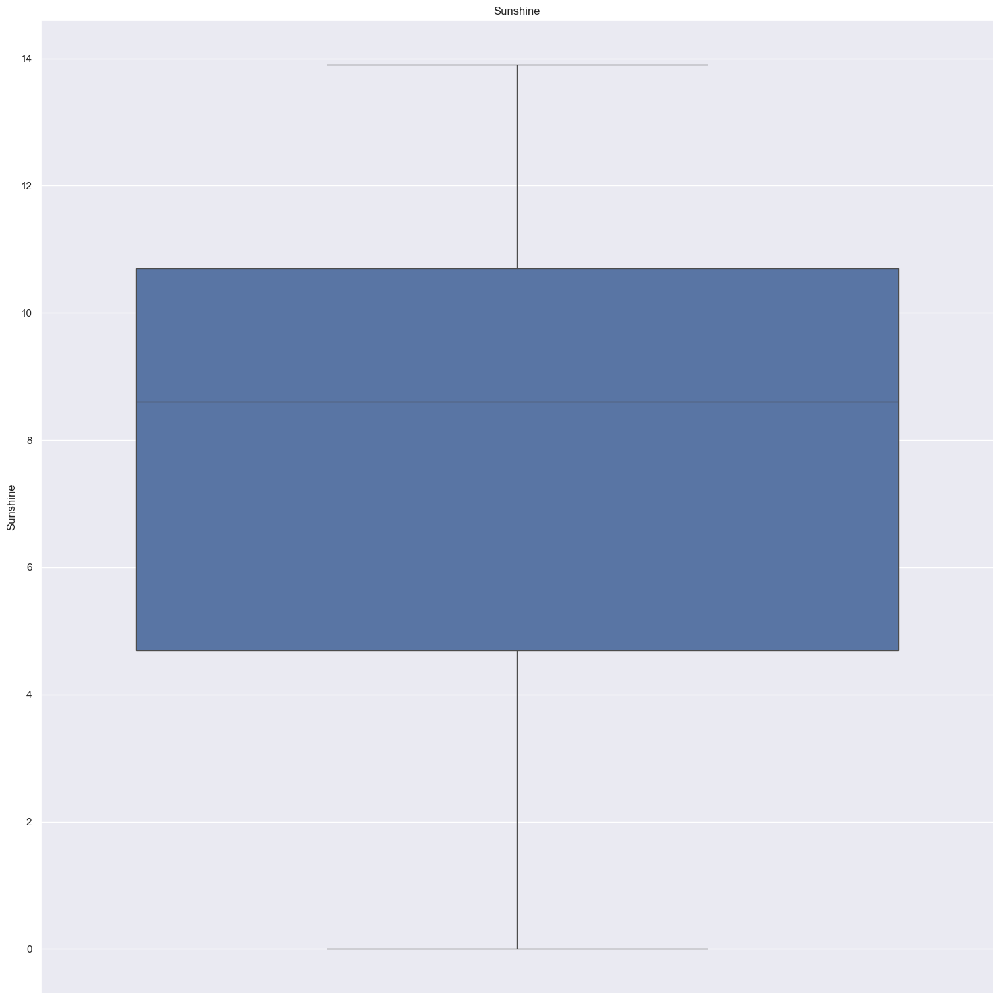

...

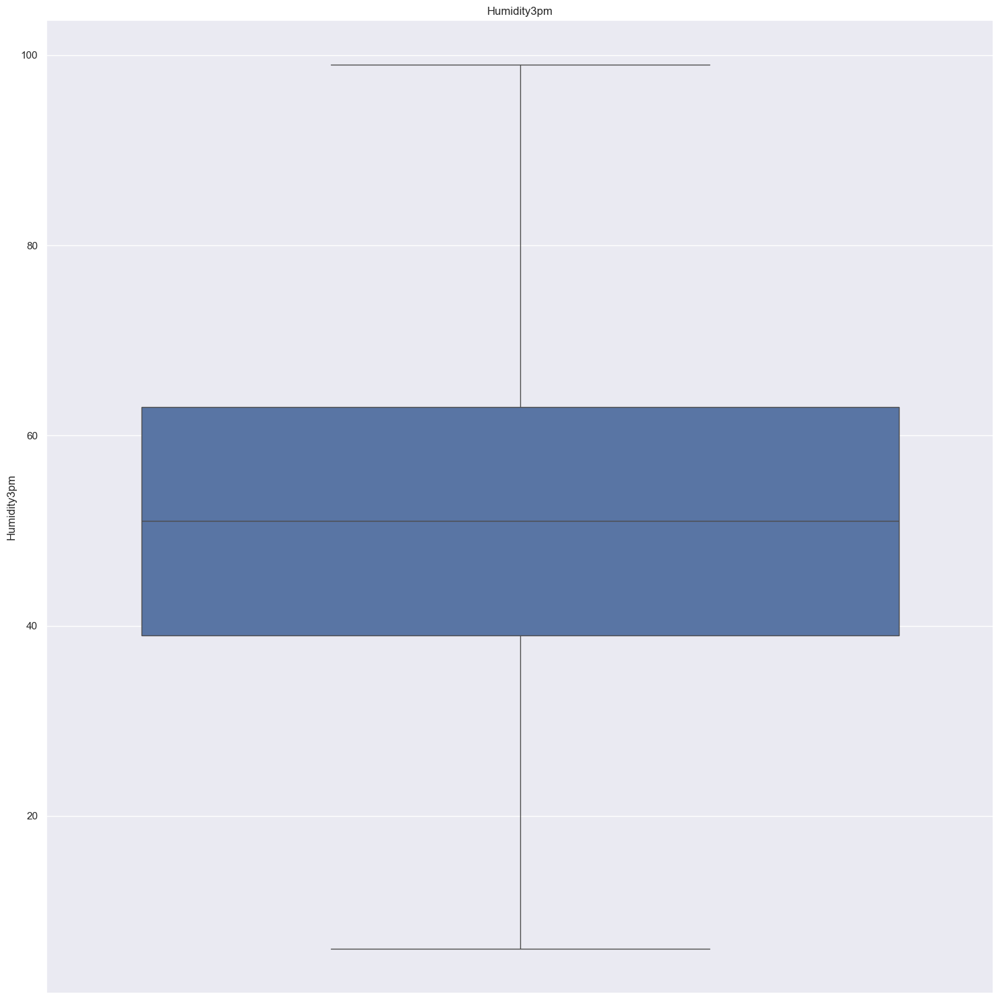

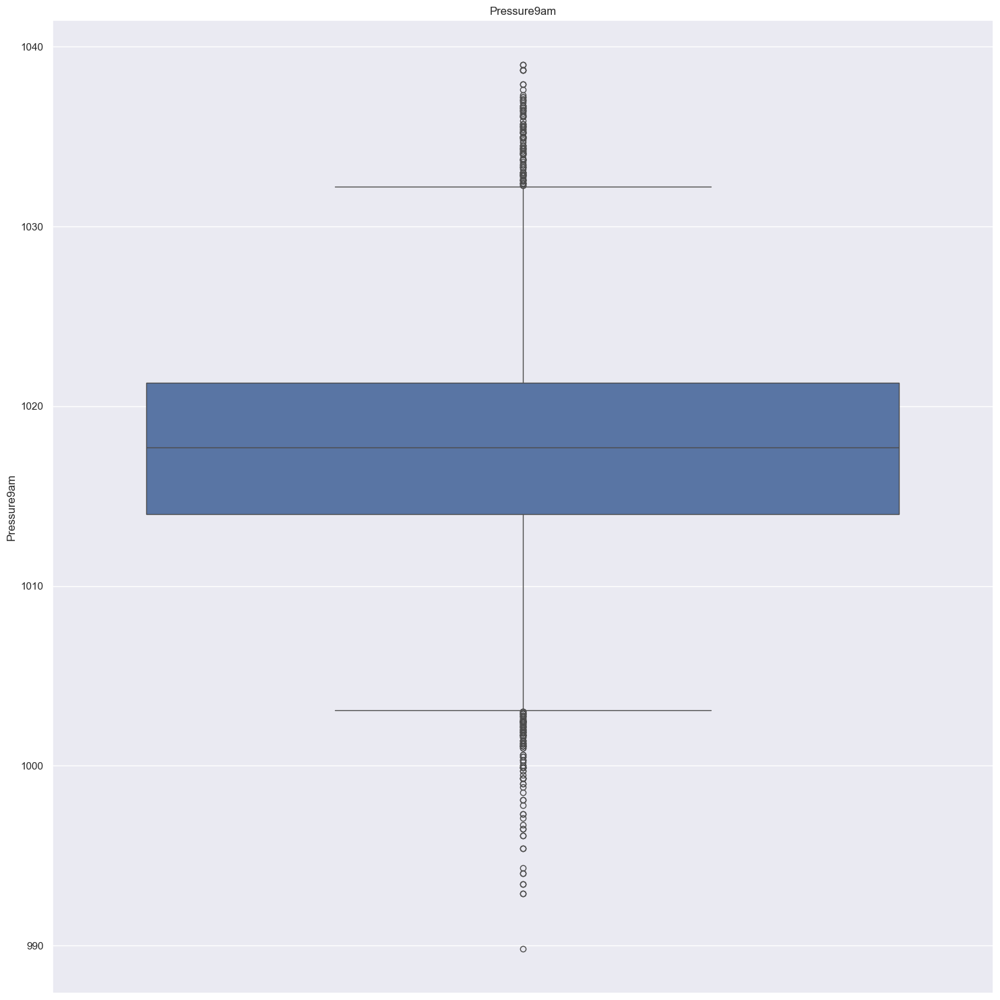

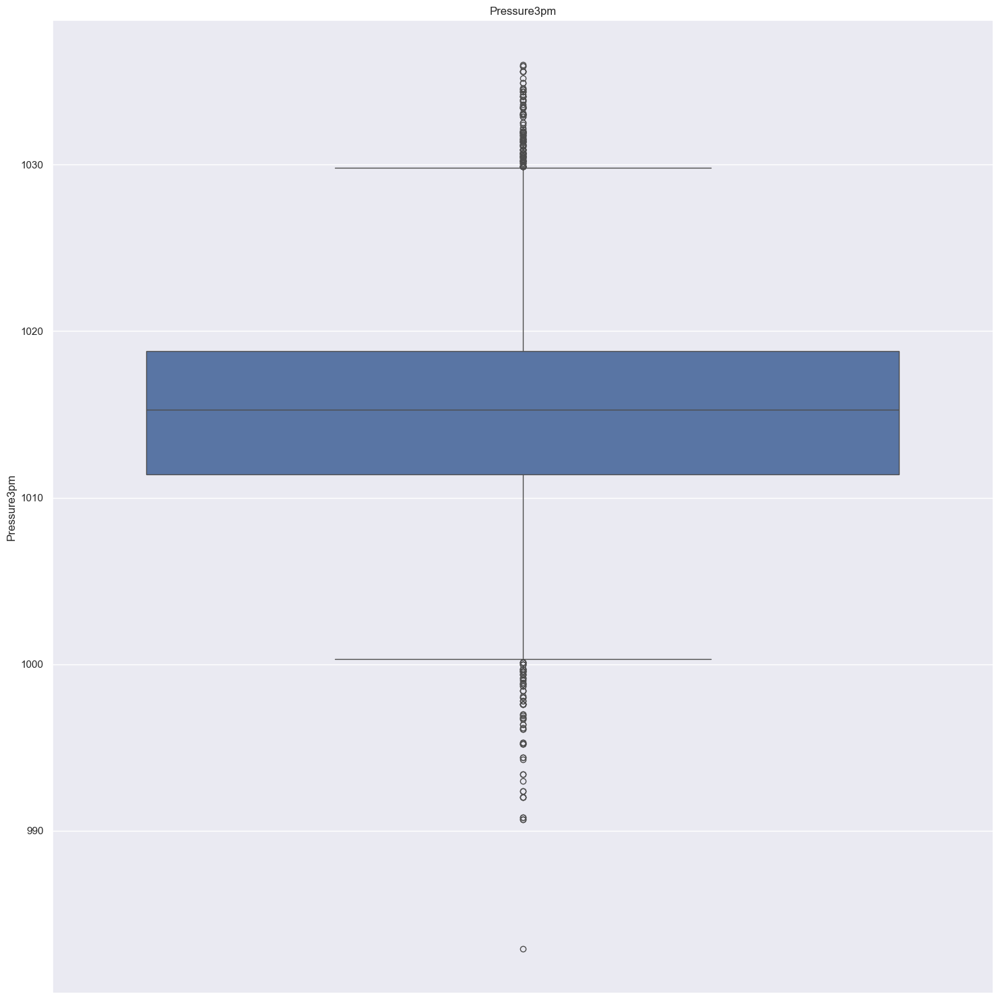

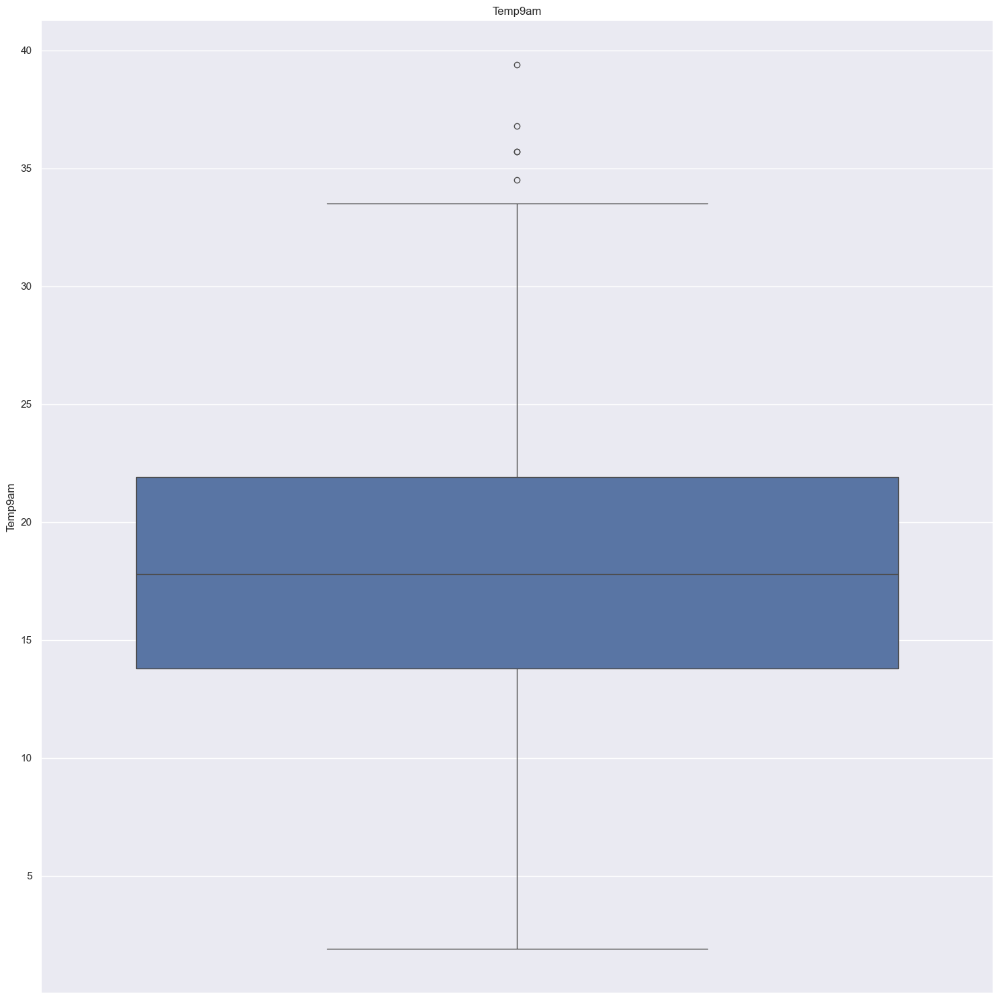

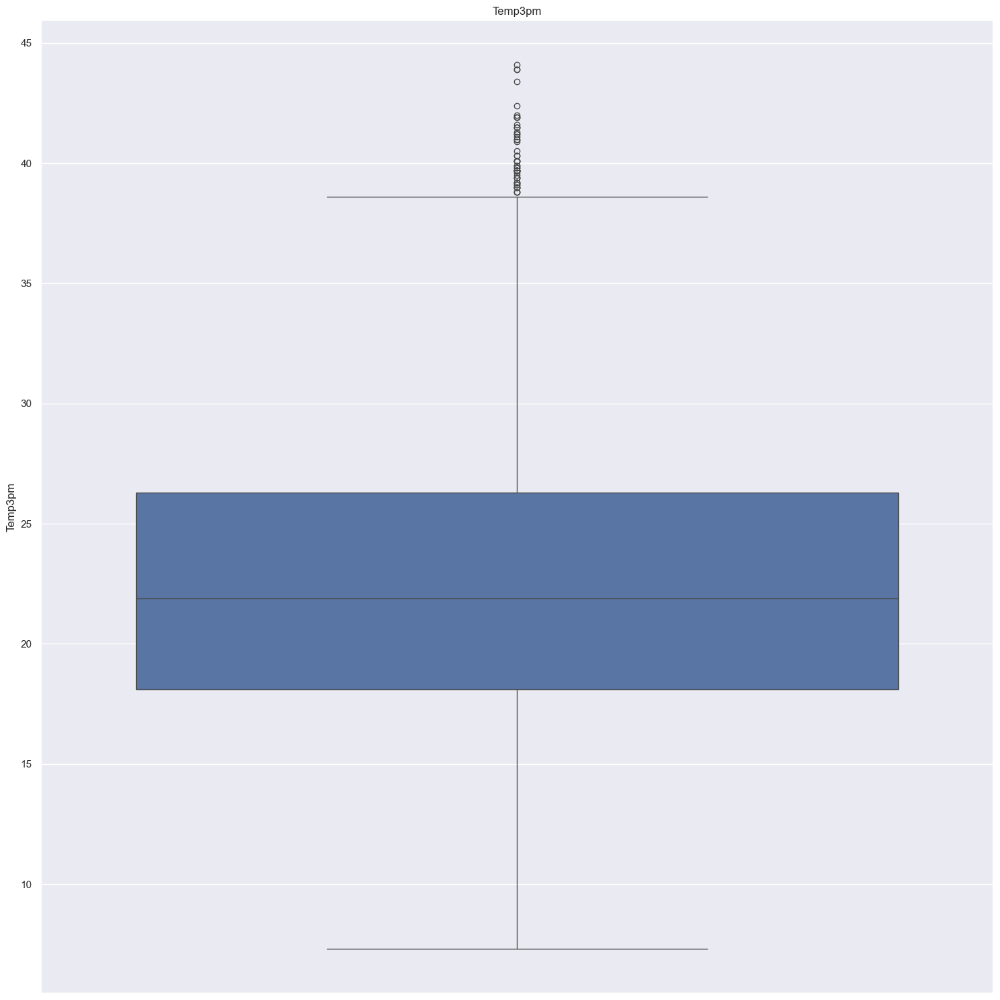

<Figure size 1500x1500 with 0 Axes>

In [121]:
for feature in continuous_feature:
    data=df.copy()
    sns.boxplot(data[feature])
    plt.title(feature)
    plt.figure(figsize=(15,15))

In [122]:
for feature in continuous_feature:
    print(feature)

MinTemp
MaxTemp
Rainfall
Evaporation
Sunshine
WindGustSpeed
WindSpeed9am
WindSpeed3pm
Humidity9am
Humidity3pm
Pressure9am
Pressure3pm
Temp9am
Temp3pm


In [123]:
IQR=df.MinTemp.quantile(0.75)-df.MinTemp.quantile(0.25)
lower_bridge=df.MinTemp.quantile(0.25)-(IQR*1.5)
upper_bridge=df.MinTemp.quantile(0.75)+(IQR*1.5)
print(lower_bridge, upper_bridge)

-2.6999999999999993 29.3


In [124]:
df.loc[df['MinTemp']>=30.45,'MinTemp']=30.45
df.loc[df['MinTemp']<=-5.95,'MinTemp']=-5.95

In [125]:
IQR=df.MaxTemp.quantile(0.75)-df.MaxTemp.quantile(0.25)
lower_bridge=df.MaxTemp.quantile(0.25)-(IQR*1.5)
upper_bridge=df.MaxTemp.quantile(0.75)+(IQR*1.5)
print(lower_bridge, upper_bridge)

6.250000000000002 41.05


In [126]:
df.loc[df['MaxTemp']>=43.5,'MaxTemp']=43.5
df.loc[df['MaxTemp']<=2.7,'MaxTemp']=2.7

In [127]:
IQR=df.Rainfall.quantile(0.75)-df.Rainfall.quantile(0.25)
lower_bridge=df.Rainfall.quantile(0.25)-(IQR*1.5)
upper_bridge=df.Rainfall.quantile(0.75)+(IQR*1.5)
print(lower_bridge, upper_bridge)

-1.2000000000000002 2.0


In [128]:
df.loc[df['Rainfall']>=1.5,'Rainfall']=1.5
df.loc[df['Rainfall']<=-0.89,'Rainfall']=-0.89

In [129]:
IQR=df.Evaporation.quantile(0.75)-df.Evaporation.quantile(0.25)
lower_bridge=df.Evaporation.quantile(0.25)-(IQR*1.5)
upper_bridge=df.Evaporation.quantile(0.75)+(IQR*1.5)
print(lower_bridge, upper_bridge)

-4.0 13.600000000000001


In [130]:
df.loc[df['Evaporation']>=14.6,'Evaporation']=14.6
df.loc[df['Evaporation']<=-4.6,'Evaporation']=-4.6

In [131]:
IQR=df.WindGustSpeed.quantile(0.75)-df.WindGustSpeed.quantile(0.25)
lower_bridge=df.WindGustSpeed.quantile(0.25)-(IQR*1.5)
upper_bridge=df.WindGustSpeed.quantile(0.75)+(IQR*1.5)
print(lower_bridge, upper_bridge)

5.5 73.5


In [132]:
df.loc[df['WindGustSpeed']>=68.5,'WindGustSpeed']=68.5
df.loc[df['WindGustSpeed']<=8.5,'WindGustSpeed']=8.5

In [133]:
IQR=df.WindSpeed9am.quantile(0.75)-df.WindSpeed9am.quantile(0.25)
lower_bridge=df.WindSpeed9am.quantile(0.25)-(IQR*1.5)
upper_bridge=df.WindSpeed9am.quantile(0.75)+(IQR*1.5)
print(lower_bridge, upper_bridge)

-15.0 41.0


In [134]:
df.loc[df['WindSpeed9am']>=37,'WindSpeed9am']=37
df.loc[df['WindSpeed9am']<=-11,'WindSpeed9am']=-11

In [135]:
IQR=df.WindSpeed3pm.quantile(0.75)-df.WindSpeed3pm.quantile(0.25)
lower_bridge=df.WindSpeed3pm.quantile(0.25)-(IQR*1.5)
upper_bridge=df.WindSpeed3pm.quantile(0.75)+(IQR*1.5)
print(lower_bridge, upper_bridge)

-8.5 43.5


In [136]:
df.loc[df['WindSpeed3pm']>40.5,'WindSpeed3pm']=40.5
df.loc[df['WindSpeed3pm']<=-3.5,'WindSpeed3pm']=-3.5

In [137]:
IQR=df.Humidity9am.quantile(0.75)-df.Humidity9am.quantile(0.25)
lower_bridge=df.Humidity9am.quantile(0.25)-(IQR*1.5)
upper_bridge=df.Humidity9am.quantile(0.75)+(IQR*1.5)
print(lower_bridge, upper_bridge)

20.0 116.0


In [138]:
df.loc[df['Humidity9am']>=122,'Humidity9am']=122
df.loc[df['Humidity9am']<=18,'Humidity9am']=18

In [139]:
IQR=df.Pressure9am.quantile(0.75)-df.Pressure9am.quantile(0.25)
lower_bridge=df.Pressure9am.quantile(0.25)-(IQR*1.5)
upper_bridge=df.Pressure9am.quantile(0.75)+(IQR*1.5)
print(lower_bridge, upper_bridge)

1003.0500000000001 1032.25


In [140]:
df.loc[df['Pressure9am']>=1034.25,'Pressure9am']=1034.25
df.loc[df['Pressure9am']<=1001.05,'Pressure9am']=1001.05

In [141]:
IQR=df.Pressure3pm.quantile(0.75)-df.Pressure3pm.quantile(0.25)
lower_bridge=df.Pressure3pm.quantile(0.25)-(IQR*1.5)
upper_bridge=df.Pressure3pm.quantile(0.75)+(IQR*1.5)
print(lower_bridge, upper_bridge)

1000.3 1029.8999999999999


In [142]:
df.loc[df['Pressure3pm']>=1031.85,'Pressure3pm']=1031.85
df.loc[df['Pressure3pm']<=998.65,'Pressure3pm']=998.65

In [143]:
IQR=df.Temp9am.quantile(0.75)-df.Temp9am.quantile(0.25)
lower_bridge=df.Temp9am.quantile(0.25)-(IQR*1.5)
upper_bridge=df.Temp9am.quantile(0.75)+(IQR*1.5)
print(lower_bridge, upper_bridge)

1.650000000000004 34.05


In [144]:
df.loc[df['Temp9am']>=35.3,'Temp9am']=35.3
df.loc[df['Temp9am']<=-1.49,'Temp9am']=-1.49

In [145]:
IQR=df.Temp3pm.quantile(0.75)-df.Temp3pm.quantile(0.25)
lower_bridge=df.Temp3pm.quantile(0.25)-(IQR*1.5)
upper_bridge=df.Temp3pm.quantile(0.75)+(IQR*1.5)
print(lower_bridge, upper_bridge)

5.8000000000000025 38.6


In [146]:
df.loc[df['Temp3pm']>=40.45,'Temp3pm']=40.45
df.loc[df['Temp3pm']<=2.45,'Temp3pm']=2.45

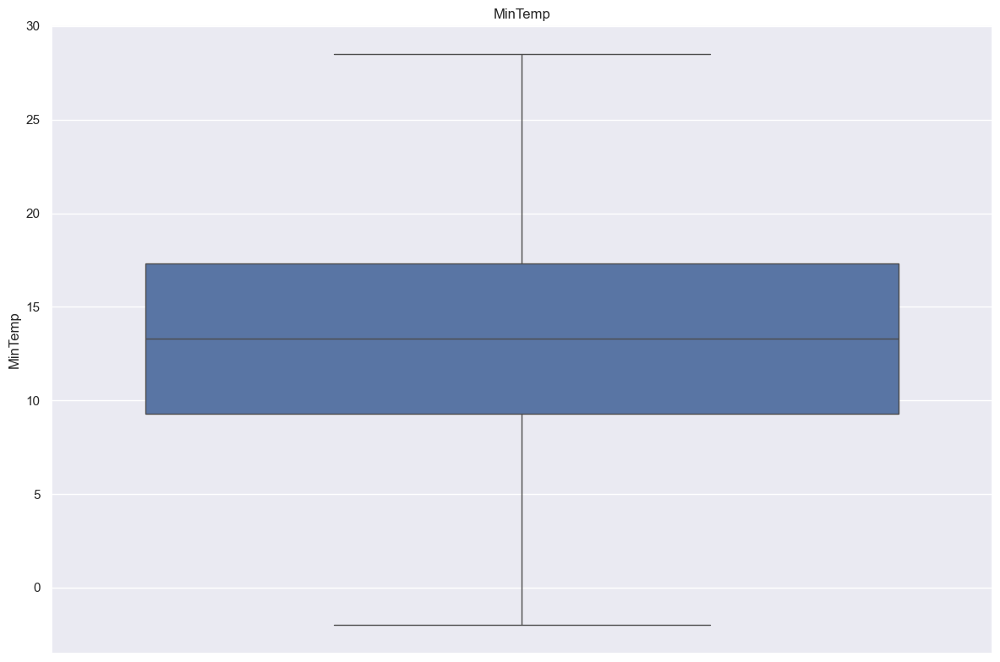

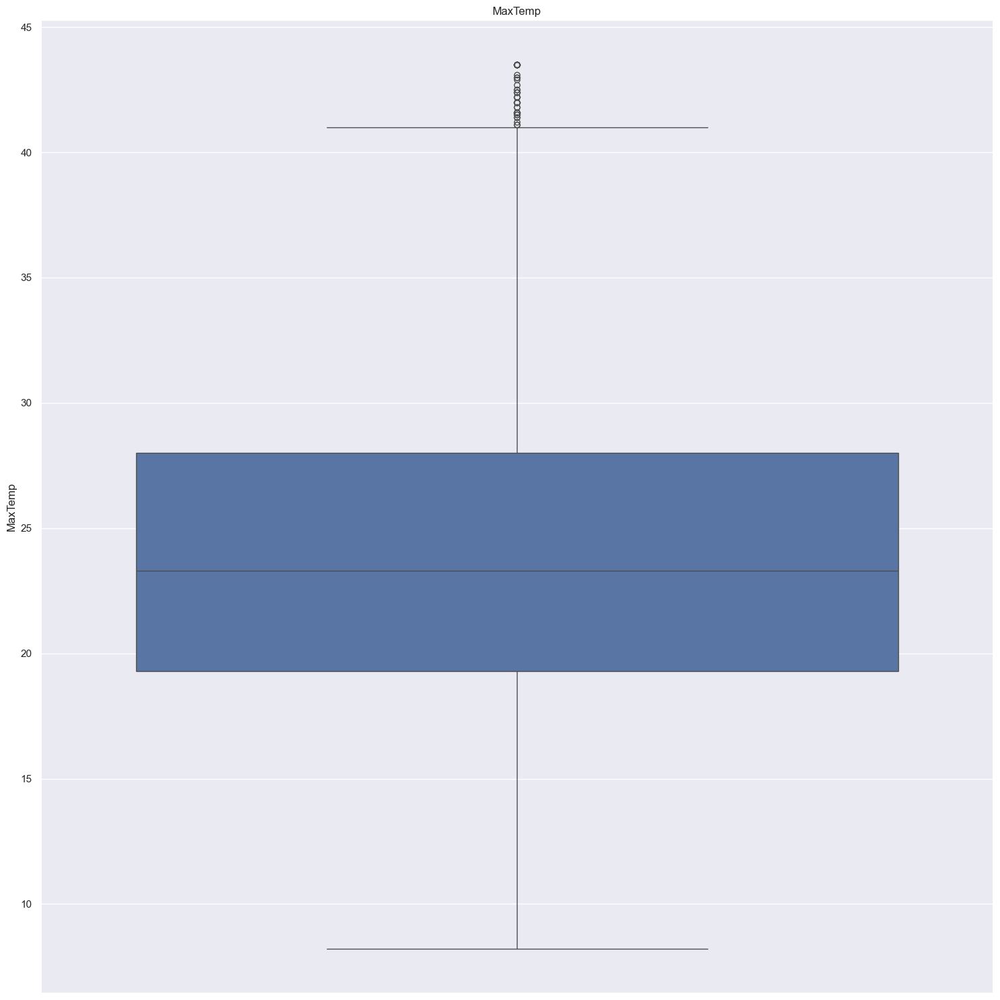

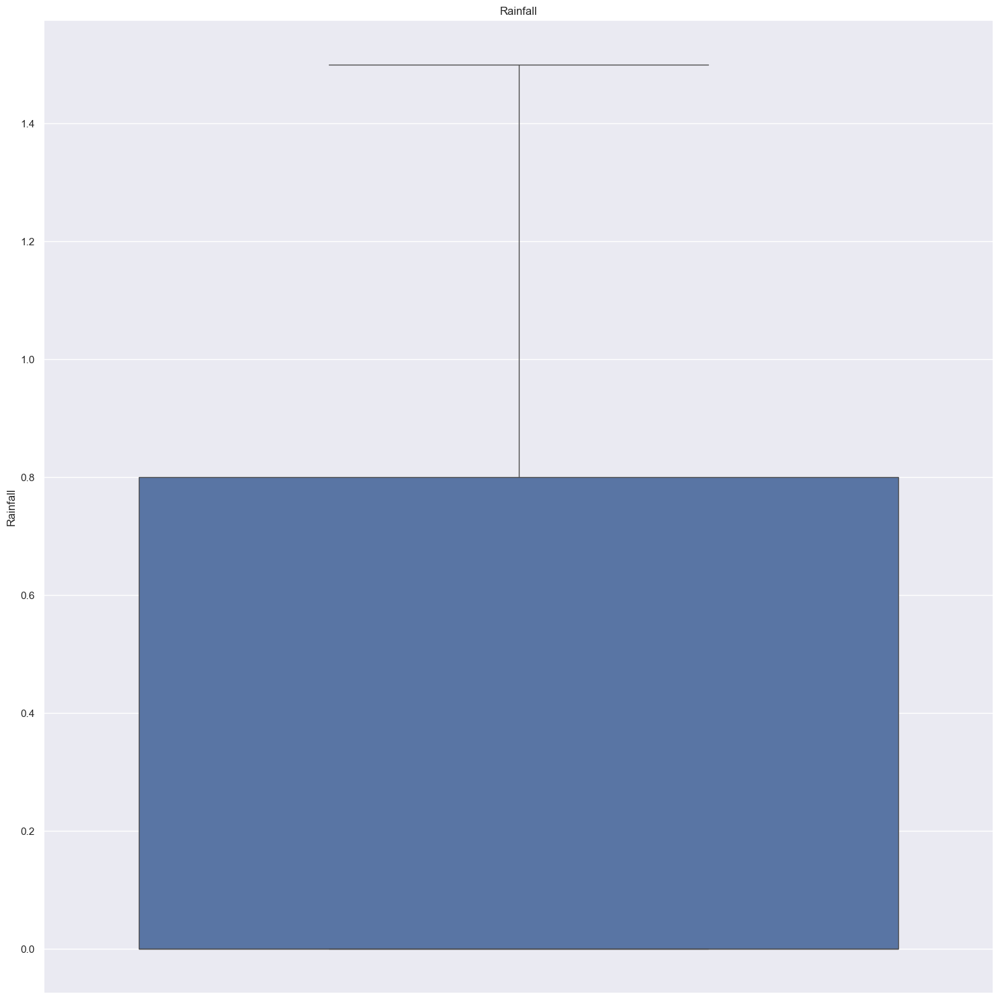

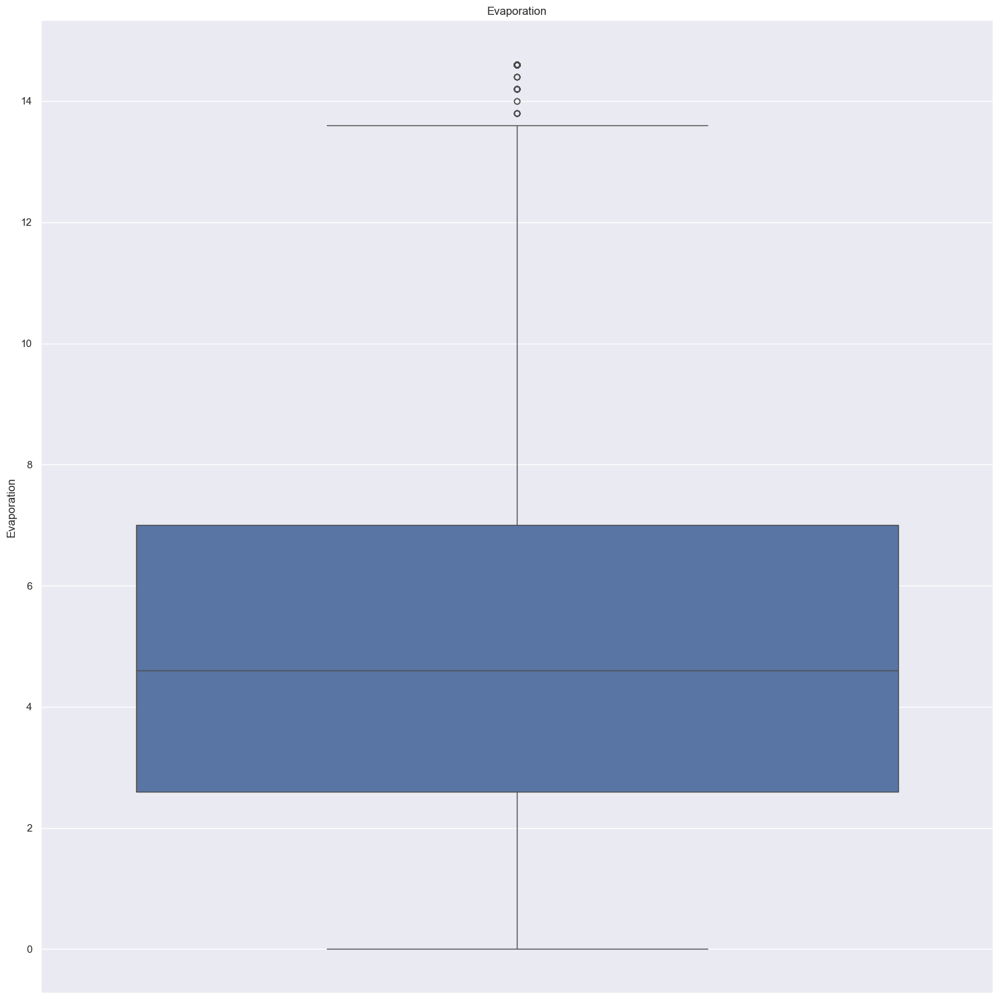

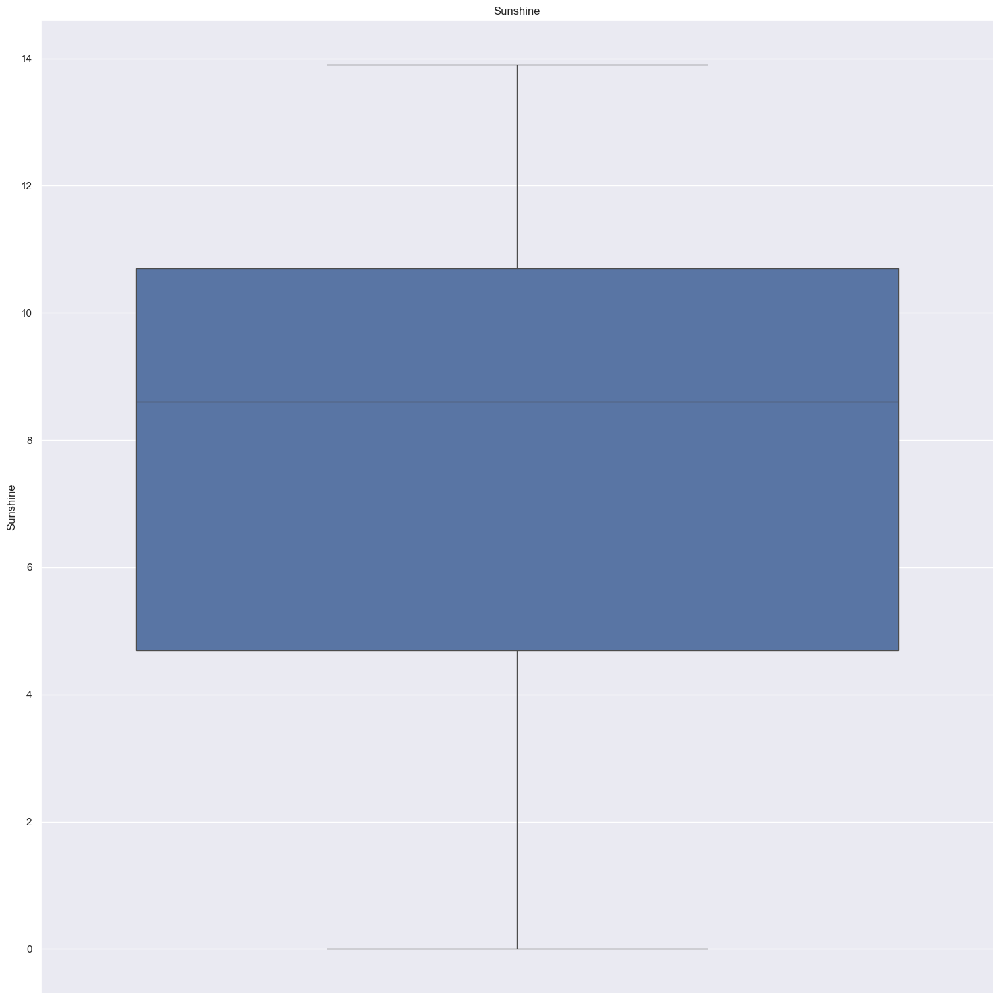

...

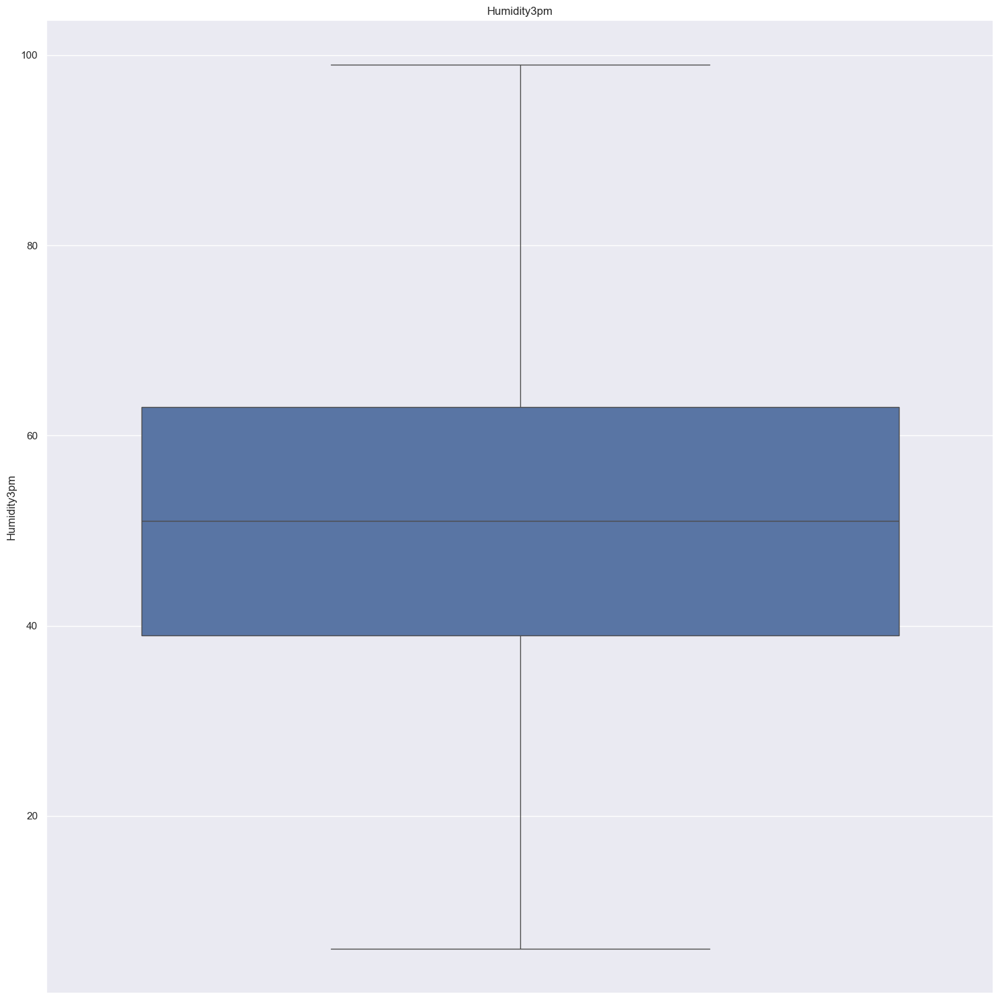

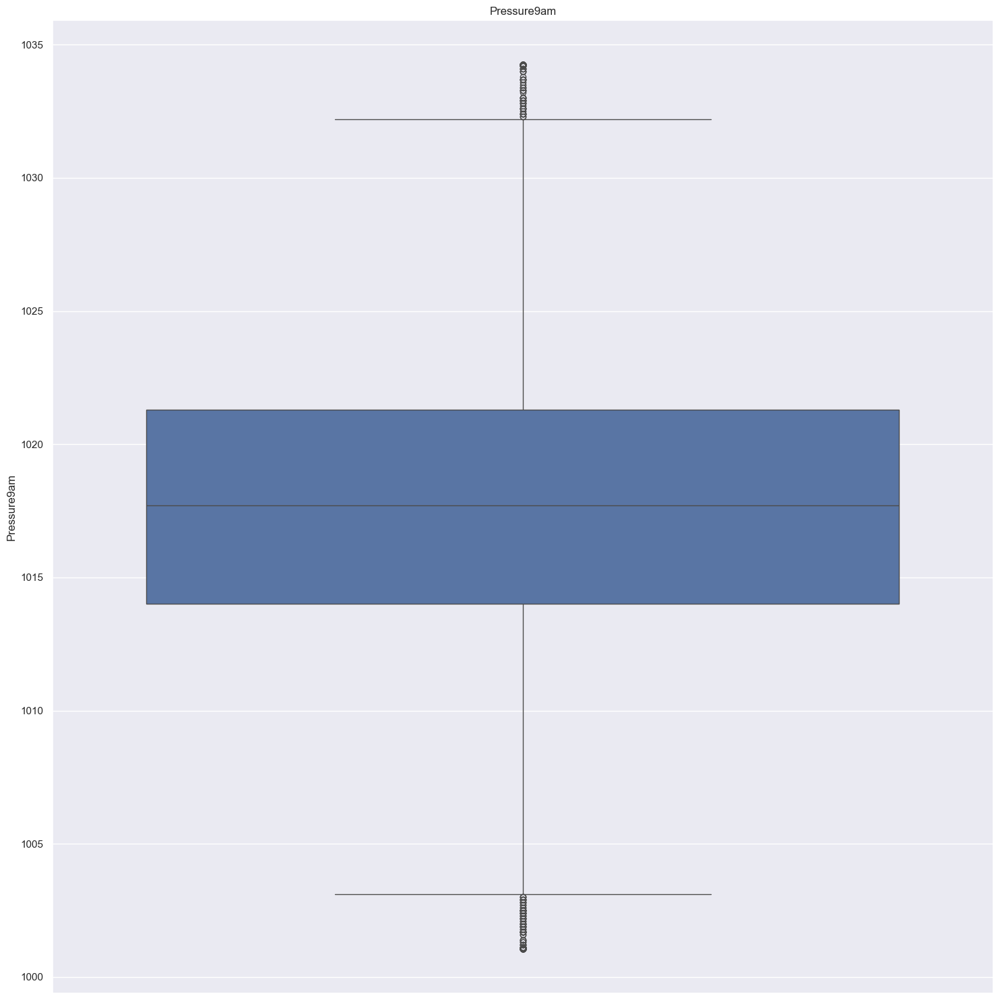

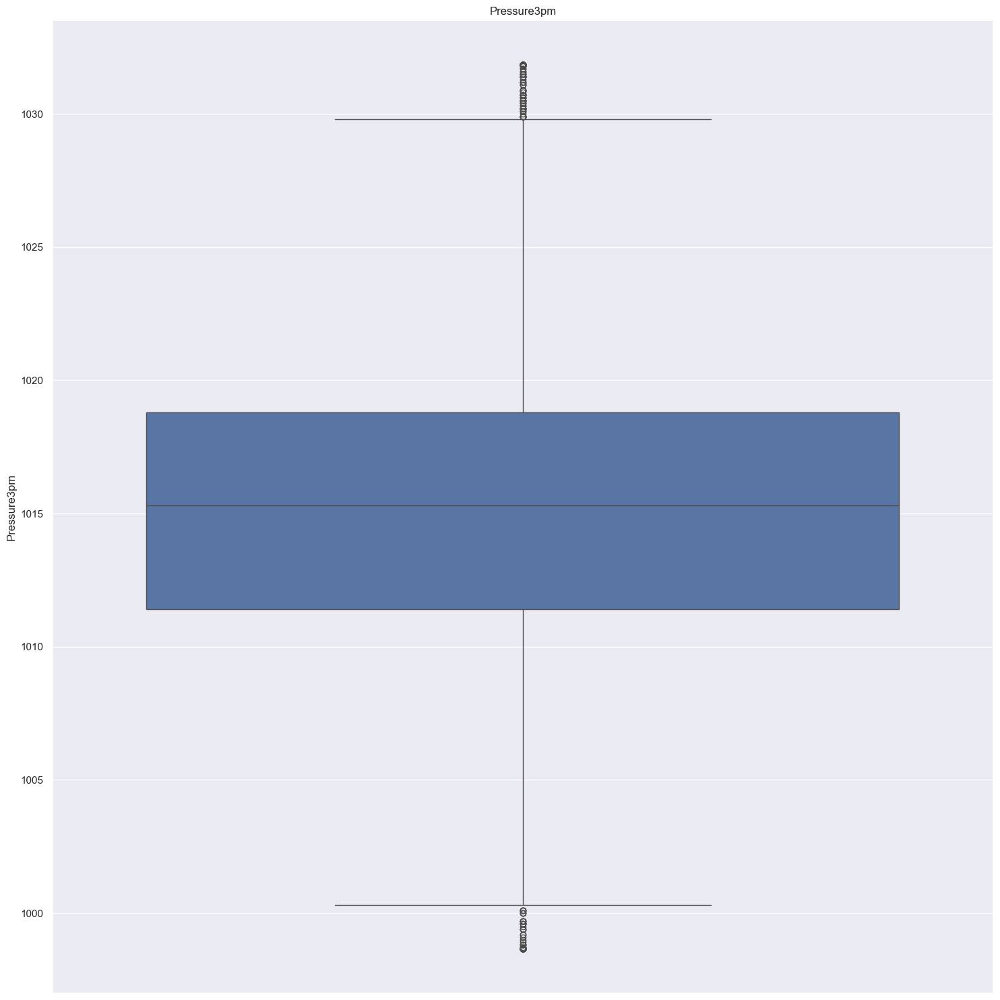

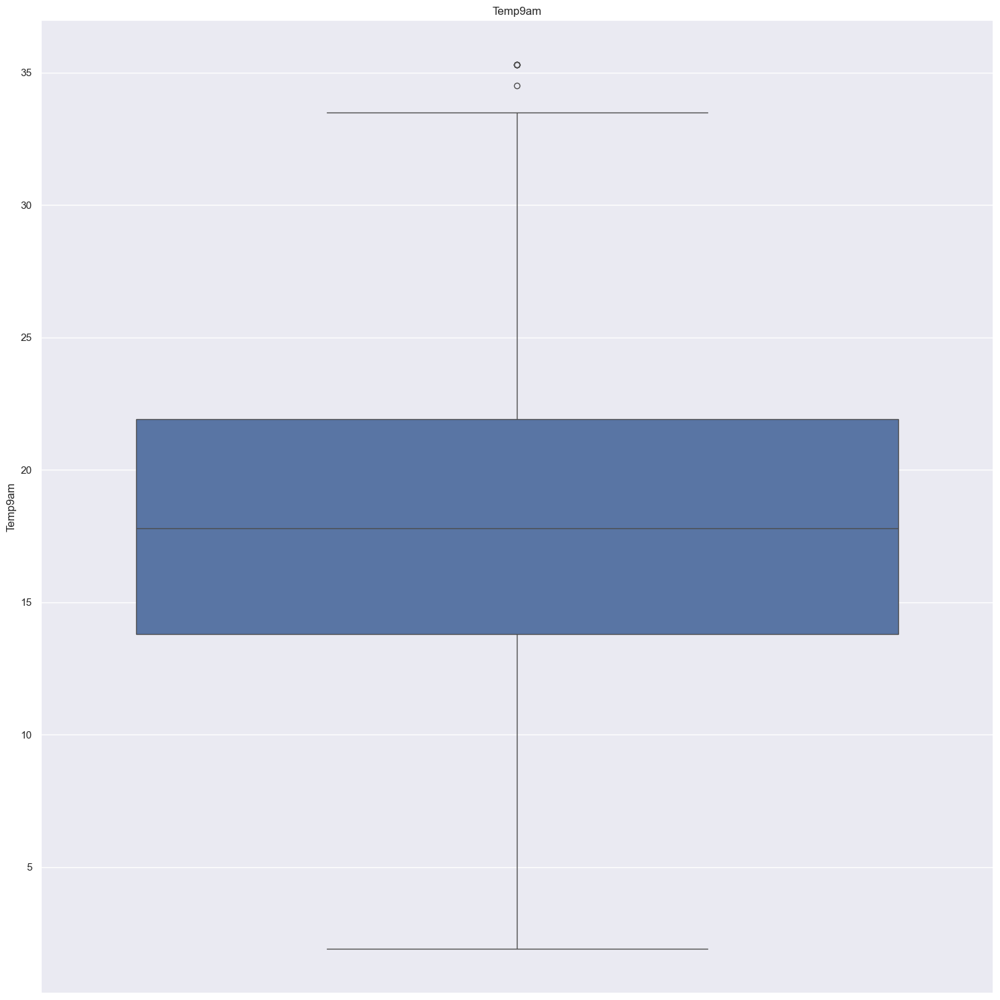

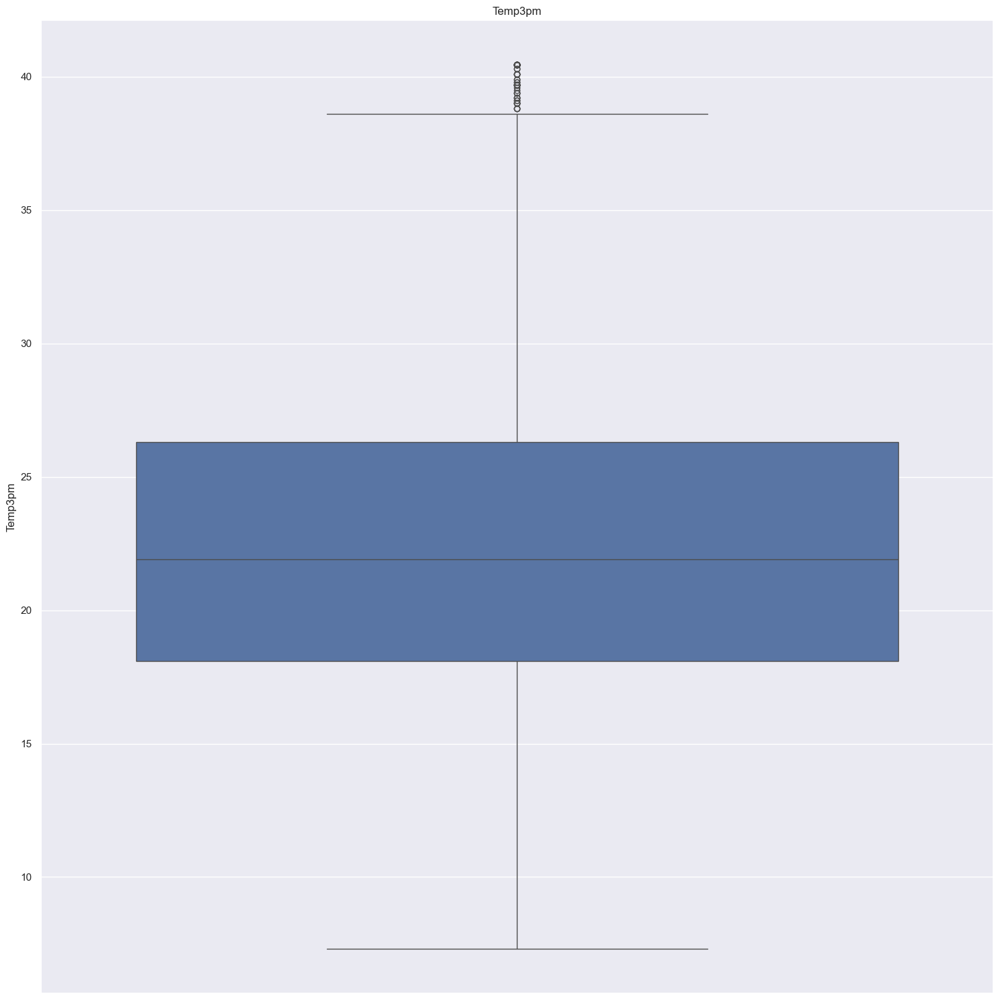

<Figure size 1500x1500 with 0 Axes>

In [147]:
for feature in continuous_feature:
    data=df.copy()
    sns.boxplot(data[feature])
    plt.title(feature)
    plt.figure(figsize=(15,15))

In [148]:
def qq_plots(df, variable):
    plt.figure(figsize=(15,6))
    plt.subplot(1, 2, 1)
    df[variable].hist()
    plt.subplot(1, 2, 2)
    stats.probplot(df[variable], dist="norm", plot=plt)
    plt.show()

MinTemp


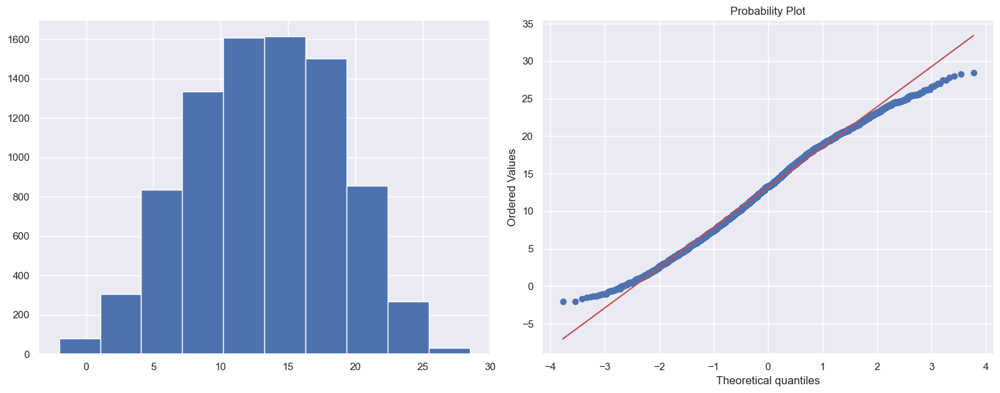

MaxTemp


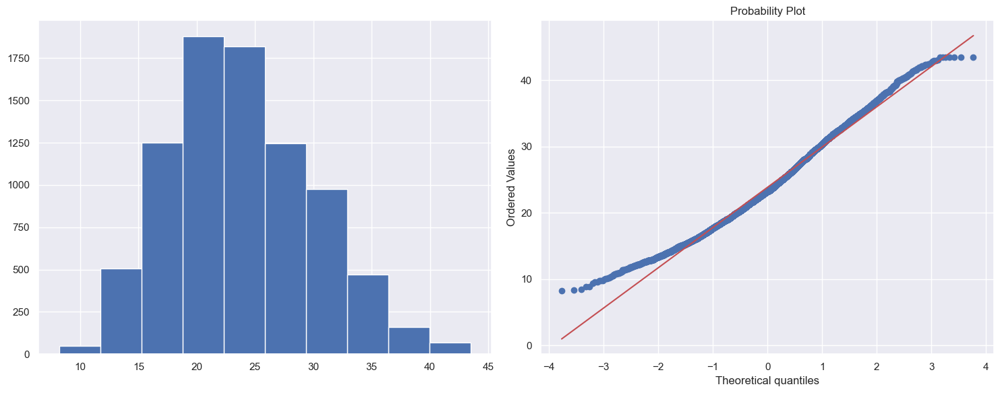

Rainfall


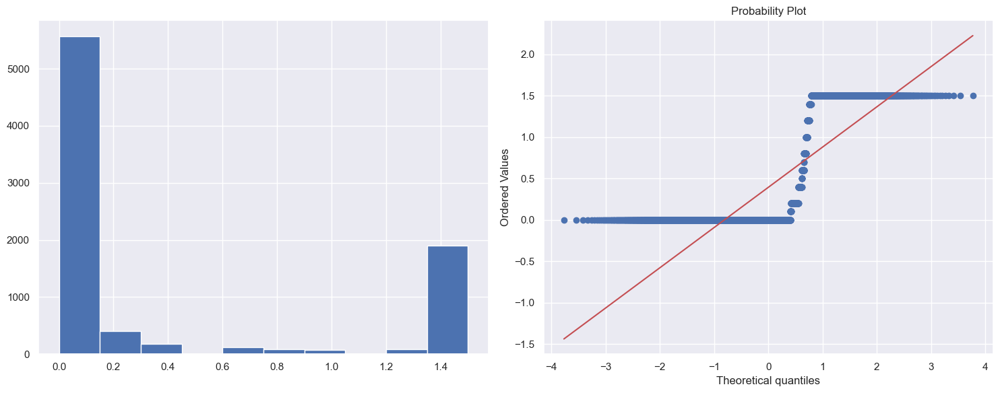

Evaporation


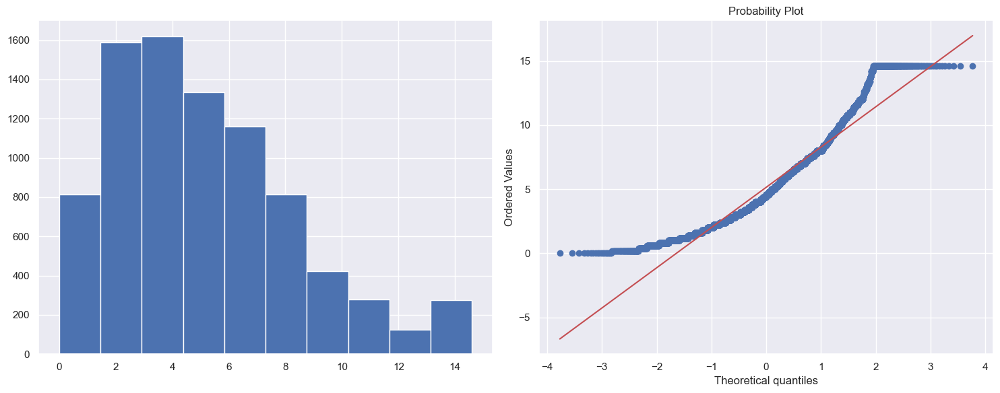

Sunshine


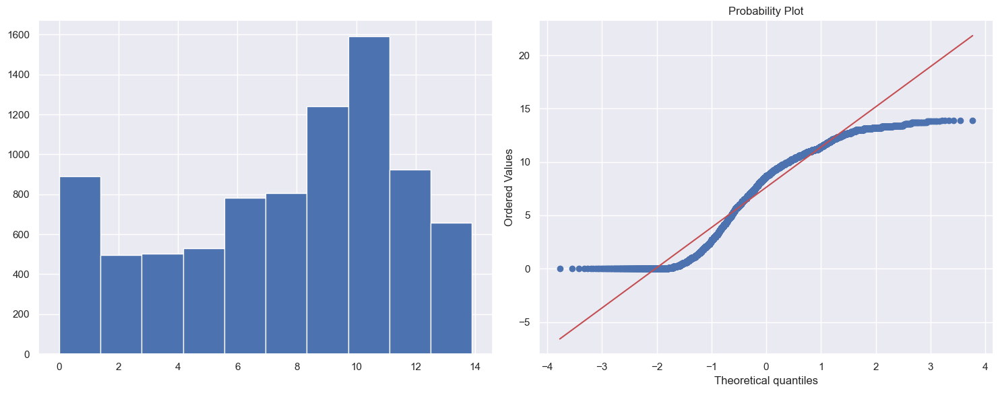

WindGustSpeed


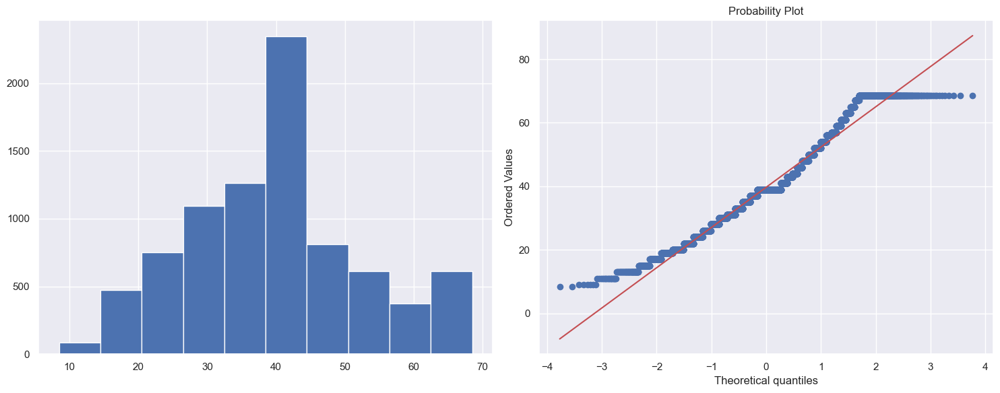

WindSpeed9am


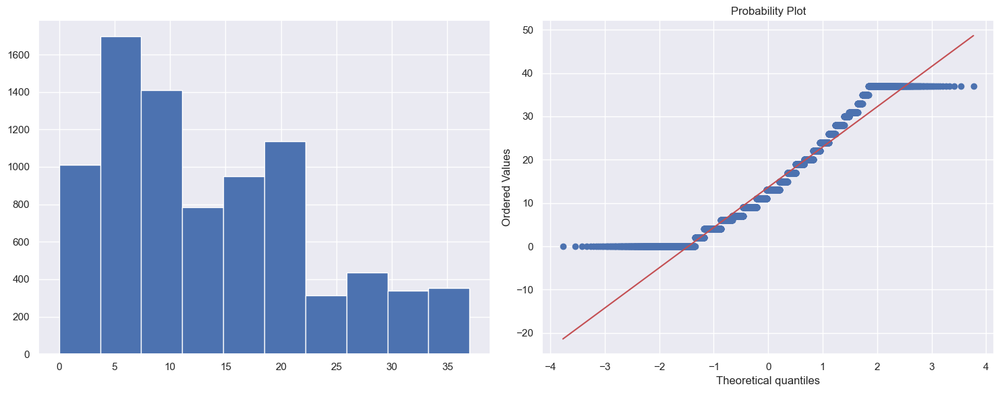

WindSpeed3pm


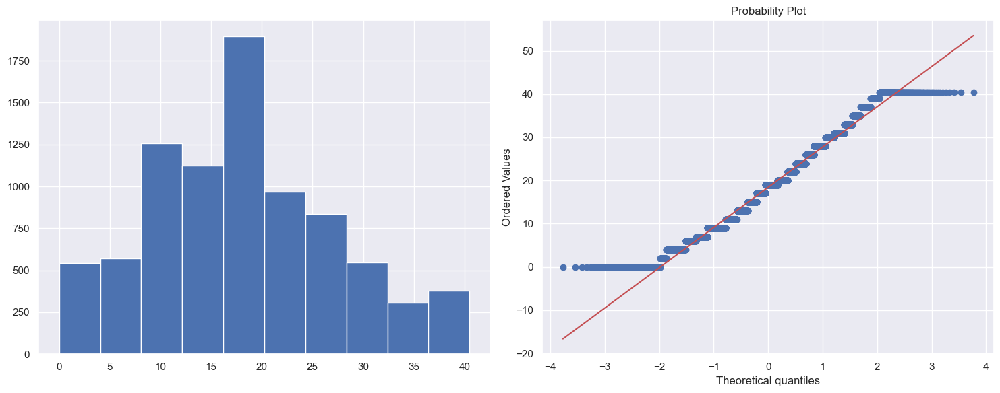

Humidity9am


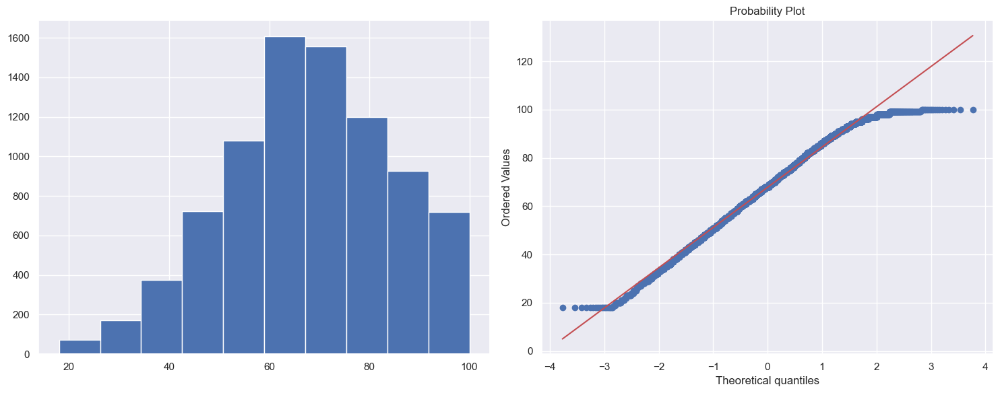

Humidity3pm


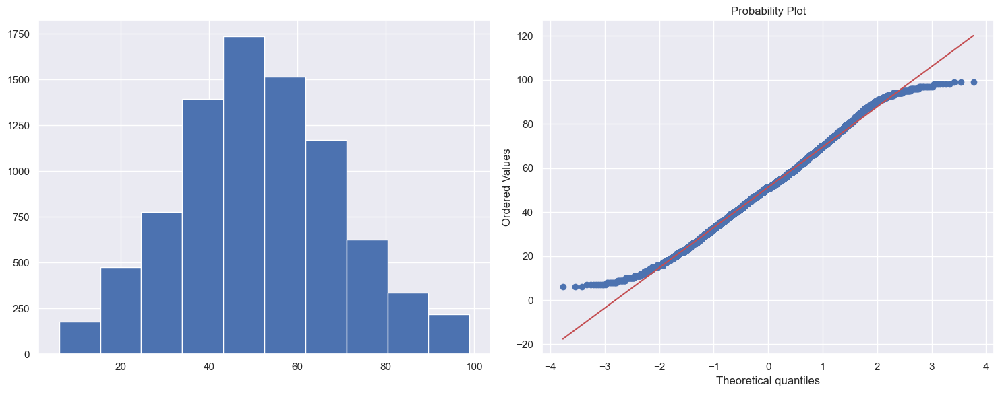

Pressure9am


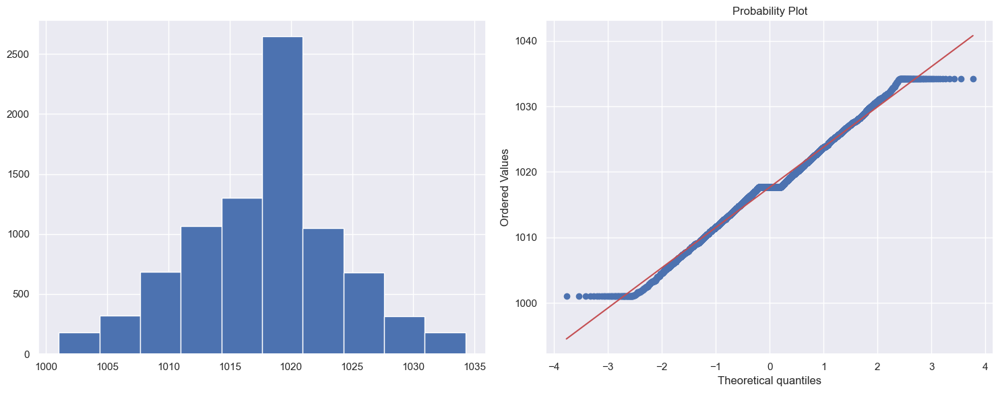

Pressure3pm


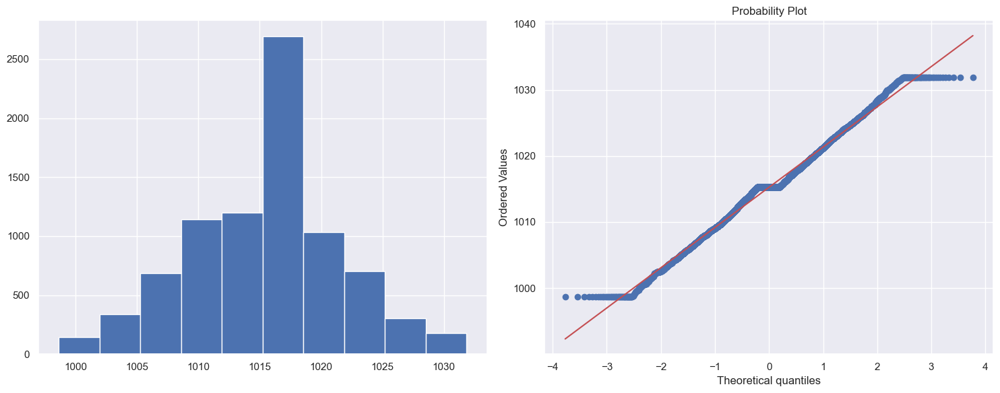

Temp9am


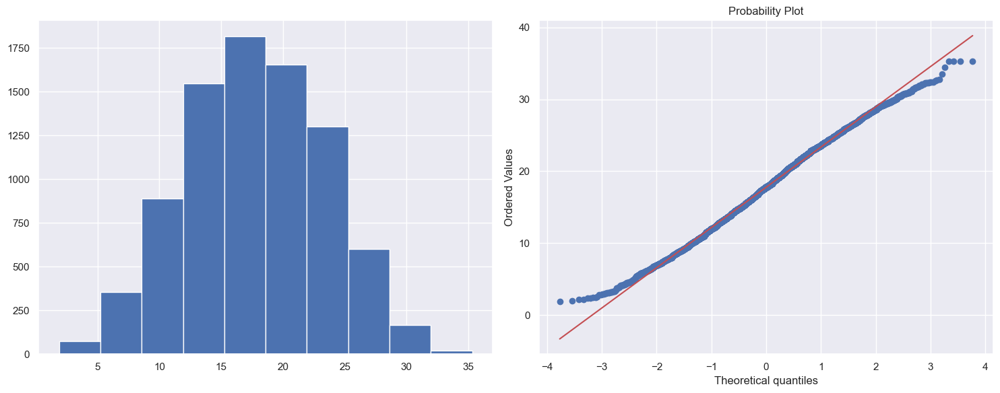

Temp3pm


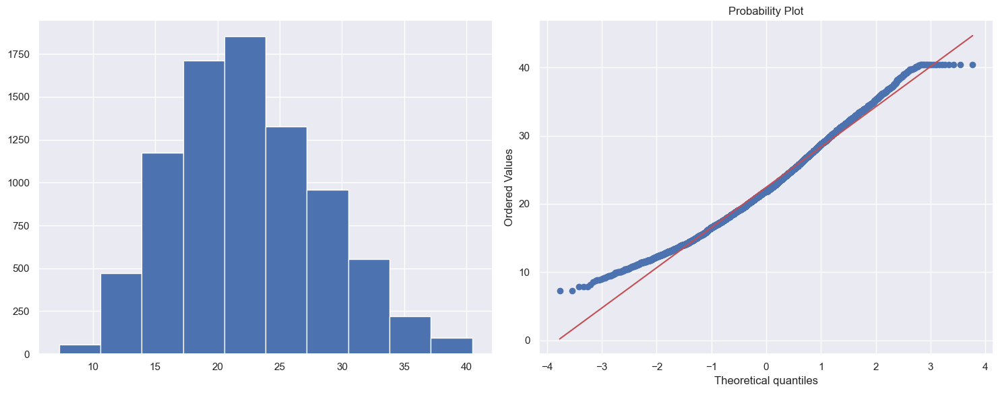

In [149]:
for feature in continuous_feature:
    print(feature)
    plt.figure(figsize=(15,6))
    plt.subplot(1, 2, 1)
    df[feature].hist()
    plt.subplot(1, 2, 2)
    stats.probplot(df[feature], dist="norm", plot=plt)
    plt.show()

In [150]:
df.to_csv("preprocessed_1.csv", index=False)

In [151]:
X = df.drop(["RainTomorrow", "Date"], axis=1)
Y = df["RainTomorrow"]

In [152]:
X_train, X_test, y_train, y_test = train_test_split(X,Y, test_size =0.2, stratify = Y, random_state = 0)

In [153]:
y_train

5490    False
5525    False
95      False
7404    False
6844    False
        ...  
8222    False
8169    False
2784    False
7922    False
4262    False
Name: RainTomorrow, Length: 6740, dtype: bool

In [154]:
imputer = SimpleImputer(strategy='mean')
X_train_imputed = imputer.fit_transform(X_train)

# Apply SMOTE
sm = SMOTE(random_state=0)
X_train_res, y_train_res = sm.fit_resample(X_train_imputed, y_train)

# Output class distributions
print("The number of classes before fit {}".format(Counter(y_train)))
print("The number of classes after fit {}".format(Counter(y_train_res)))

The number of classes before fit Counter({False: 5147, True: 1593})
The number of classes after fit Counter({False: 5147, True: 5147})


In [155]:
cat = CatBoostClassifier(iterations=2000, eval_metric = "AUC")
cat.fit(X_train_res, y_train_res)

Learning rate set to 0.014766
0:	total: 7.86ms	remaining: 15.7s
1:	total: 15.6ms	remaining: 15.5s
2:	total: 23.2ms	remaining: 15.5s
3:	total: 30.9ms	remaining: 15.4s
4:	total: 38.9ms	remaining: 15.5s
5:	total: 46.7ms	remaining: 15.5s
6:	total: 54.9ms	remaining: 15.6s
7:	total: 63ms	remaining: 15.7s
8:	total: 70.1ms	remaining: 15.5s
9:	total: 77.6ms	remaining: 15.4s
10:	total: 84ms	remaining: 15.2s
11:	total: 91.5ms	remaining: 15.2s
12:	total: 98.4ms	remaining: 15s
13:	total: 106ms	remaining: 15s
14:	total: 112ms	remaining: 14.9s
15:	total: 119ms	remaining: 14.7s
16:	total: 126ms	remaining: 14.7s
17:	total: 133ms	remaining: 14.6s
18:	total: 140ms	remaining: 14.5s
19:	total: 147ms	remaining: 14.5s
20:	total: 154ms	remaining: 14.5s
21:	total: 160ms	remaining: 14.4s
22:	total: 167ms	remaining: 14.4s
23:	total: 175ms	remaining: 14.4s
24:	total: 182ms	remaining: 14.3s
25:	total: 189ms	remaining: 14.4s
26:	total: 195ms	remaining: 14.3s
27:	total: 202ms	remaining: 14.2s
28:	total: 209ms	remain

In [156]:
y_pred = cat.predict(X_test)
print(confusion_matrix(y_test,y_pred))
print(accuracy_score(y_test,y_pred))
print(classification_report(y_test,y_pred))

[[1218   69]
 [ 154  244]]
0.8676557863501484
              precision    recall  f1-score   support

       False       0.89      0.95      0.92      1287
        True       0.78      0.61      0.69       398

    accuracy                           0.87      1685
   macro avg       0.83      0.78      0.80      1685
weighted avg       0.86      0.87      0.86      1685



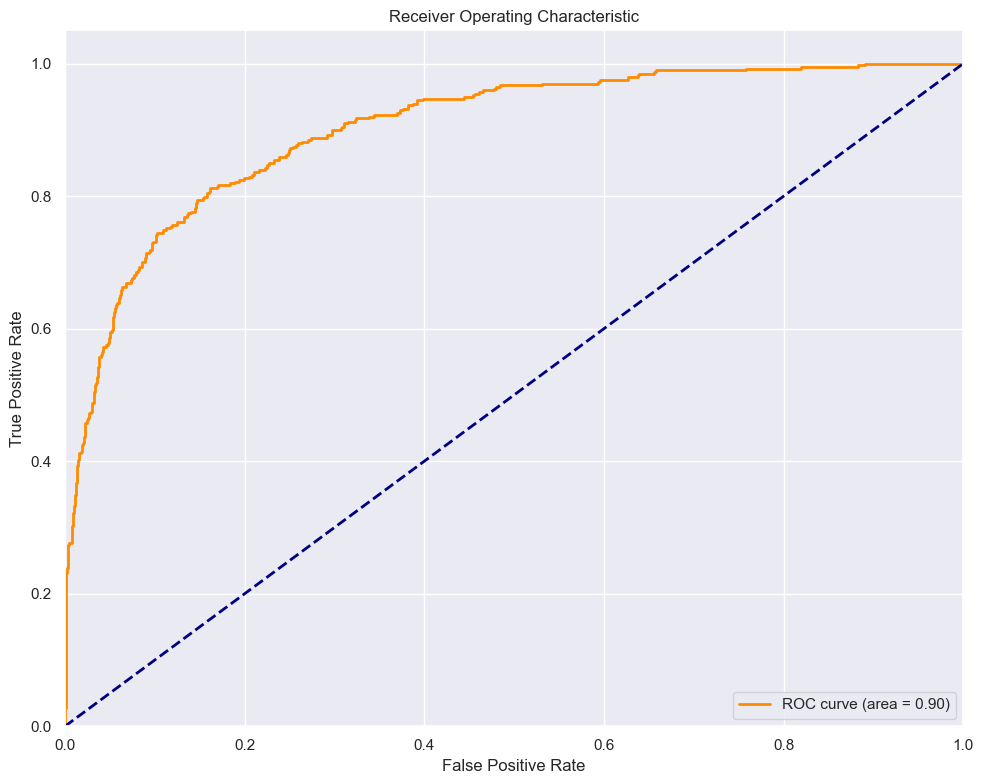

In [157]:
# Predict probabilities
y_score = cat.predict_proba(X_test)[:, 1]
# Compute ROC curve and ROC area
fpr, tpr, _ = roc_curve(y_test, y_score)
roc_auc = auc(fpr, tpr)
# Plot ROC curve
plt.figure(figsize=(10, 8))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()

In [158]:
# Print feature names used for training
print("Features in X_train:", X_train.columns)
# Print feature names in X_test
print("Features in X_test:", X_test.columns)


Features in X_train: Index(['Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'Date_month', 'Date_day'],
      dtype='object')
Features in X_test: Index(['Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'Date_month', 'Date_day'],
      dtype='object')


In [159]:
# Ensure X_test has the same columns as X_train
X_test = X_test[X_train.columns.intersection(X_test.columns)]


In [160]:
rf=RandomForestClassifier()
rf.fit(X_train_res,y_train_res)

RandomForestClassifier()

In [161]:
# Check the columns of X_train and X_test to find any discrepancies
common_features = X_train.columns.intersection(X_test.columns)

# Align both train and test data with common features
X_train_aligned = X_train[common_features]
X_test_aligned = X_test[common_features]

# Re-train the model
rf = RandomForestClassifier(random_state=0)
rf.fit(X_train_aligned, y_train)

# Predict using the aligned test set
y_pred1 = rf.predict(X_test_aligned)

print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred1))

print("Accuracy Score:")
print(accuracy_score(y_test, y_pred1))

print("Classification Report:")
print(classification_report(y_test, y_pred1))

Confusion Matrix:
[[1254   33]
 [ 174  224]]
Accuracy Score:
0.8771513353115727
Classification Report:
              precision    recall  f1-score   support

       False       0.88      0.97      0.92      1287
        True       0.87      0.56      0.68       398

    accuracy                           0.88      1685
   macro avg       0.87      0.77      0.80      1685
weighted avg       0.88      0.88      0.87      1685



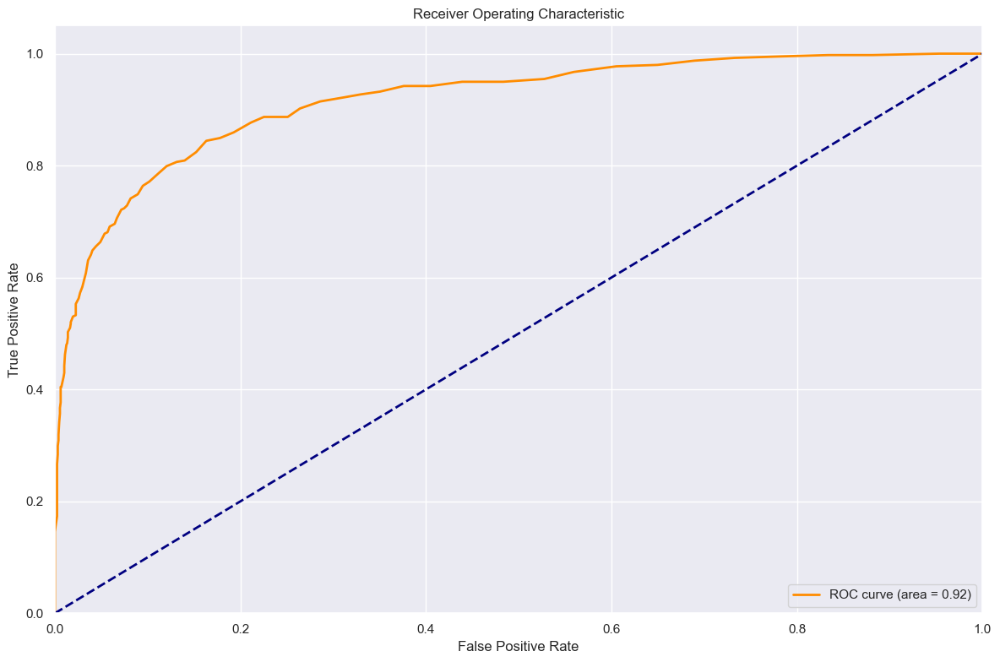

ROC AUC Score: 0.9159345679446182


In [162]:
# Predict probabilities for the positive class
y_score = rf.predict_proba(X_test)[:, 1]
# Compute ROC curve and ROC AUC score
fpr, tpr, _ = roc_curve(y_test, y_score)
roc_auc = auc(fpr, tpr)
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()
roc_auc_score_value = roc_auc_score(y_test, y_score)
print("ROC AUC Score:", roc_auc_score_value)

In [163]:
# Create an imputer
imputer = SimpleImputer(strategy='mean')  # You can use 'median' or 'most_frequent' as alternatives
# Create a pipeline with imputation, scaling, and logistic regression
pipeline = make_pipeline(
    imputer,
    StandardScaler(),
    LogisticRegression(max_iter=200, random_state=0)
)
pipeline.fit(X_train, y_train)

Pipeline(steps=[('simpleimputer', SimpleImputer()),
                ('standardscaler', StandardScaler()),
                ('logisticregression',
                 LogisticRegression(max_iter=200, random_state=0))])

In [164]:
# Create an imputer
imputer = SimpleImputer(strategy='mean')  # You can use 'median' or 'most_frequent' as alternatives

# Create a pipeline with imputation, scaling, and logistic regression
pipeline = make_pipeline(
    imputer,
    StandardScaler(),
    LogisticRegression(max_iter=200, random_state=0)
)

# Fit the pipeline
pipeline.fit(X_train, y_train)

# Predict with the pipeline
y_pred2 = pipeline.predict(X_test)

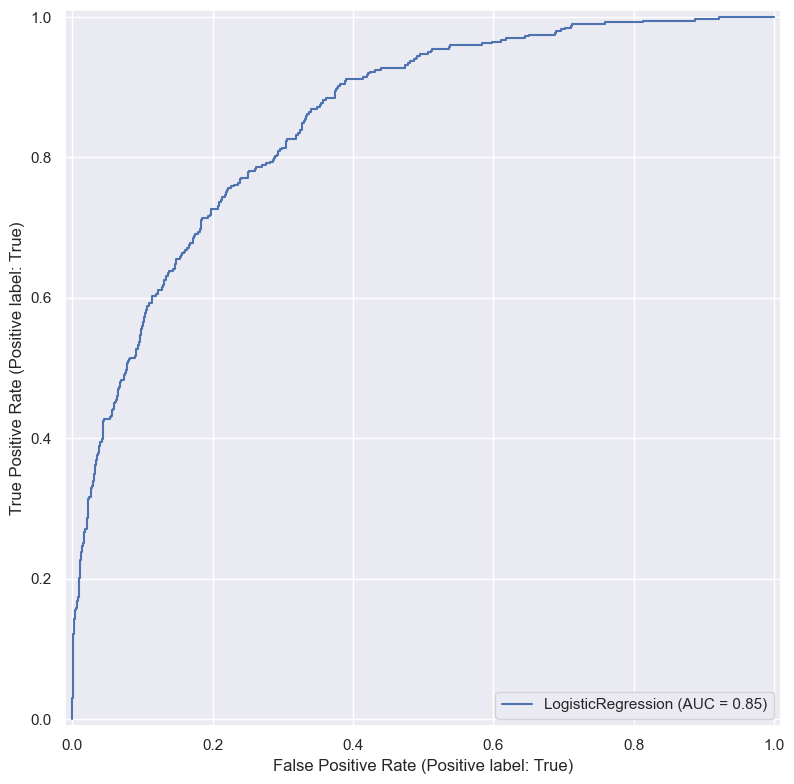

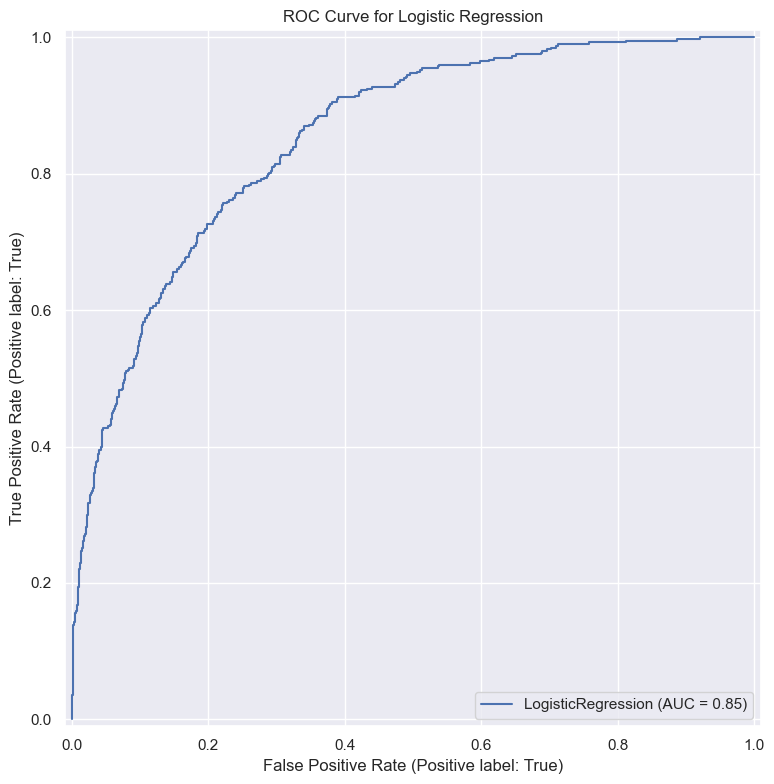

ROC AUC Score: 0.8523581387902995


In [165]:
# Impute missing values
imputer = SimpleImputer(strategy='mean')
X_train_imputed = imputer.fit_transform(X_train)
X_test_imputed = imputer.transform(X_test)

# Fit the logistic regression model
logreg = LogisticRegression(max_iter=200, random_state=0)
logreg.fit(X_train_imputed, y_train)

# Predict probabilities
y_prob = logreg.predict_proba(X_test_imputed)[:, 1]

# Plot ROC curve
roc_curve_display = RocCurveDisplay.from_estimator(logreg, X_test_imputed, y_test)
roc_curve_display.plot()
plt.title('ROC Curve for Logistic Regression')
plt.show()

# Calculate ROC AUC score
roc_auc = roc_auc_score(y_test, y_prob)
print("ROC AUC Score:", roc_auc)

In [166]:
gnb = GaussianNB()
gnb.fit(X_train_res, y_train_res)

GaussianNB()

Confusion Matrix:
[[1058  229]
 [ 135  263]]

Accuracy Score:
0.7839762611275964

Classification Report:
              precision    recall  f1-score   support

       False       0.89      0.82      0.85      1287
        True       0.53      0.66      0.59       398

    accuracy                           0.78      1685
   macro avg       0.71      0.74      0.72      1685
weighted avg       0.80      0.78      0.79      1685



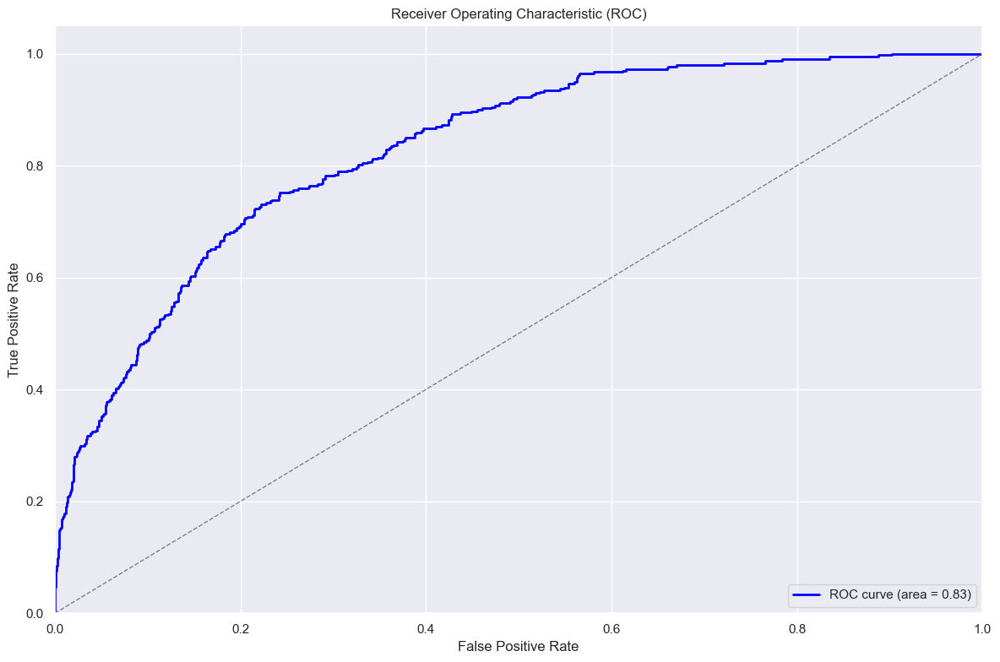

In [167]:
# Impute missing values
imputer = SimpleImputer(strategy='mean')
X_train_imputed = imputer.fit_transform(X_train)
X_test_imputed = imputer.transform(X_test)

# Train the GNB model with imputed data
gnb.fit(X_train_imputed, y_train)

# Predict with GNB
y_pred3 = gnb.predict(X_test_imputed)

# Print evaluation metrics
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred3))

print("\nAccuracy Score:")
print(accuracy_score(y_test, y_pred3))

print("\nClassification Report:")
print(classification_report(y_test, y_pred3))

# Compute ROC curve and AUC
y_prob3 = gnb.predict_proba(X_test_imputed)[:, 1]
fpr, tpr, _ = roc_curve(y_test, y_prob3)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='grey', lw=1, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc='lower right')
plt.show()

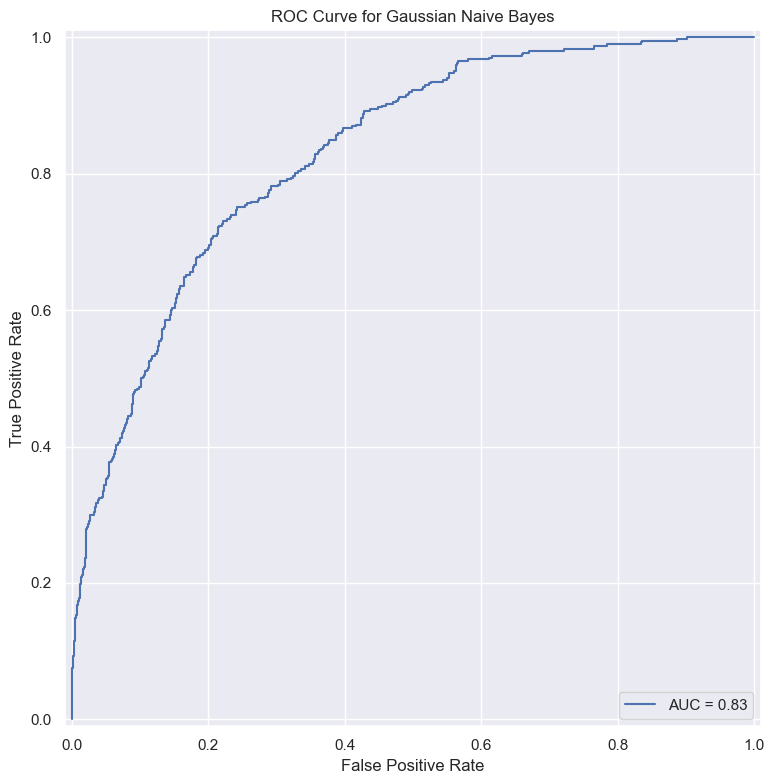

ROC AUC Score: 0.83


In [168]:
# Impute missing values in X_test
imputer = SimpleImputer(strategy='mean')  # Use mean imputation, or other strategies as needed
X_test_imputed = imputer.fit_transform(X_test)
# Get probabilities for the positive class
y_prob3 = gnb.predict_proba(X_test_imputed)[:, 1]
# Compute ROC curve
fpr, tpr, _ = metrics.roc_curve(y_test, y_prob3)
# Plot ROC curve using RocCurveDisplay
roc_curve_display = metrics.RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=metrics.roc_auc_score(y_test, y_prob3))
roc_curve_display.plot()
plt.title('ROC Curve for Gaussian Naive Bayes')
plt.show()
roc_auc = metrics.roc_auc_score(y_test, y_prob3)
print(f'ROC AUC Score: {roc_auc:.2f}')

In [169]:
knn = KNeighborsClassifier(n_neighbors=3)
knn.fit(X_train_res, y_train_res)

KNeighborsClassifier(n_neighbors=3)

In [170]:
from sklearn.impute import SimpleImputer

# Create an imputer object with a strategy (mean, median, or most_frequent)
imputer = SimpleImputer(strategy='mean')

# Fit the imputer on the training data and transform both training and test data
X_train_imputed = imputer.fit_transform(X_train)
X_test_imputed = imputer.transform(X_test)
# If using imputed data
y_pred4 = knn.predict(X_test_imputed)
# Evaluate the model
print(confusion_matrix(y_test, y_pred4))
print(accuracy_score(y_test, y_pred4))
print(classification_report(y_test, y_pred4))


[[1038  249]
 [  95  303]]
0.7958456973293768
              precision    recall  f1-score   support

       False       0.92      0.81      0.86      1287
        True       0.55      0.76      0.64       398

    accuracy                           0.80      1685
   macro avg       0.73      0.78      0.75      1685
weighted avg       0.83      0.80      0.81      1685



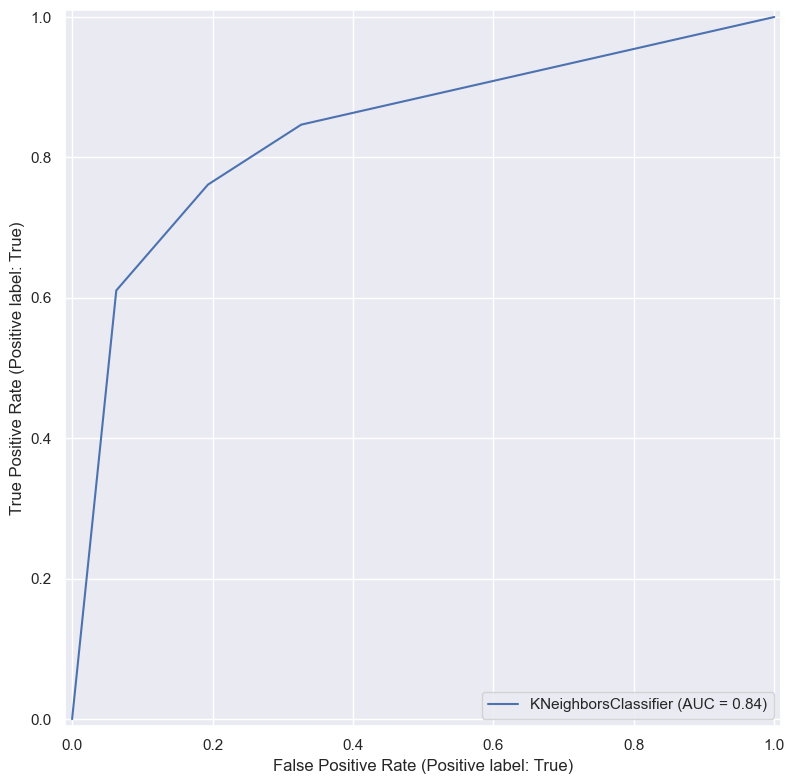

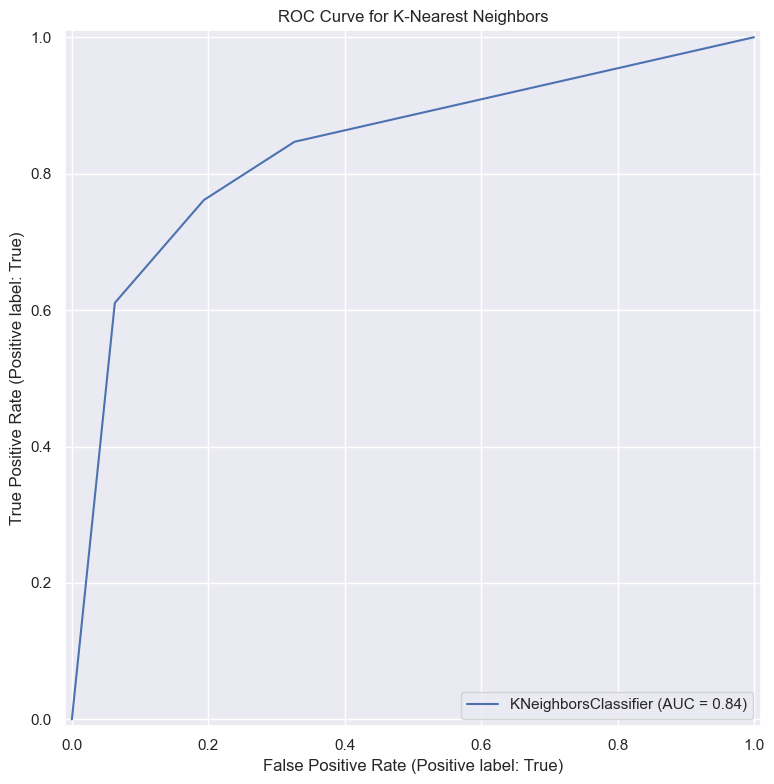

ROC AUC Score: 0.7839166695950617


In [171]:
roc_curve_display = RocCurveDisplay.from_estimator(knn, X_test_imputed, y_test, response_method='predict_proba')
roc_curve_display.plot()
plt.title('ROC Curve for K-Nearest Neighbors')
plt.show()

# Calculate and print ROC AUC score
auc_score = metrics.roc_auc_score(y_test, y_pred4)
print(f'ROC AUC Score: {auc_score}')

In [172]:
xgb = XGBClassifier()
xgb.fit(X_train_res, y_train_res)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [173]:
# Make predictions
y_pred6 = xgb.predict(X_test_imputed)
print(confusion_matrix(y_test, y_pred6))
print(accuracy_score(y_test, y_pred6))
print(classification_report(y_test, y_pred6))

[[1223   64]
 [ 137  261]]
0.8807121661721068
              precision    recall  f1-score   support

       False       0.90      0.95      0.92      1287
        True       0.80      0.66      0.72       398

    accuracy                           0.88      1685
   macro avg       0.85      0.80      0.82      1685
weighted avg       0.88      0.88      0.88      1685



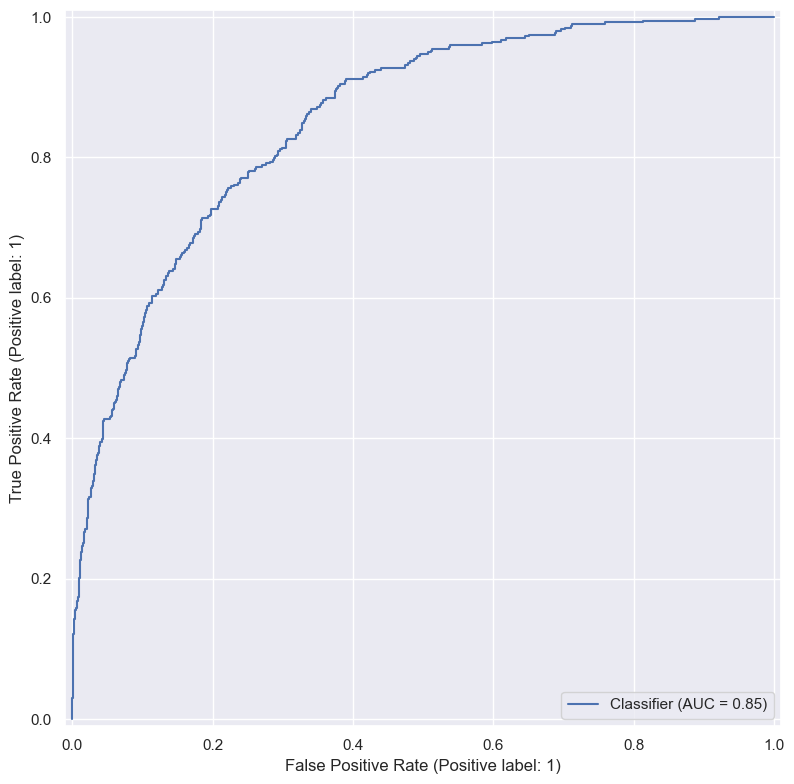

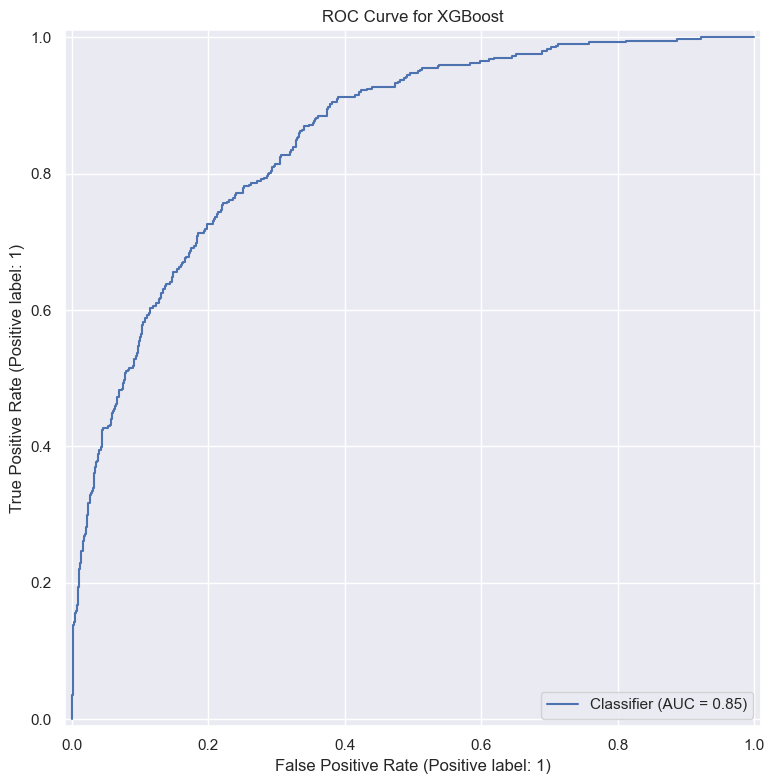

In [174]:
roc_curve_display = RocCurveDisplay.from_predictions(y_test, y_prob)
roc_curve_display.plot()
plt.title('ROC Curve for XGBoost')
plt.show()

In [175]:
svc = SVC()
svc.fit(X_train_res, y_train_res)

SVC()

In [176]:
y_pred5 = svc.predict(X_test_imputed)
print(confusion_matrix(y_test,y_pred5))
print(accuracy_score(y_test,y_pred5))
print(classification_report(y_test,y_pred5))

[[1012  275]
 [ 109  289]]
0.7721068249258161
              precision    recall  f1-score   support

       False       0.90      0.79      0.84      1287
        True       0.51      0.73      0.60       398

    accuracy                           0.77      1685
   macro avg       0.71      0.76      0.72      1685
weighted avg       0.81      0.77      0.78      1685



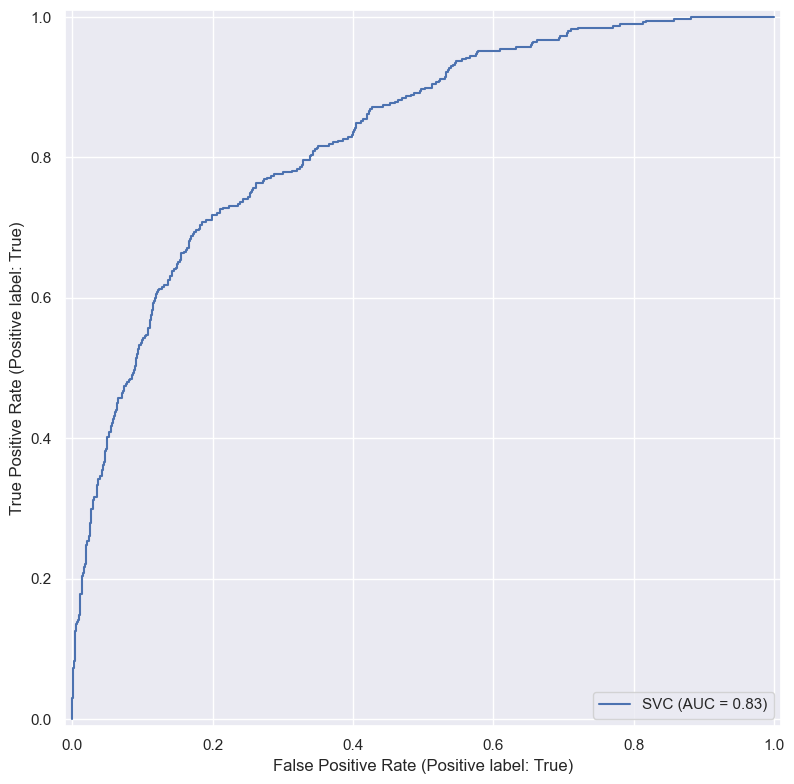

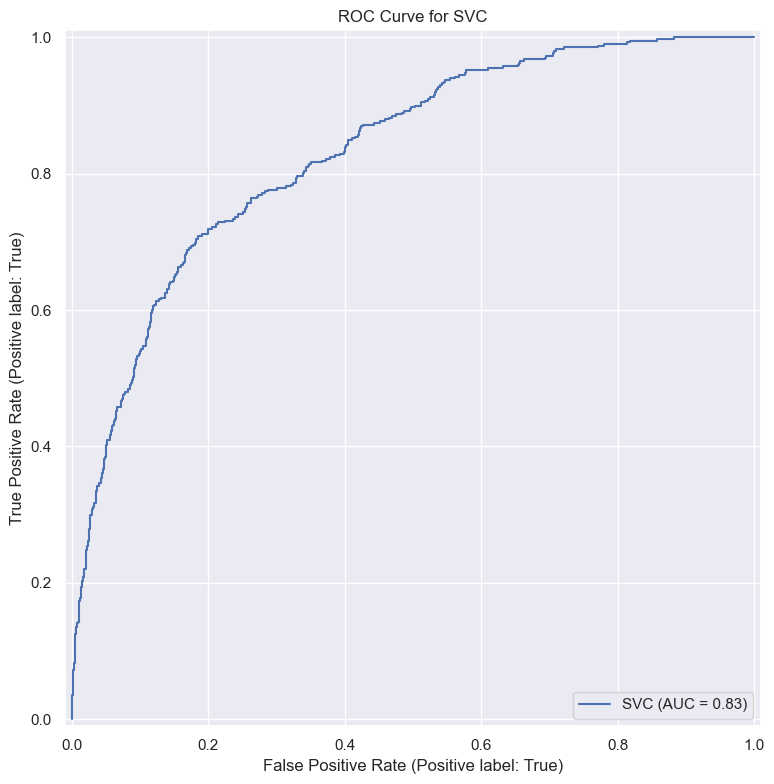

In [177]:
# Plot the ROC curve
roc_curve_display = RocCurveDisplay.from_estimator(svc, X_test_imputed, y_test)
roc_curve_display.plot()
plt.title('ROC Curve for SVC')
plt.show()

In [178]:
joblib.dump(xgb, "Rainfall_Prediction_Final_Model.pkl")

['Rainfall_Prediction_Final_Model.pkl']